# Import

In [ ]:
import torch
from torch import nn
import torchvision
import torchvision.transforms as transforms
from torch.utils.data import DataLoader
import os
import numpy as np
import torch.optim as optim

from tqdm import tqdm
from torch.autograd import Variable
from torchvision.models.vgg import vgg16

import math
import matplotlib.pyplot as plt
torch.manual_seed(42)

# Загрузка данных

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import zipfile
with zipfile.ZipFile('/content/drive/MyDrive/datasets/animals.zip', 'r') as zip_ref:
  zip_ref.extractall('/content/dataset')

# Dataloader

In [ ]:
import shutil
os.mkdir('/content/dataset/afhq/Data_train')
os.mkdir('/content/dataset/afhq/Data_val')
cnt=0
for i in os.listdir("/content/dataset/afhq/train"):
    for j in os.listdir("/content/dataset/afhq/train"+"/"+str(i)):
      if cnt == 3:
        cnt=0
        shutil.move("/content/dataset/afhq/train"+"/"+str(i)+"/"+str(j), '/content/dataset/afhq/Data_train')
      else:
        cnt+=1
cnt=0
for i in os.listdir("/content/dataset/afhq/val"):
    for j in os.listdir("/content/dataset/afhq/val"+"/"+str(i)):
      if cnt == 3:
        cnt=0
        shutil.move("/content/dataset/afhq/val"+"/"+str(i)+"/"+str(j), '/content/dataset/afhq/Data_val')
      else:
        cnt+=1

In [ ]:
from PIL import Image
from torch.utils.data.dataset import Dataset

def train_hr_transform(hr_size):
    return transforms.Compose([
        transforms.Resize((hr_size,hr_size),Image.BICUBIC),
        transforms.ToTensor(),
    ])


def train_lr_transform(lr_size):
    return transforms.Compose([
        transforms.Resize((lr_size,lr_size), interpolation=Image.NEAREST),
        transforms.ToTensor()
    ])

def is_image_file(filename):
    return any(filename.endswith(extension) for extension in ['.png', '.jpg', '.jpeg', '.PNG', '.JPG', '.JPEG'])


class DatasetFromFolder(Dataset):
    def __init__(self, dataset_dir, lr_size, hr_size):
        super(DatasetFromFolder, self).__init__()
        self.image_filenames = [(dataset_dir+'/'+str(x)) for x in os.listdir(dataset_dir) if is_image_file(x)]
        self.hr_transform = train_hr_transform(hr_size)
        self.lr_transform = train_lr_transform(lr_size)

    def __getitem__(self, index):
        hr_image = self.hr_transform(Image.open(self.image_filenames[index]))
        lr_image = self.lr_transform(Image.open(self.image_filenames[index]))
        return lr_image, hr_image

    def __len__(self):
        return len(self.image_filenames)


In [ ]:
train_set = DatasetFromFolder('/content/dataset/afhq/Data_train', lr_size=64, hr_size=512)
val_set = DatasetFromFolder('/content/dataset/afhq/Data_train',lr_size=64, hr_size=512)

In [ ]:
cnt=0
for i in range(5):
  fig, (ax1,ax2,ax3,ax4,ax5) = plt.subplots(1,5, figsize = (20, 10))
  for j in range(5):
    if j==0:
      ax1.imshow(train_set[cnt][1].cpu().detach().numpy().transpose((1, 2, 0)).squeeze())
    elif j == 1:
      ax2.imshow(train_set[cnt][1].cpu().detach().numpy().transpose((1, 2, 0)).squeeze())
    elif j == 2:
      ax3.imshow(train_set[cnt][1].cpu().detach().numpy().transpose((1, 2, 0)).squeeze())
    elif j == 3:
      ax4.imshow(train_set[cnt][1].cpu().detach().numpy().transpose((1, 2, 0)).squeeze())
    elif j == 4:
      ax5.imshow(train_set[cnt][1].cpu().detach().numpy().transpose((1, 2, 0)).squeeze())
    cnt+=1
    fig.show()

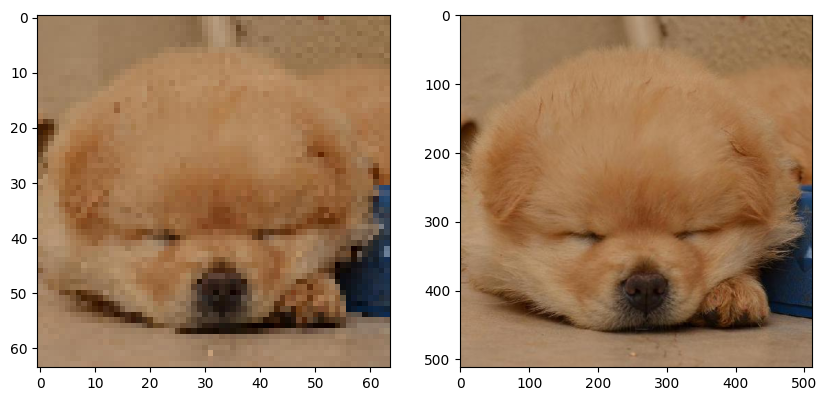

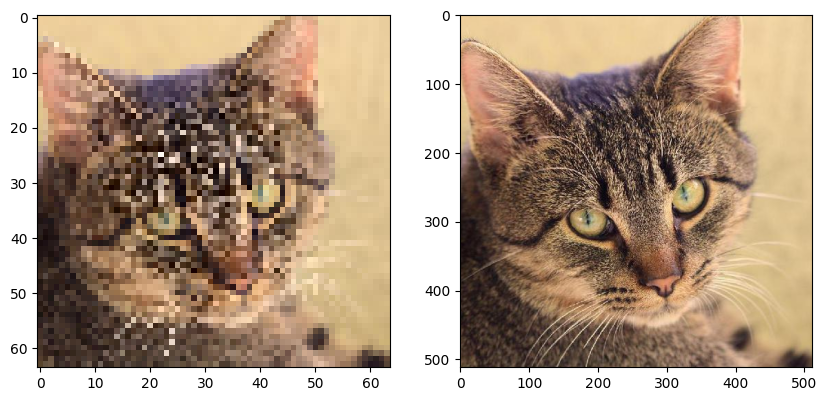

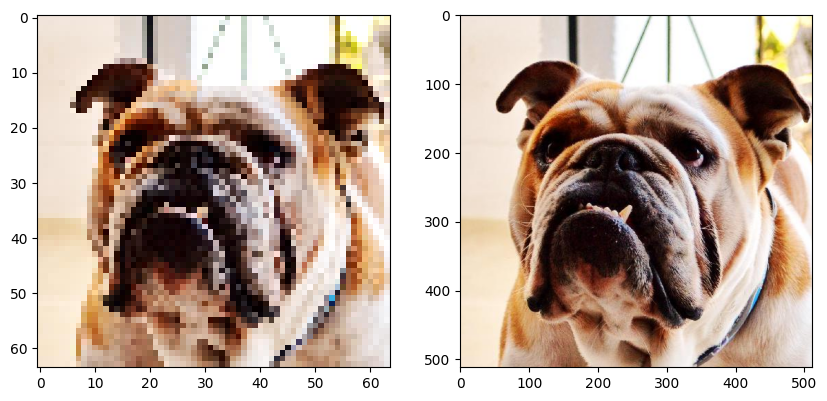

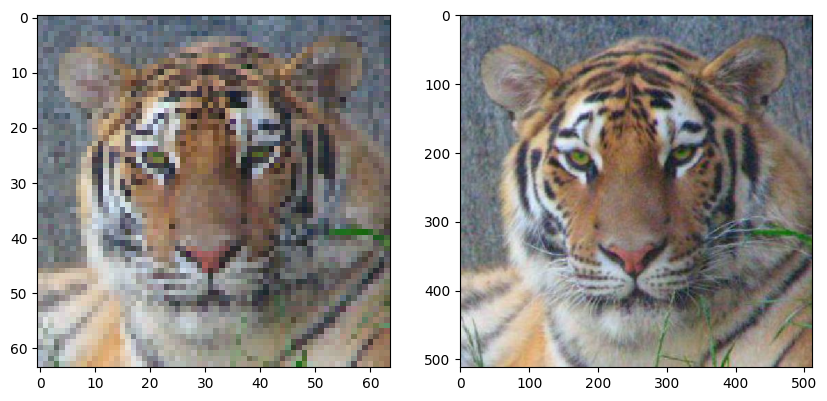

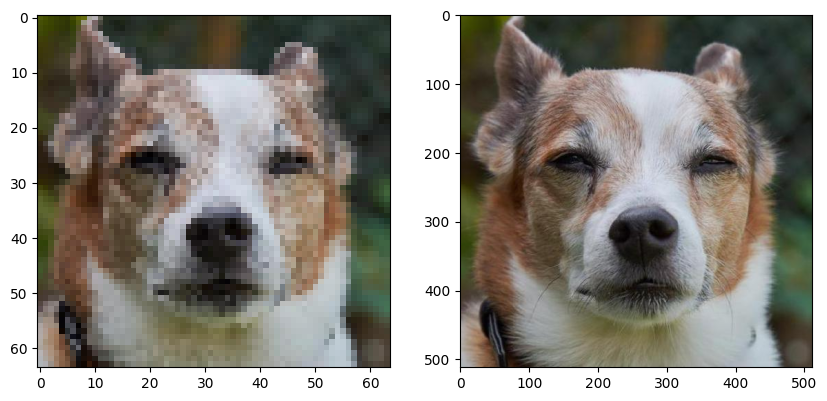

In [ ]:
for i in range(5):
  fig, (ax1,ax2) = plt.subplots(1,2, figsize = (10, 5))
  ax1.imshow(train_set[i][0].detach().numpy().transpose((1, 2, 0)).squeeze())
  ax2.imshow(train_set[i][1].detach().numpy().transpose((1, 2, 0)).squeeze())
  fig.show()

In [ ]:
train_loader = DataLoader(dataset=train_set, num_workers=1, batch_size=8, shuffle=True)
val_loader = DataLoader(dataset=val_set, num_workers=1, batch_size=1, shuffle=False)

In [ ]:
import torchvision.models as models_pt
class FeatureExtractor(nn.Module):
  def __init__(self):
    super(FeatureExtractor, self).__init__()
    vgg11_model = models_pt.vgg11(pretrained=True)
    self.feature_extractor = nn.Sequential(*list(vgg11_model.features.children())[:11])

  def forward(self, img):
    return self.feature_extractor(img)

# Архитектура генератора 1

In [ ]:
class Generator1(nn.Module):
    def __init__(self):
        super(Generator1, self).__init__()
        self.net = nn.Sequential(
            nn.ConvTranspose2d(3, 256, kernel_size = 4,stride = 2, padding = 1),
            nn.BatchNorm2d(256),
            nn.PReLU(),

            nn.ConvTranspose2d(256, 128, kernel_size=4,stride = 2, padding=1),
            nn.BatchNorm2d(128),
            nn.PReLU(),

            nn.ConvTranspose2d(128, 64, kernel_size=4,stride = 2, padding=1),
            nn.BatchNorm2d(64),
            nn.PReLU(),

            nn.Conv2d(64, 3, kernel_size=3,stride = 1, padding=1),
            nn.Tanh()
        )

    def forward(self, x):
        return self.net(x)

In [ ]:
from torchsummary import summary
G1 = Generator1().cuda()
summary(G1,(3,64,64),batch_size=8)

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
   ConvTranspose2d-1         [8, 256, 128, 128]          12,288
       BatchNorm2d-2         [8, 256, 128, 128]             512
             PReLU-3         [8, 256, 128, 128]               1
   ConvTranspose2d-4         [8, 128, 256, 256]         524,416
       BatchNorm2d-5         [8, 128, 256, 256]             256
             PReLU-6         [8, 128, 256, 256]               1
   ConvTranspose2d-7          [8, 64, 512, 512]         131,136
       BatchNorm2d-8          [8, 64, 512, 512]             128
             PReLU-9          [8, 64, 512, 512]               1
           Conv2d-10           [8, 3, 512, 512]           1,731
             Tanh-11           [8, 3, 512, 512]               0
Total params: 670,470
Trainable params: 670,470
Non-trainable params: 0
----------------------------------------------------------------
Input size (MB): 0.38
Forward/

In [ ]:
class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        self.main = nn.Sequential(
            nn.Conv2d(3, 64, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),

            nn.Conv2d(64, 128, 8, 4, 2, bias=False),
            nn.BatchNorm2d(128),
            nn.LeakyReLU(0.2, inplace=True),

            nn.Conv2d(128, 256, 8, 4, 2, bias=False),
            nn.BatchNorm2d(256),
            nn.LeakyReLU(0.2, inplace=True),

            nn.Conv2d(256, 512, 8, 4, 2, bias=False),
            nn.BatchNorm2d(512),
            nn.LeakyReLU(0.2, inplace=True),

            nn.Conv2d(512, 1, 4, 1, 0, bias=False),
            nn.Sigmoid()
        )

    def forward(self, input):
        return self.main(input)

In [ ]:
D = Discriminator().cuda()
summary(D,(3,512,512),batch_size=8)

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1          [8, 64, 256, 256]           3,072
         LeakyReLU-2          [8, 64, 256, 256]               0
            Conv2d-3           [8, 128, 64, 64]         524,288
       BatchNorm2d-4           [8, 128, 64, 64]             256
         LeakyReLU-5           [8, 128, 64, 64]               0
            Conv2d-6           [8, 256, 16, 16]       2,097,152
       BatchNorm2d-7           [8, 256, 16, 16]             512
         LeakyReLU-8           [8, 256, 16, 16]               0
            Conv2d-9             [8, 512, 4, 4]       8,388,608
      BatchNorm2d-10             [8, 512, 4, 4]           1,024
        LeakyReLU-11             [8, 512, 4, 4]               0
           Conv2d-12               [8, 1, 1, 1]           8,192
          Sigmoid-13               [8, 1, 1, 1]               0
Total params: 11,023,104
Trainable para

## Обучение архитектуры 1

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG11_Weights.IMAGENET1K_V1`. You can also use `weights=VGG11_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Starting Training Loop...


  0%|          | 1/462 [00:01<09:10,  1.19s/it]

[0/5][0/462]	Loss_D: 1.5326	Loss_G: 2.2713	D(x): 0.5399	D(G(z)): 0.5825 / 0.0000



  2%|▏         | 11/462 [00:11<07:33,  1.01s/it]

[0/5][10/462]	Loss_D: 0.0182	Loss_G: 1.2488	D(x): 0.9996	D(G(z)): 0.0166 / 0.0055



  5%|▍         | 21/462 [00:21<07:30,  1.02s/it]

[0/5][20/462]	Loss_D: 0.0008	Loss_G: 1.1283	D(x): 0.9993	D(G(z)): 0.0000 / 0.0000



  7%|▋         | 31/462 [00:31<07:35,  1.06s/it]

[0/5][30/462]	Loss_D: 0.0084	Loss_G: 0.9560	D(x): 1.0000	D(G(z)): 0.0081 / 0.0010



  9%|▉         | 41/462 [00:42<07:26,  1.06s/it]

[0/5][40/462]	Loss_D: 0.0002	Loss_G: 0.8788	D(x): 0.9999	D(G(z)): 0.0001 / 0.0001



 11%|█         | 51/462 [00:53<07:15,  1.06s/it]

[0/5][50/462]	Loss_D: 0.0000	Loss_G: 0.8888	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000



 13%|█▎        | 61/462 [01:03<07:00,  1.05s/it]

[0/5][60/462]	Loss_D: 0.0001	Loss_G: 0.7207	D(x): 0.9999	D(G(z)): 0.0000 / 0.0000



 15%|█▌        | 71/462 [01:13<06:45,  1.04s/it]

[0/5][70/462]	Loss_D: 0.0001	Loss_G: 0.6990	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000



 18%|█▊        | 81/462 [01:24<06:34,  1.04s/it]

[0/5][80/462]	Loss_D: 0.0001	Loss_G: 0.8743	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000



 20%|█▉        | 91/462 [01:34<06:23,  1.03s/it]

[0/5][90/462]	Loss_D: 0.0000	Loss_G: 0.8640	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000



 22%|██▏       | 101/462 [01:44<06:13,  1.03s/it]

[0/5][100/462]	Loss_D: 0.0000	Loss_G: 0.7202	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000



 24%|██▍       | 111/462 [01:55<06:05,  1.04s/it]

[0/5][110/462]	Loss_D: 0.0000	Loss_G: 0.7926	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000



 26%|██▌       | 121/462 [02:05<05:57,  1.05s/it]

[0/5][120/462]	Loss_D: 0.0000	Loss_G: 0.8587	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000



 28%|██▊       | 131/462 [02:16<05:48,  1.05s/it]

[0/5][130/462]	Loss_D: 0.0000	Loss_G: 0.6973	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000



 31%|███       | 141/462 [02:26<05:39,  1.06s/it]

[0/5][140/462]	Loss_D: 0.0000	Loss_G: 0.8617	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000



 33%|███▎      | 151/462 [02:37<05:24,  1.04s/it]

[0/5][150/462]	Loss_D: 0.0000	Loss_G: 0.7208	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000



 35%|███▍      | 161/462 [02:47<05:14,  1.05s/it]

[0/5][160/462]	Loss_D: 0.0000	Loss_G: 0.6975	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000



 37%|███▋      | 171/462 [02:58<05:04,  1.05s/it]

[0/5][170/462]	Loss_D: 0.0018	Loss_G: 0.8318	D(x): 1.0000	D(G(z)): 0.0018 / 0.0004



 39%|███▉      | 181/462 [03:08<04:53,  1.05s/it]

[0/5][180/462]	Loss_D: 0.0002	Loss_G: 0.6274	D(x): 0.9998	D(G(z)): 0.0000 / 0.0000



 41%|████▏     | 191/462 [03:19<04:42,  1.04s/it]

[0/5][190/462]	Loss_D: 0.0000	Loss_G: 0.7377	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000



 44%|████▎     | 201/462 [03:29<04:32,  1.04s/it]

[0/5][200/462]	Loss_D: 0.0000	Loss_G: 0.9983	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000



 46%|████▌     | 211/462 [03:39<04:22,  1.05s/it]

[0/5][210/462]	Loss_D: 0.0003	Loss_G: 1.0012	D(x): 1.0000	D(G(z)): 0.0003 / 0.0002



 48%|████▊     | 221/462 [03:50<04:12,  1.05s/it]

[0/5][220/462]	Loss_D: 0.0000	Loss_G: 0.8136	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000



 50%|█████     | 231/462 [04:00<04:00,  1.04s/it]

[0/5][230/462]	Loss_D: 0.0008	Loss_G: 0.6529	D(x): 1.0000	D(G(z)): 0.0008 / 0.0004



 52%|█████▏    | 241/462 [04:11<03:50,  1.04s/it]

[0/5][240/462]	Loss_D: 0.0067	Loss_G: 0.7670	D(x): 1.0000	D(G(z)): 0.0067 / 0.0029



 54%|█████▍    | 251/462 [04:21<03:41,  1.05s/it]

[0/5][250/462]	Loss_D: 0.0005	Loss_G: 0.5553	D(x): 1.0000	D(G(z)): 0.0005 / 0.0001



 56%|█████▋    | 261/462 [04:32<03:30,  1.05s/it]

[0/5][260/462]	Loss_D: 0.0000	Loss_G: 0.7371	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000



 59%|█████▊    | 271/462 [04:42<03:20,  1.05s/it]

[0/5][270/462]	Loss_D: 0.0006	Loss_G: 0.7304	D(x): 0.9994	D(G(z)): 0.0000 / 0.0000



 61%|██████    | 281/462 [04:53<03:08,  1.04s/it]

[0/5][280/462]	Loss_D: 0.0000	Loss_G: 0.8500	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000



 63%|██████▎   | 291/462 [05:03<02:58,  1.04s/it]

[0/5][290/462]	Loss_D: 0.8284	Loss_G: 0.7312	D(x): 0.9795	D(G(z)): 0.2484 / 0.0004



 65%|██████▌   | 301/462 [05:13<02:48,  1.04s/it]

[0/5][300/462]	Loss_D: 0.0049	Loss_G: 0.7857	D(x): 1.0000	D(G(z)): 0.0048 / 0.0001



 67%|██████▋   | 311/462 [05:24<02:38,  1.05s/it]

[0/5][310/462]	Loss_D: 0.0001	Loss_G: 0.8195	D(x): 0.9999	D(G(z)): 0.0000 / 0.0000



 69%|██████▉   | 321/462 [05:34<02:27,  1.05s/it]

[0/5][320/462]	Loss_D: 0.0608	Loss_G: 0.6198	D(x): 0.9539	D(G(z)): 0.0040 / 0.0001



 72%|███████▏  | 331/462 [05:45<02:17,  1.05s/it]

[0/5][330/462]	Loss_D: 0.1774	Loss_G: 0.6048	D(x): 0.9997	D(G(z)): 0.1236 / 0.0131



 74%|███████▍  | 341/462 [05:55<02:06,  1.05s/it]

[0/5][340/462]	Loss_D: 0.0001	Loss_G: 0.6969	D(x): 1.0000	D(G(z)): 0.0001 / 0.0021



 76%|███████▌  | 351/462 [06:06<01:56,  1.05s/it]

[0/5][350/462]	Loss_D: 0.0004	Loss_G: 0.6346	D(x): 0.9996	D(G(z)): 0.0001 / 0.0001



 78%|███████▊  | 361/462 [06:16<01:46,  1.06s/it]

[0/5][360/462]	Loss_D: 0.0002	Loss_G: 0.6203	D(x): 0.9999	D(G(z)): 0.0001 / 0.0001



 80%|████████  | 371/462 [06:27<01:35,  1.05s/it]

[0/5][370/462]	Loss_D: 0.0001	Loss_G: 0.5967	D(x): 0.9999	D(G(z)): 0.0000 / 0.0000



 82%|████████▏ | 381/462 [06:37<01:24,  1.05s/it]

[0/5][380/462]	Loss_D: 0.0001	Loss_G: 0.6663	D(x): 0.9999	D(G(z)): 0.0001 / 0.0018



 85%|████████▍ | 391/462 [06:48<01:14,  1.04s/it]

[0/5][390/462]	Loss_D: 0.0010	Loss_G: 0.6018	D(x): 0.9994	D(G(z)): 0.0003 / 0.0005



 87%|████████▋ | 401/462 [06:58<01:04,  1.05s/it]

[0/5][400/462]	Loss_D: 0.0413	Loss_G: 0.6474	D(x): 0.9640	D(G(z)): 0.0000 / 0.0000



 89%|████████▉ | 411/462 [07:09<00:53,  1.04s/it]

[0/5][410/462]	Loss_D: 0.0210	Loss_G: 0.6082	D(x): 0.9797	D(G(z)): 0.0000 / 0.0000



 91%|█████████ | 421/462 [07:19<00:42,  1.04s/it]

[0/5][420/462]	Loss_D: 0.0013	Loss_G: 0.4613	D(x): 0.9995	D(G(z)): 0.0008 / 0.0006



 93%|█████████▎| 431/462 [07:30<00:32,  1.04s/it]

[0/5][430/462]	Loss_D: 0.0003	Loss_G: 0.6295	D(x): 0.9997	D(G(z)): 0.0000 / 0.0000



 95%|█████████▌| 441/462 [07:40<00:21,  1.04s/it]

[0/5][440/462]	Loss_D: 1.9650	Loss_G: 0.6285	D(x): 1.0000	D(G(z)): 0.6501 / 0.0000



 98%|█████████▊| 451/462 [07:50<00:11,  1.05s/it]

[0/5][450/462]	Loss_D: 0.0462	Loss_G: 0.4819	D(x): 0.9613	D(G(z)): 0.0005 / 0.0002



100%|█████████▉| 461/462 [08:01<00:01,  1.04s/it]

[0/5][460/462]	Loss_D: 0.0041	Loss_G: 0.5416	D(x): 0.9960	D(G(z)): 0.0000 / 0.0000



  0%|          | 1/462 [00:01<09:30,  1.24s/it]

[1/5][0/462]	Loss_D: 0.0037	Loss_G: 0.6165	D(x): 0.9963	D(G(z)): 0.0000 / 0.0000



  2%|▏         | 11/462 [00:11<07:53,  1.05s/it]

[1/5][10/462]	Loss_D: 0.0000	Loss_G: 0.4861	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000



  5%|▍         | 21/462 [00:22<07:41,  1.05s/it]

[1/5][20/462]	Loss_D: 0.0000	Loss_G: 0.5220	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000



  7%|▋         | 31/462 [00:32<07:32,  1.05s/it]

[1/5][30/462]	Loss_D: 0.4303	Loss_G: 0.5281	D(x): 1.0000	D(G(z)): 0.1212 / 0.0000



  9%|▉         | 41/462 [00:43<07:23,  1.05s/it]

[1/5][40/462]	Loss_D: 0.2234	Loss_G: 0.5401	D(x): 0.8944	D(G(z)): 0.0001 / 0.0001



 11%|█         | 51/462 [00:53<07:10,  1.05s/it]

[1/5][50/462]	Loss_D: 0.0111	Loss_G: 0.4874	D(x): 0.9892	D(G(z)): 0.0000 / 0.0000



 13%|█▎        | 61/462 [01:04<06:59,  1.05s/it]

[1/5][60/462]	Loss_D: 0.2806	Loss_G: 0.4713	D(x): 0.8104	D(G(z)): 0.0000 / 0.0001



 15%|█▌        | 71/462 [01:14<06:50,  1.05s/it]

[1/5][70/462]	Loss_D: 0.0032	Loss_G: 0.6264	D(x): 0.9968	D(G(z)): 0.0000 / 0.0000



 18%|█▊        | 81/462 [01:25<06:39,  1.05s/it]

[1/5][80/462]	Loss_D: 0.0132	Loss_G: 0.6055	D(x): 0.9873	D(G(z)): 0.0000 / 0.0000



 20%|█▉        | 91/462 [01:35<06:30,  1.05s/it]

[1/5][90/462]	Loss_D: 0.3285	Loss_G: 0.5332	D(x): 1.0000	D(G(z)): 0.2221 / 0.0082



 22%|██▏       | 101/462 [01:46<06:19,  1.05s/it]

[1/5][100/462]	Loss_D: 0.0090	Loss_G: 0.5978	D(x): 0.9911	D(G(z)): 0.0000 / 0.0000



 24%|██▍       | 111/462 [01:56<06:07,  1.05s/it]

[1/5][110/462]	Loss_D: 1.3736	Loss_G: 0.4903	D(x): 0.7062	D(G(z)): 0.0000 / 0.0000



 26%|██▌       | 121/462 [02:07<05:56,  1.05s/it]

[1/5][120/462]	Loss_D: 0.3060	Loss_G: 0.4420	D(x): 0.9955	D(G(z)): 0.1862 / 0.0042



 28%|██▊       | 131/462 [02:17<05:46,  1.05s/it]

[1/5][130/462]	Loss_D: 0.1114	Loss_G: 0.5331	D(x): 0.9980	D(G(z)): 0.0774 / 0.0330



 31%|███       | 141/462 [02:27<05:36,  1.05s/it]

[1/5][140/462]	Loss_D: 0.2400	Loss_G: 0.5716	D(x): 0.9895	D(G(z)): 0.1429 / 0.2157



 33%|███▎      | 151/462 [02:38<05:25,  1.05s/it]

[1/5][150/462]	Loss_D: 3.5279	Loss_G: 0.5925	D(x): 0.9617	D(G(z)): 0.7001 / 0.5202



 35%|███▍      | 161/462 [02:48<05:15,  1.05s/it]

[1/5][160/462]	Loss_D: 5.1346	Loss_G: 0.7848	D(x): 0.6165	D(G(z)): 0.3909 / 0.4172



 37%|███▋      | 171/462 [02:59<05:04,  1.05s/it]

[1/5][170/462]	Loss_D: 1.2817	Loss_G: 0.4823	D(x): 0.7494	D(G(z)): 0.2316 / 0.1571



 39%|███▉      | 181/462 [03:09<04:55,  1.05s/it]

[1/5][180/462]	Loss_D: 0.2385	Loss_G: 0.4547	D(x): 0.9701	D(G(z)): 0.1232 / 0.0474



 41%|████▏     | 191/462 [03:20<04:42,  1.04s/it]

[1/5][190/462]	Loss_D: 0.0705	Loss_G: 0.4569	D(x): 0.9543	D(G(z)): 0.0196 / 0.0239



 44%|████▎     | 201/462 [03:30<04:32,  1.05s/it]

[1/5][200/462]	Loss_D: 1.0088	Loss_G: 0.4934	D(x): 0.6559	D(G(z)): 0.0433 / 0.0233



 46%|████▌     | 211/462 [03:41<04:22,  1.05s/it]

[1/5][210/462]	Loss_D: 0.2269	Loss_G: 0.4754	D(x): 0.9589	D(G(z)): 0.1018 / 0.0252



 48%|████▊     | 221/462 [03:51<04:12,  1.05s/it]

[1/5][220/462]	Loss_D: 2.0401	Loss_G: 0.6372	D(x): 0.3433	D(G(z)): 0.0001 / 0.0278



 50%|█████     | 231/462 [04:02<04:03,  1.05s/it]

[1/5][230/462]	Loss_D: 6.5692	Loss_G: 0.4675	D(x): 1.0000	D(G(z)): 0.9859 / 0.9595



 52%|█████▏    | 241/462 [04:12<03:51,  1.05s/it]

[1/5][240/462]	Loss_D: 0.2098	Loss_G: 0.5849	D(x): 0.9790	D(G(z)): 0.1416 / 0.3461



 54%|█████▍    | 251/462 [04:23<03:40,  1.05s/it]

[1/5][250/462]	Loss_D: 0.3929	Loss_G: 0.6220	D(x): 0.7855	D(G(z)): 0.0455 / 0.1100



 56%|█████▋    | 261/462 [04:33<03:31,  1.05s/it]

[1/5][260/462]	Loss_D: 2.9457	Loss_G: 0.5829	D(x): 0.3661	D(G(z)): 0.0005 / 0.0005



 59%|█████▊    | 271/462 [04:44<03:20,  1.05s/it]

[1/5][270/462]	Loss_D: 0.2637	Loss_G: 0.5385	D(x): 0.9985	D(G(z)): 0.1227 / 0.0078



 61%|██████    | 281/462 [04:54<03:10,  1.05s/it]

[1/5][280/462]	Loss_D: 0.6071	Loss_G: 0.5963	D(x): 0.9978	D(G(z)): 0.3413 / 0.1863



 63%|██████▎   | 291/462 [05:05<02:59,  1.05s/it]

[1/5][290/462]	Loss_D: 1.7379	Loss_G: 0.5350	D(x): 0.3722	D(G(z)): 0.0000 / 0.0001



 65%|██████▌   | 301/462 [05:15<02:49,  1.05s/it]

[1/5][300/462]	Loss_D: 0.3321	Loss_G: 0.6480	D(x): 0.7841	D(G(z)): 0.0002 / 0.0004



 67%|██████▋   | 311/462 [05:26<02:38,  1.05s/it]

[1/5][310/462]	Loss_D: 0.0088	Loss_G: 0.4379	D(x): 0.9962	D(G(z)): 0.0049 / 0.0010



 69%|██████▉   | 321/462 [05:36<02:27,  1.05s/it]

[1/5][320/462]	Loss_D: 0.0420	Loss_G: 0.5712	D(x): 0.9945	D(G(z)): 0.0342 / 0.0088



 72%|███████▏  | 331/462 [05:47<02:17,  1.05s/it]

[1/5][330/462]	Loss_D: 1.3154	Loss_G: 0.5879	D(x): 0.9985	D(G(z)): 0.4295 / 0.7236



 74%|███████▍  | 341/462 [05:57<02:06,  1.05s/it]

[1/5][340/462]	Loss_D: 0.0506	Loss_G: 0.5017	D(x): 0.9585	D(G(z)): 0.0004 / 0.0021



 76%|███████▌  | 351/462 [06:08<01:56,  1.05s/it]

[1/5][350/462]	Loss_D: 0.2122	Loss_G: 0.5156	D(x): 0.9522	D(G(z)): 0.1080 / 0.1258



 78%|███████▊  | 361/462 [06:18<01:46,  1.05s/it]

[1/5][360/462]	Loss_D: 0.0404	Loss_G: 0.5006	D(x): 0.9930	D(G(z)): 0.0316 / 0.0113



 80%|████████  | 371/462 [06:29<01:36,  1.06s/it]

[1/5][370/462]	Loss_D: 0.1428	Loss_G: 0.4319	D(x): 0.9985	D(G(z)): 0.1071 / 0.0536



 82%|████████▏ | 381/462 [06:39<01:24,  1.05s/it]

[1/5][380/462]	Loss_D: 0.0387	Loss_G: 0.4441	D(x): 0.9965	D(G(z)): 0.0336 / 0.0580



 85%|████████▍ | 391/462 [06:50<01:14,  1.05s/it]

[1/5][390/462]	Loss_D: 0.0040	Loss_G: 0.4456	D(x): 0.9980	D(G(z)): 0.0021 / 0.0016



 87%|████████▋ | 401/462 [07:00<01:03,  1.05s/it]

[1/5][400/462]	Loss_D: 0.1414	Loss_G: 0.4946	D(x): 0.8992	D(G(z)): 0.0005 / 0.0008



 89%|████████▉ | 411/462 [07:11<00:53,  1.05s/it]

[1/5][410/462]	Loss_D: 0.7623	Loss_G: 0.4924	D(x): 0.7537	D(G(z)): 0.0004 / 0.0003



 91%|█████████ | 421/462 [07:21<00:42,  1.05s/it]

[1/5][420/462]	Loss_D: 0.0093	Loss_G: 0.6189	D(x): 0.9997	D(G(z)): 0.0087 / 0.0063



 93%|█████████▎| 431/462 [07:32<00:32,  1.05s/it]

[1/5][430/462]	Loss_D: 0.6048	Loss_G: 0.3608	D(x): 0.9997	D(G(z)): 0.2621 / 0.0095



 95%|█████████▌| 441/462 [07:42<00:21,  1.05s/it]

[1/5][440/462]	Loss_D: 0.4176	Loss_G: 0.5565	D(x): 0.8087	D(G(z)): 0.0817 / 0.0857



 98%|█████████▊| 451/462 [07:53<00:11,  1.05s/it]

[1/5][450/462]	Loss_D: 1.2208	Loss_G: 0.5529	D(x): 0.9341	D(G(z)): 0.2952 / 0.2233



100%|█████████▉| 461/462 [08:03<00:01,  1.05s/it]

[1/5][460/462]	Loss_D: 0.0011	Loss_G: 0.5031	D(x): 1.0000	D(G(z)): 0.0011 / 0.0050



  0%|          | 1/462 [00:01<09:01,  1.18s/it]

[2/5][0/462]	Loss_D: 2.4115	Loss_G: 0.4993	D(x): 0.9987	D(G(z)): 0.5217 / 0.2520



  2%|▏         | 11/462 [00:11<07:55,  1.05s/it]

[2/5][10/462]	Loss_D: 0.1442	Loss_G: 0.4423	D(x): 0.9821	D(G(z)): 0.0799 / 0.0434



  5%|▍         | 21/462 [00:22<07:40,  1.05s/it]

[2/5][20/462]	Loss_D: 0.0332	Loss_G: 0.5058	D(x): 0.9692	D(G(z)): 0.0005 / 0.0003



  7%|▋         | 31/462 [00:32<07:32,  1.05s/it]

[2/5][30/462]	Loss_D: 0.0349	Loss_G: 0.3930	D(x): 0.9760	D(G(z)): 0.0097 / 0.0123



  9%|▉         | 41/462 [00:43<07:20,  1.05s/it]

[2/5][40/462]	Loss_D: 0.0072	Loss_G: 0.4239	D(x): 0.9952	D(G(z)): 0.0023 / 0.0019



 11%|█         | 51/462 [00:53<07:11,  1.05s/it]

[2/5][50/462]	Loss_D: 0.0190	Loss_G: 0.4532	D(x): 0.9819	D(G(z)): 0.0005 / 0.0003



 13%|█▎        | 61/462 [01:04<07:02,  1.05s/it]

[2/5][60/462]	Loss_D: 0.1752	Loss_G: 0.5410	D(x): 0.9890	D(G(z)): 0.1044 / 0.0579



 15%|█▌        | 71/462 [01:14<06:48,  1.04s/it]

[2/5][70/462]	Loss_D: 0.0266	Loss_G: 0.4409	D(x): 0.9964	D(G(z)): 0.0214 / 0.0205



 18%|█▊        | 81/462 [01:25<06:41,  1.05s/it]

[2/5][80/462]	Loss_D: 1.6039	Loss_G: 0.4280	D(x): 1.0000	D(G(z)): 0.5302 / 0.2822



 20%|█▉        | 91/462 [01:35<06:30,  1.05s/it]

[2/5][90/462]	Loss_D: 0.0795	Loss_G: 0.4469	D(x): 0.9983	D(G(z)): 0.0687 / 0.0401



 22%|██▏       | 101/462 [01:46<06:21,  1.06s/it]

[2/5][100/462]	Loss_D: 0.0015	Loss_G: 0.5812	D(x): 0.9995	D(G(z)): 0.0010 / 0.0029



 24%|██▍       | 111/462 [01:56<06:09,  1.05s/it]

[2/5][110/462]	Loss_D: 0.3166	Loss_G: 0.7509	D(x): 0.7884	D(G(z)): 0.0010 / 0.0012



 26%|██▌       | 121/462 [02:07<05:58,  1.05s/it]

[2/5][120/462]	Loss_D: 0.0194	Loss_G: 0.4355	D(x): 0.9817	D(G(z)): 0.0006 / 0.0003



 28%|██▊       | 131/462 [02:17<05:49,  1.06s/it]

[2/5][130/462]	Loss_D: 0.0004	Loss_G: 0.4521	D(x): 0.9999	D(G(z)): 0.0003 / 0.0005



 31%|███       | 141/462 [02:28<05:37,  1.05s/it]

[2/5][140/462]	Loss_D: 0.0140	Loss_G: 0.5708	D(x): 0.9878	D(G(z)): 0.0012 / 0.0004



 33%|███▎      | 151/462 [02:38<05:27,  1.05s/it]

[2/5][150/462]	Loss_D: 0.7516	Loss_G: 0.4694	D(x): 0.9994	D(G(z)): 0.3230 / 0.0588



 35%|███▍      | 161/462 [02:49<05:14,  1.05s/it]

[2/5][160/462]	Loss_D: 0.0104	Loss_G: 0.4371	D(x): 1.0000	D(G(z)): 0.0103 / 0.0159



 37%|███▋      | 171/462 [02:59<05:05,  1.05s/it]

[2/5][170/462]	Loss_D: 0.7771	Loss_G: 0.5536	D(x): 0.6972	D(G(z)): 0.0004 / 0.0027



 39%|███▉      | 181/462 [03:10<04:54,  1.05s/it]

[2/5][180/462]	Loss_D: 0.0241	Loss_G: 0.4496	D(x): 0.9794	D(G(z)): 0.0026 / 0.0168



 41%|████▏     | 191/462 [03:20<04:44,  1.05s/it]

[2/5][190/462]	Loss_D: 0.0635	Loss_G: 0.4070	D(x): 0.9996	D(G(z)): 0.0585 / 0.0260



 44%|████▎     | 201/462 [03:31<04:32,  1.04s/it]

[2/5][200/462]	Loss_D: 0.0065	Loss_G: 0.5307	D(x): 0.9997	D(G(z)): 0.0062 / 0.0077



 46%|████▌     | 211/462 [03:41<04:22,  1.05s/it]

[2/5][210/462]	Loss_D: 0.2027	Loss_G: 0.5177	D(x): 0.8908	D(G(z)): 0.0009 / 0.0029



 48%|████▊     | 221/462 [03:52<04:14,  1.05s/it]

[2/5][220/462]	Loss_D: 0.0154	Loss_G: 0.5581	D(x): 1.0000	D(G(z)): 0.0150 / 0.0283



 50%|█████     | 231/462 [04:02<04:03,  1.06s/it]

[2/5][230/462]	Loss_D: 0.0502	Loss_G: 0.6052	D(x): 0.9560	D(G(z)): 0.0025 / 0.0051



 52%|█████▏    | 241/462 [04:13<03:52,  1.05s/it]

[2/5][240/462]	Loss_D: 0.0885	Loss_G: 0.4460	D(x): 0.9674	D(G(z)): 0.0489 / 0.0061



 54%|█████▍    | 251/462 [04:23<03:41,  1.05s/it]

[2/5][250/462]	Loss_D: 0.0279	Loss_G: 0.4909	D(x): 0.9998	D(G(z)): 0.0268 / 0.0338



 56%|█████▋    | 261/462 [04:34<03:31,  1.05s/it]

[2/5][260/462]	Loss_D: 0.3316	Loss_G: 0.5588	D(x): 0.8282	D(G(z)): 0.0002 / 0.0005



 59%|█████▊    | 271/462 [04:44<03:21,  1.05s/it]

[2/5][270/462]	Loss_D: 1.6467	Loss_G: 0.5634	D(x): 0.9787	D(G(z)): 0.3430 / 0.1523



 61%|██████    | 281/462 [04:55<03:12,  1.06s/it]

[2/5][280/462]	Loss_D: 0.6974	Loss_G: 0.4884	D(x): 0.9415	D(G(z)): 0.3467 / 0.2464



 63%|██████▎   | 291/462 [05:05<02:58,  1.05s/it]

[2/5][290/462]	Loss_D: 0.0108	Loss_G: 0.4168	D(x): 0.9934	D(G(z)): 0.0041 / 0.0113



 65%|██████▌   | 301/462 [05:16<02:48,  1.05s/it]

[2/5][300/462]	Loss_D: 0.4536	Loss_G: 0.3229	D(x): 0.9933	D(G(z)): 0.1433 / 0.0003



 67%|██████▋   | 311/462 [05:26<02:38,  1.05s/it]

[2/5][310/462]	Loss_D: 0.3056	Loss_G: 0.4040	D(x): 0.8839	D(G(z)): 0.0868 / 0.0315



 69%|██████▉   | 321/462 [05:37<02:27,  1.05s/it]

[2/5][320/462]	Loss_D: 0.8338	Loss_G: 0.5203	D(x): 0.9944	D(G(z)): 0.1638 / 0.0902



 72%|███████▏  | 331/462 [05:47<02:18,  1.06s/it]

[2/5][330/462]	Loss_D: 0.0769	Loss_G: 0.6275	D(x): 0.9983	D(G(z)): 0.0649 / 0.0061



 74%|███████▍  | 341/462 [05:58<02:06,  1.05s/it]

[2/5][340/462]	Loss_D: 0.0056	Loss_G: 0.4894	D(x): 0.9988	D(G(z)): 0.0044 / 0.0026



 76%|███████▌  | 351/462 [06:08<01:56,  1.05s/it]

[2/5][350/462]	Loss_D: 1.6448	Loss_G: 0.5496	D(x): 0.9434	D(G(z)): 0.6322 / 0.2760



 78%|███████▊  | 361/462 [06:19<01:46,  1.06s/it]

[2/5][360/462]	Loss_D: 0.5379	Loss_G: 0.5016	D(x): 0.9715	D(G(z)): 0.1837 / 0.1046



 80%|████████  | 371/462 [06:29<01:35,  1.05s/it]

[2/5][370/462]	Loss_D: 0.0220	Loss_G: 0.5302	D(x): 0.9810	D(G(z)): 0.0024 / 0.0009



 82%|████████▏ | 381/462 [06:40<01:25,  1.05s/it]

[2/5][380/462]	Loss_D: 0.0104	Loss_G: 0.3755	D(x): 0.9909	D(G(z)): 0.0012 / 0.0023



 85%|████████▍ | 391/462 [06:50<01:14,  1.05s/it]

[2/5][390/462]	Loss_D: 0.1156	Loss_G: 0.6576	D(x): 0.9997	D(G(z)): 0.1039 / 0.0106



 87%|████████▋ | 401/462 [07:01<01:03,  1.05s/it]

[2/5][400/462]	Loss_D: 0.6751	Loss_G: 0.5165	D(x): 0.9938	D(G(z)): 0.3999 / 0.0028



 89%|████████▉ | 411/462 [07:11<00:53,  1.05s/it]

[2/5][410/462]	Loss_D: 0.6731	Loss_G: 0.4114	D(x): 0.7034	D(G(z)): 0.0012 / 0.0121



 91%|█████████ | 421/462 [07:22<00:43,  1.05s/it]

[2/5][420/462]	Loss_D: 0.7513	Loss_G: 0.4782	D(x): 0.9610	D(G(z)): 0.3741 / 0.0640



 93%|█████████▎| 431/462 [07:32<00:32,  1.05s/it]

[2/5][430/462]	Loss_D: 0.0202	Loss_G: 0.5327	D(x): 0.9838	D(G(z)): 0.0032 / 0.0354



 95%|█████████▌| 441/462 [07:43<00:22,  1.05s/it]

[2/5][440/462]	Loss_D: 1.3424	Loss_G: 0.4340	D(x): 0.9992	D(G(z)): 0.5996 / 0.0466



 98%|█████████▊| 451/462 [07:53<00:11,  1.05s/it]

[2/5][450/462]	Loss_D: 0.0133	Loss_G: 0.6150	D(x): 0.9875	D(G(z)): 0.0003 / 0.0001



100%|█████████▉| 461/462 [08:04<00:01,  1.05s/it]

[2/5][460/462]	Loss_D: 0.0016	Loss_G: 0.4579	D(x): 0.9988	D(G(z)): 0.0004 / 0.0002



  0%|          | 1/462 [00:01<09:03,  1.18s/it]

[3/5][0/462]	Loss_D: 0.0166	Loss_G: 0.5579	D(x): 0.9921	D(G(z)): 0.0084 / 0.0089



  2%|▏         | 11/462 [00:11<07:55,  1.05s/it]

[3/5][10/462]	Loss_D: 0.1812	Loss_G: 0.4752	D(x): 0.9689	D(G(z)): 0.0918 / 0.0109



  5%|▍         | 21/462 [00:22<07:40,  1.04s/it]

[3/5][20/462]	Loss_D: 0.1351	Loss_G: 0.7098	D(x): 0.9998	D(G(z)): 0.1024 / 0.1773



  7%|▋         | 31/462 [00:32<07:30,  1.05s/it]

[3/5][30/462]	Loss_D: 0.0245	Loss_G: 0.4764	D(x): 0.9997	D(G(z)): 0.0221 / 0.0300



  9%|▉         | 41/462 [00:43<07:21,  1.05s/it]

[3/5][40/462]	Loss_D: 0.2816	Loss_G: 0.4649	D(x): 0.8699	D(G(z)): 0.0023 / 0.0751



 11%|█         | 51/462 [00:53<07:11,  1.05s/it]

[3/5][50/462]	Loss_D: 1.1468	Loss_G: 0.4970	D(x): 0.9997	D(G(z)): 0.5270 / 0.0223



 13%|█▎        | 61/462 [01:04<07:04,  1.06s/it]

[3/5][60/462]	Loss_D: 0.1135	Loss_G: 0.4985	D(x): 0.9981	D(G(z)): 0.0940 / 0.0569



 15%|█▌        | 71/462 [01:14<06:50,  1.05s/it]

[3/5][70/462]	Loss_D: 0.0107	Loss_G: 0.5268	D(x): 0.9940	D(G(z)): 0.0046 / 0.0616



 18%|█▊        | 81/462 [01:25<06:40,  1.05s/it]

[3/5][80/462]	Loss_D: 1.6690	Loss_G: 0.5178	D(x): 1.0000	D(G(z)): 0.6110 / 0.0028



 20%|█▉        | 91/462 [01:35<06:30,  1.05s/it]

[3/5][90/462]	Loss_D: 0.2933	Loss_G: 0.4579	D(x): 0.9997	D(G(z)): 0.2271 / 0.0104



 22%|██▏       | 101/462 [01:46<06:19,  1.05s/it]

[3/5][100/462]	Loss_D: 1.7378	Loss_G: 0.4564	D(x): 0.9950	D(G(z)): 0.4530 / 0.2685



 24%|██▍       | 111/462 [01:56<06:09,  1.05s/it]

[3/5][110/462]	Loss_D: 2.0742	Loss_G: 0.5476	D(x): 0.9996	D(G(z)): 0.6172 / 0.0670



 26%|██▌       | 121/462 [02:07<05:59,  1.05s/it]

[3/5][120/462]	Loss_D: 0.2507	Loss_G: 0.5600	D(x): 0.8677	D(G(z)): 0.0015 / 0.0027



 28%|██▊       | 131/462 [02:17<05:46,  1.05s/it]

[3/5][130/462]	Loss_D: 0.0499	Loss_G: 0.4930	D(x): 0.9767	D(G(z)): 0.0237 / 0.0331



 31%|███       | 141/462 [02:28<05:37,  1.05s/it]

[3/5][140/462]	Loss_D: 0.1034	Loss_G: 0.4487	D(x): 0.9165	D(G(z)): 0.0026 / 0.0060



 33%|███▎      | 151/462 [02:38<05:26,  1.05s/it]

[3/5][150/462]	Loss_D: 0.1008	Loss_G: 0.5608	D(x): 0.9998	D(G(z)): 0.0866 / 0.0287



 35%|███▍      | 161/462 [02:49<05:15,  1.05s/it]

[3/5][160/462]	Loss_D: 0.0002	Loss_G: 0.4181	D(x): 1.0000	D(G(z)): 0.0002 / 0.0019



 37%|███▋      | 171/462 [02:59<05:04,  1.05s/it]

[3/5][170/462]	Loss_D: 0.0474	Loss_G: 0.5615	D(x): 0.9998	D(G(z)): 0.0404 / 0.0217



 39%|███▉      | 181/462 [03:10<04:55,  1.05s/it]

[3/5][180/462]	Loss_D: 0.0034	Loss_G: 0.6171	D(x): 0.9995	D(G(z)): 0.0030 / 0.0008



 41%|████▏     | 191/462 [03:20<04:43,  1.05s/it]

[3/5][190/462]	Loss_D: 0.5975	Loss_G: 0.4236	D(x): 0.8704	D(G(z)): 0.1080 / 0.0252



 44%|████▎     | 201/462 [03:31<04:33,  1.05s/it]

[3/5][200/462]	Loss_D: 0.3804	Loss_G: 0.5807	D(x): 0.8306	D(G(z)): 0.0001 / 0.0001



 46%|████▌     | 211/462 [03:41<04:23,  1.05s/it]

[3/5][210/462]	Loss_D: 0.0004	Loss_G: 0.6696	D(x): 0.9999	D(G(z)): 0.0003 / 0.0009



 48%|████▊     | 221/462 [03:52<04:11,  1.04s/it]

[3/5][220/462]	Loss_D: 0.0024	Loss_G: 0.5634	D(x): 0.9995	D(G(z)): 0.0019 / 0.0006



 50%|█████     | 231/462 [04:02<04:02,  1.05s/it]

[3/5][230/462]	Loss_D: 0.0119	Loss_G: 0.4618	D(x): 0.9950	D(G(z)): 0.0067 / 0.0016



 52%|█████▏    | 241/462 [04:13<03:53,  1.05s/it]

[3/5][240/462]	Loss_D: 0.0119	Loss_G: 0.4320	D(x): 0.9897	D(G(z)): 0.0014 / 0.0006



 54%|█████▍    | 251/462 [04:23<03:41,  1.05s/it]

[3/5][250/462]	Loss_D: 0.0537	Loss_G: 0.4695	D(x): 1.0000	D(G(z)): 0.0496 / 0.0119



 56%|█████▋    | 261/462 [04:34<03:30,  1.05s/it]

[3/5][260/462]	Loss_D: 0.0302	Loss_G: 0.4715	D(x): 0.9999	D(G(z)): 0.0281 / 0.0199



 59%|█████▊    | 271/462 [04:44<03:20,  1.05s/it]

[3/5][270/462]	Loss_D: 0.0038	Loss_G: 0.5767	D(x): 0.9979	D(G(z)): 0.0017 / 0.0007



 61%|██████    | 281/462 [04:55<03:09,  1.05s/it]

[3/5][280/462]	Loss_D: 0.3649	Loss_G: 0.4954	D(x): 0.8102	D(G(z)): 0.0000 / 0.0000



 63%|██████▎   | 291/462 [05:05<03:00,  1.06s/it]

[3/5][290/462]	Loss_D: 0.1072	Loss_G: 0.5385	D(x): 0.9999	D(G(z)): 0.0767 / 0.0193



 65%|██████▌   | 301/462 [05:16<02:48,  1.05s/it]

[3/5][300/462]	Loss_D: 0.0053	Loss_G: 0.4812	D(x): 0.9948	D(G(z)): 0.0000 / 0.0000



 67%|██████▋   | 311/462 [05:26<02:37,  1.05s/it]

[3/5][310/462]	Loss_D: 0.0238	Loss_G: 0.6339	D(x): 0.9996	D(G(z)): 0.0220 / 0.0053



 69%|██████▉   | 321/462 [05:37<02:27,  1.05s/it]

[3/5][320/462]	Loss_D: 0.0027	Loss_G: 0.4899	D(x): 0.9978	D(G(z)): 0.0005 / 0.0231



 72%|███████▏  | 331/462 [05:47<02:17,  1.05s/it]

[3/5][330/462]	Loss_D: 0.6831	Loss_G: 0.4272	D(x): 0.6093	D(G(z)): 0.0078 / 0.0237



 74%|███████▍  | 341/462 [05:58<02:07,  1.05s/it]

[3/5][340/462]	Loss_D: 0.0815	Loss_G: 0.5603	D(x): 0.9946	D(G(z)): 0.0706 / 0.0219



 76%|███████▌  | 351/462 [06:08<01:56,  1.05s/it]

[3/5][350/462]	Loss_D: 0.1254	Loss_G: 0.4082	D(x): 0.8967	D(G(z)): 0.0049 / 0.0070



 78%|███████▊  | 361/462 [06:19<01:45,  1.05s/it]

[3/5][360/462]	Loss_D: 0.0831	Loss_G: 0.5492	D(x): 0.9992	D(G(z)): 0.0758 / 0.1353



 80%|████████  | 371/462 [06:29<01:35,  1.05s/it]

[3/5][370/462]	Loss_D: 0.2473	Loss_G: 0.4906	D(x): 0.9981	D(G(z)): 0.1725 / 0.0410



 82%|████████▏ | 381/462 [06:40<01:25,  1.05s/it]

[3/5][380/462]	Loss_D: 0.0652	Loss_G: 0.3598	D(x): 0.9650	D(G(z)): 0.0267 / 0.0020



 85%|████████▍ | 391/462 [06:50<01:14,  1.05s/it]

[3/5][390/462]	Loss_D: 0.0110	Loss_G: 0.5209	D(x): 0.9979	D(G(z)): 0.0088 / 0.0003



 87%|████████▋ | 401/462 [07:01<01:04,  1.05s/it]

[3/5][400/462]	Loss_D: 0.3825	Loss_G: 0.6047	D(x): 1.0000	D(G(z)): 0.2467 / 0.0106



 89%|████████▉ | 411/462 [07:11<00:53,  1.05s/it]

[3/5][410/462]	Loss_D: 0.0256	Loss_G: 0.4936	D(x): 0.9994	D(G(z)): 0.0227 / 0.0032



 91%|█████████ | 421/462 [07:22<00:43,  1.05s/it]

[3/5][420/462]	Loss_D: 0.0017	Loss_G: 0.6335	D(x): 0.9983	D(G(z)): 0.0000 / 0.0000



 93%|█████████▎| 431/462 [07:32<00:32,  1.05s/it]

[3/5][430/462]	Loss_D: 0.0546	Loss_G: 0.4756	D(x): 0.9996	D(G(z)): 0.0442 / 0.0083



 95%|█████████▌| 441/462 [07:43<00:22,  1.05s/it]

[3/5][440/462]	Loss_D: 0.0105	Loss_G: 0.4689	D(x): 0.9899	D(G(z)): 0.0002 / 0.0002



 98%|█████████▊| 451/462 [07:53<00:11,  1.05s/it]

[3/5][450/462]	Loss_D: 0.0002	Loss_G: 0.5716	D(x): 0.9999	D(G(z)): 0.0001 / 0.0001



100%|█████████▉| 461/462 [08:04<00:01,  1.05s/it]

[3/5][460/462]	Loss_D: 0.0007	Loss_G: 0.6123	D(x): 1.0000	D(G(z)): 0.0007 / 0.0001



  0%|          | 1/462 [00:01<09:05,  1.18s/it]

[4/5][0/462]	Loss_D: 0.0375	Loss_G: 0.5504	D(x): 0.9663	D(G(z)): 0.0002 / 0.0001



  2%|▏         | 11/462 [00:11<07:54,  1.05s/it]

[4/5][10/462]	Loss_D: 0.0352	Loss_G: 0.4253	D(x): 0.9902	D(G(z)): 0.0245 / 0.0148



  5%|▍         | 21/462 [00:22<07:43,  1.05s/it]

[4/5][20/462]	Loss_D: 0.0933	Loss_G: 0.4626	D(x): 0.9191	D(G(z)): 0.0005 / 0.0001



  7%|▋         | 31/462 [00:32<07:33,  1.05s/it]

[4/5][30/462]	Loss_D: 0.5326	Loss_G: 0.4485	D(x): 0.7438	D(G(z)): 0.0004 / 0.0023



  9%|▉         | 41/462 [00:43<07:22,  1.05s/it]

[4/5][40/462]	Loss_D: 0.0001	Loss_G: 0.5067	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000



 11%|█         | 51/462 [00:53<07:12,  1.05s/it]

[4/5][50/462]	Loss_D: 0.0101	Loss_G: 0.4484	D(x): 0.9973	D(G(z)): 0.0072 / 0.0061



 13%|█▎        | 61/462 [01:04<07:02,  1.05s/it]

[4/5][60/462]	Loss_D: 0.0193	Loss_G: 0.4614	D(x): 0.9815	D(G(z)): 0.0004 / 0.0003



 15%|█▌        | 71/462 [01:14<06:50,  1.05s/it]

[4/5][70/462]	Loss_D: 0.1752	Loss_G: 0.5147	D(x): 0.9993	D(G(z)): 0.1335 / 0.0042



 18%|█▊        | 81/462 [01:25<06:40,  1.05s/it]

[4/5][80/462]	Loss_D: 12.8145	Loss_G: 0.4015	D(x): 0.0000	D(G(z)): 0.0000 / 0.0001



 20%|█▉        | 91/462 [01:35<06:28,  1.05s/it]

[4/5][90/462]	Loss_D: 0.4711	Loss_G: 0.3188	D(x): 0.9700	D(G(z)): 0.3045 / 0.0856



 22%|██▏       | 101/462 [01:46<06:19,  1.05s/it]

[4/5][100/462]	Loss_D: 0.3915	Loss_G: 0.5819	D(x): 1.0000	D(G(z)): 0.2965 / 0.0269



 24%|██▍       | 111/462 [01:56<06:12,  1.06s/it]

[4/5][110/462]	Loss_D: 0.3072	Loss_G: 0.4895	D(x): 0.8444	D(G(z)): 0.0025 / 0.0072



 26%|██▌       | 121/462 [02:07<05:57,  1.05s/it]

[4/5][120/462]	Loss_D: 1.1837	Loss_G: 0.5355	D(x): 0.9999	D(G(z)): 0.2812 / 0.1507



 28%|██▊       | 131/462 [02:17<05:47,  1.05s/it]

[4/5][130/462]	Loss_D: 0.0089	Loss_G: 0.4273	D(x): 0.9914	D(G(z)): 0.0002 / 0.0004



 31%|███       | 141/462 [02:28<05:36,  1.05s/it]

[4/5][140/462]	Loss_D: 0.0256	Loss_G: 0.5166	D(x): 0.9878	D(G(z)): 0.0124 / 0.0038



 33%|███▎      | 151/462 [02:38<05:29,  1.06s/it]

[4/5][150/462]	Loss_D: 0.0880	Loss_G: 0.5245	D(x): 0.9993	D(G(z)): 0.0797 / 0.0156



 35%|███▍      | 161/462 [02:49<05:15,  1.05s/it]

[4/5][160/462]	Loss_D: 0.0445	Loss_G: 0.4292	D(x): 0.9600	D(G(z)): 0.0031 / 0.0003



 37%|███▋      | 171/462 [02:59<05:04,  1.05s/it]

[4/5][170/462]	Loss_D: 0.0018	Loss_G: 0.5480	D(x): 0.9984	D(G(z)): 0.0002 / 0.0001



 39%|███▉      | 181/462 [03:10<04:54,  1.05s/it]

[4/5][180/462]	Loss_D: 0.0200	Loss_G: 0.4971	D(x): 0.9998	D(G(z)): 0.0192 / 0.0230



 41%|████▏     | 191/462 [03:20<04:45,  1.05s/it]

[4/5][190/462]	Loss_D: 0.0537	Loss_G: 0.4696	D(x): 0.9520	D(G(z)): 0.0008 / 0.0004



 44%|████▎     | 201/462 [03:31<04:35,  1.06s/it]

[4/5][200/462]	Loss_D: 0.0867	Loss_G: 0.4376	D(x): 0.9228	D(G(z)): 0.0002 / 0.0000



 46%|████▌     | 211/462 [03:41<04:23,  1.05s/it]

[4/5][210/462]	Loss_D: 0.0016	Loss_G: 0.4561	D(x): 0.9998	D(G(z)): 0.0014 / 0.0009



 48%|████▊     | 221/462 [03:52<04:12,  1.05s/it]

[4/5][220/462]	Loss_D: 0.0030	Loss_G: 0.4829	D(x): 0.9993	D(G(z)): 0.0023 / 0.0005



 50%|█████     | 231/462 [04:02<04:03,  1.05s/it]

[4/5][230/462]	Loss_D: 0.0209	Loss_G: 0.6625	D(x): 1.0000	D(G(z)): 0.0193 / 0.0145



 52%|█████▏    | 241/462 [04:13<03:53,  1.06s/it]

[4/5][240/462]	Loss_D: 0.0014	Loss_G: 0.4653	D(x): 0.9988	D(G(z)): 0.0002 / 0.0006



 54%|█████▍    | 251/462 [04:23<03:42,  1.05s/it]

[4/5][250/462]	Loss_D: 0.5827	Loss_G: 0.4784	D(x): 0.6579	D(G(z)): 0.0000 / 0.0000



 56%|█████▋    | 261/462 [04:34<03:31,  1.05s/it]

[4/5][260/462]	Loss_D: 0.2071	Loss_G: 0.5185	D(x): 1.0000	D(G(z)): 0.1528 / 0.0019



 59%|█████▊    | 271/462 [04:44<03:20,  1.05s/it]

[4/5][270/462]	Loss_D: 0.1474	Loss_G: 0.4788	D(x): 0.9995	D(G(z)): 0.0968 / 0.0060



 61%|██████    | 281/462 [04:55<03:09,  1.05s/it]

[4/5][280/462]	Loss_D: 0.0556	Loss_G: 0.4159	D(x): 0.9987	D(G(z)): 0.0512 / 0.0629



 63%|██████▎   | 291/462 [05:05<02:59,  1.05s/it]

[4/5][290/462]	Loss_D: 0.0746	Loss_G: 0.5565	D(x): 0.9349	D(G(z)): 0.0000 / 0.0000



 65%|██████▌   | 301/462 [05:16<02:50,  1.06s/it]

[4/5][300/462]	Loss_D: 0.0038	Loss_G: 0.4995	D(x): 1.0000	D(G(z)): 0.0038 / 0.0005



 67%|██████▋   | 311/462 [05:27<02:38,  1.05s/it]

[4/5][310/462]	Loss_D: 0.0070	Loss_G: 0.3673	D(x): 0.9931	D(G(z)): 0.0000 / 0.0000



 69%|██████▉   | 321/462 [05:37<02:27,  1.05s/it]

[4/5][320/462]	Loss_D: 0.0041	Loss_G: 0.5008	D(x): 0.9999	D(G(z)): 0.0040 / 0.0046



 72%|███████▏  | 331/462 [05:48<02:17,  1.05s/it]

[4/5][330/462]	Loss_D: 0.0108	Loss_G: 0.5991	D(x): 0.9983	D(G(z)): 0.0089 / 0.0025



 74%|███████▍  | 341/462 [05:58<02:07,  1.05s/it]

[4/5][340/462]	Loss_D: 0.7217	Loss_G: 0.5638	D(x): 1.0000	D(G(z)): 0.4226 / 0.0040



 76%|███████▌  | 351/462 [06:09<01:56,  1.05s/it]

[4/5][350/462]	Loss_D: 0.0020	Loss_G: 0.4969	D(x): 0.9998	D(G(z)): 0.0018 / 0.0035



 78%|███████▊  | 361/462 [06:19<01:46,  1.05s/it]

[4/5][360/462]	Loss_D: 0.0041	Loss_G: 0.4999	D(x): 0.9960	D(G(z)): 0.0001 / 0.0001



 80%|████████  | 371/462 [06:30<01:35,  1.05s/it]

[4/5][370/462]	Loss_D: 0.0003	Loss_G: 0.5180	D(x): 0.9998	D(G(z)): 0.0001 / 0.0000



 82%|████████▏ | 381/462 [06:40<01:25,  1.06s/it]

[4/5][380/462]	Loss_D: 0.0002	Loss_G: 0.4916	D(x): 0.9999	D(G(z)): 0.0001 / 0.0001



 85%|████████▍ | 391/462 [06:51<01:14,  1.05s/it]

[4/5][390/462]	Loss_D: 0.0884	Loss_G: 0.4722	D(x): 1.0000	D(G(z)): 0.0651 / 0.0366



 87%|████████▋ | 401/462 [07:01<01:03,  1.05s/it]

[4/5][400/462]	Loss_D: 0.0299	Loss_G: 0.4167	D(x): 0.9728	D(G(z)): 0.0002 / 0.0002



 89%|████████▉ | 411/462 [07:12<00:53,  1.05s/it]

[4/5][410/462]	Loss_D: 0.0202	Loss_G: 0.4972	D(x): 0.9808	D(G(z)): 0.0001 / 0.0000



 91%|█████████ | 421/462 [07:22<00:43,  1.05s/it]

[4/5][420/462]	Loss_D: 0.2570	Loss_G: 0.6068	D(x): 0.8162	D(G(z)): 0.0000 / 0.0000



 93%|█████████▎| 431/462 [07:33<00:32,  1.05s/it]

[4/5][430/462]	Loss_D: 0.0034	Loss_G: 0.5892	D(x): 1.0000	D(G(z)): 0.0033 / 0.0003



 95%|█████████▌| 441/462 [07:43<00:22,  1.05s/it]

[4/5][440/462]	Loss_D: 0.7014	Loss_G: 0.4315	D(x): 1.0000	D(G(z)): 0.2835 / 0.0125



 98%|█████████▊| 451/462 [07:54<00:11,  1.05s/it]

[4/5][450/462]	Loss_D: 0.2281	Loss_G: 0.4641	D(x): 1.0000	D(G(z)): 0.1562 / 0.0062



100%|█████████▉| 461/462 [08:04<00:01,  1.05s/it]

[4/5][460/462]	Loss_D: 0.3119	Loss_G: 0.3464	D(x): 1.0000	D(G(z)): 0.2204 / 0.0073



100%|██████████| 5/5 [40:21<00:00, 484.40s/it]


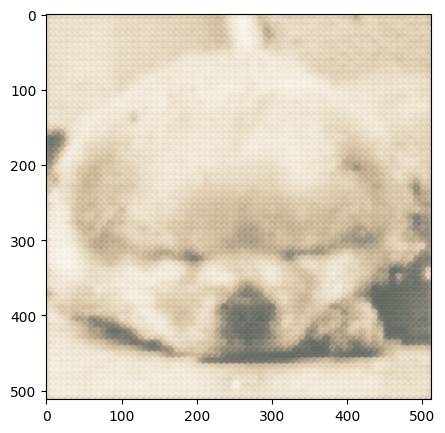

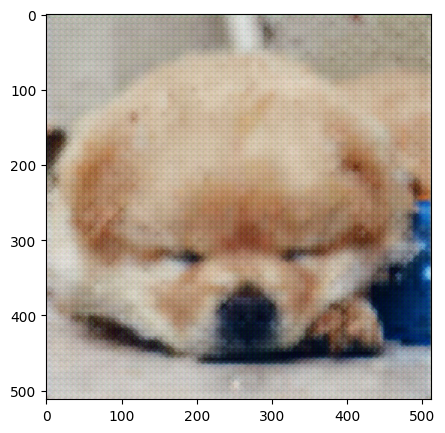

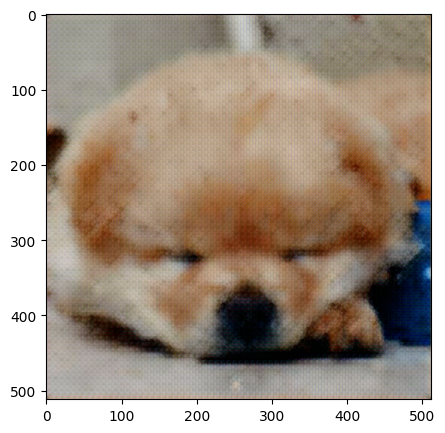

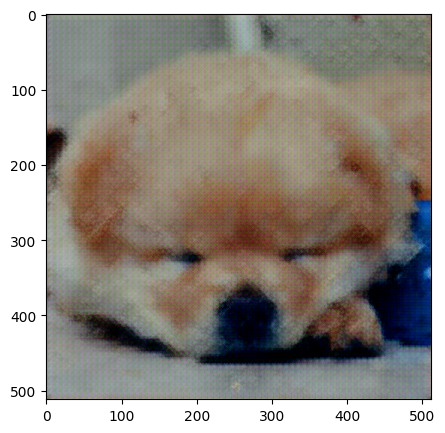

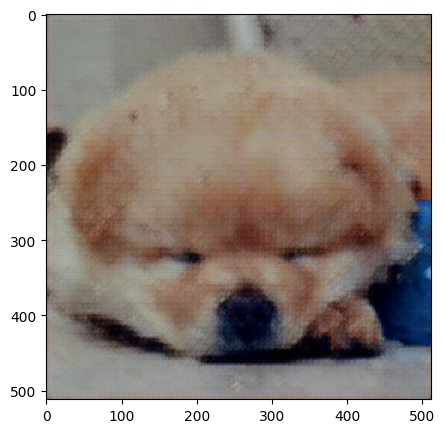

In [ ]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'

netD = Discriminator().to(device)
netG1 = Generator1().to(device)

vgg = FeatureExtractor().to(device).eval()

criterionD = nn.BCELoss()
criterionG = nn.MSELoss()

lr = 0.001

optimizerD = optim.Adam(netD.parameters(), lr=lr)
optimizerG = optim.Adam(netG1.parameters(), lr=lr)

n_epochs = 5

G1_losses = []
D1_losses = []

real_label = 1.
fake_label = 0.

fixed_items = next(iter(val_loader))
fixed_imgs = fixed_items[0].to(device)

for epoch in tqdm(range(n_epochs)):
  # Для каждого батча в даталоадере
  for i, data in enumerate(tqdm(train_loader)):
    netD.zero_grad()
    high_real = data[1].to(device)
    b_size = high_real.size(0)

    label = torch.full((b_size,), real_label, dtype=torch.float, device=device)

    outputD = netD(high_real).view(-1)
    errD_real = criterionD(outputD, label)

    errD_real.backward()
    D_x = outputD.mean().item()

    low_real = data[0].to(device)
    high_fake = netG1(low_real)
    label.fill_(fake_label)

    outputD = netD(high_fake.detach()).view(-1)
    errD_fake = criterionD(outputD, label)

    errD_fake.backward()
    D_G_z1 = outputD.mean().item()

    errD = errD_real + errD_fake
    optimizerD.step()

    # Обновленный дискриминатор
    netG1.zero_grad()
    label.fill_(real_label)
    outputD = netD(high_fake).view(-1)

    generator_err = 1e-3 * criterionD(outputD, label)

    content_err = criterionG(vgg(high_fake), vgg(high_real))

    errG = generator_err + content_err

    errG.backward()
    optimizerG.step()

    D_G_z2 = outputD.mean().item()

    if i % 10 == 0:
        print('[%d/%d][%d/%d]\tLoss_D: %.4f\tLoss_G: %.4f\tD(x): %.4f\tD(G(z)): %.4f / %.4f'
              % (epoch, n_epochs, i, len(train_loader),
                errD.item(), errG.item(), D_x, D_G_z1, D_G_z2))

    G1_losses.append(errG.item())
    D1_losses.append(errD.item())

  fake = netG1(fixed_imgs)
  fig, ax1 = plt.subplots(1,1, figsize = (5, 5))
  ax1.imshow(fake.cpu().detach().numpy().squeeze().transpose((1, 2, 0)))
  fig.show()

## Результаты

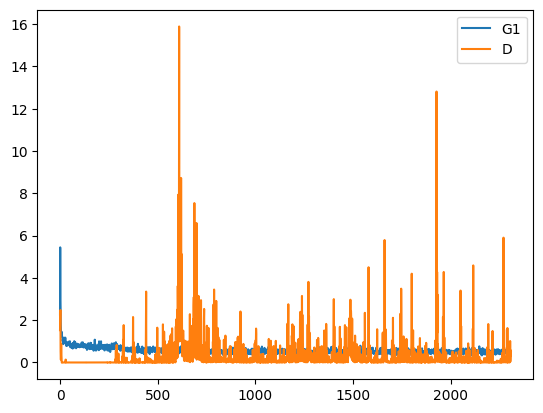

In [ ]:
plt.plot(G1_losses,label="G1")
plt.plot(D1_losses,label="D")
plt.legend()
plt.show()

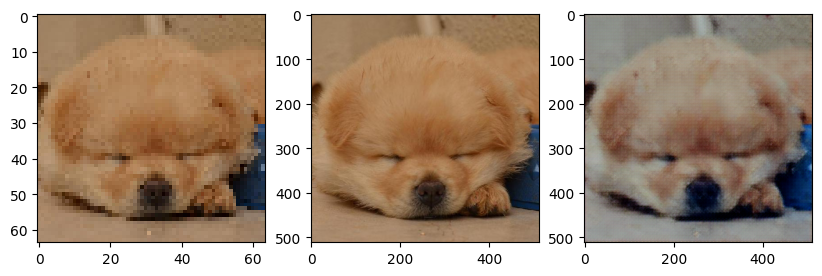

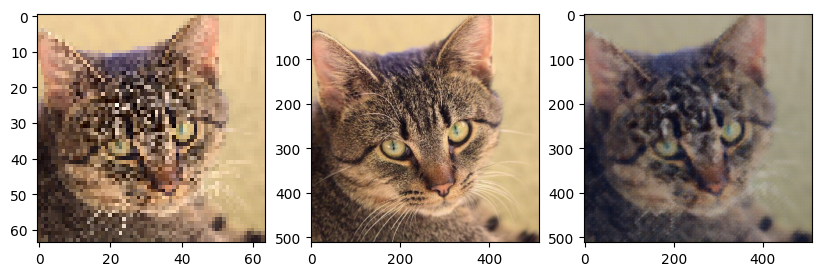

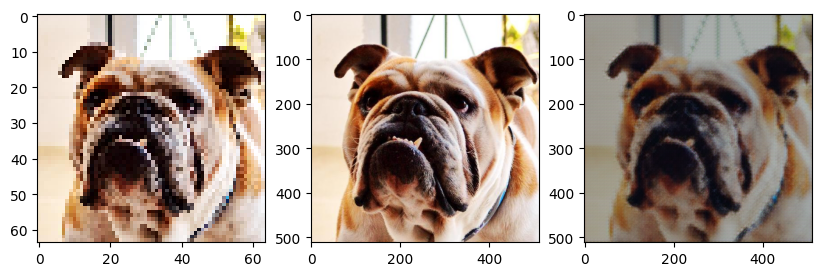

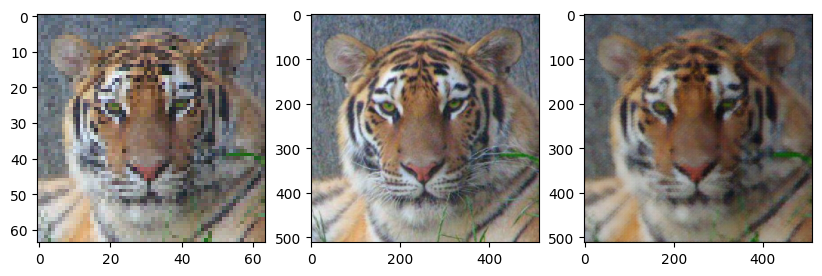

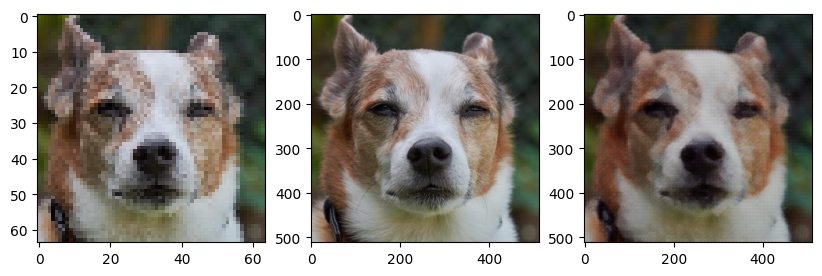

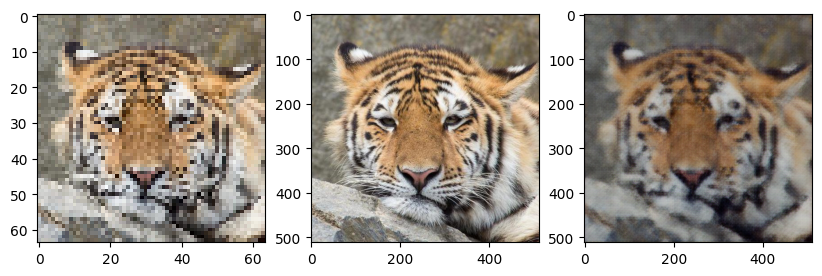

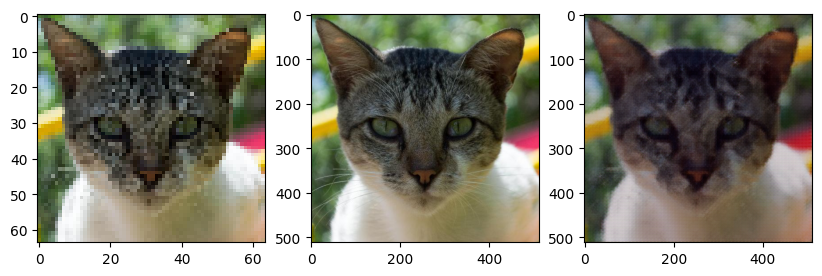

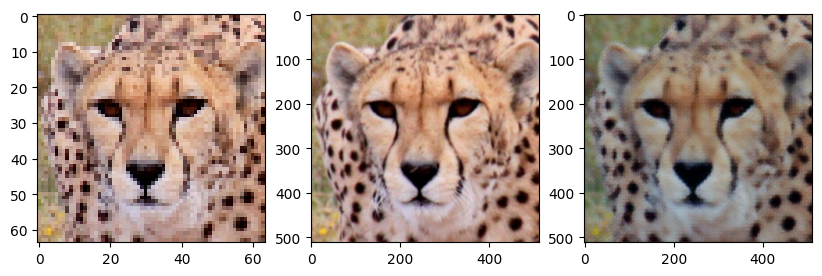

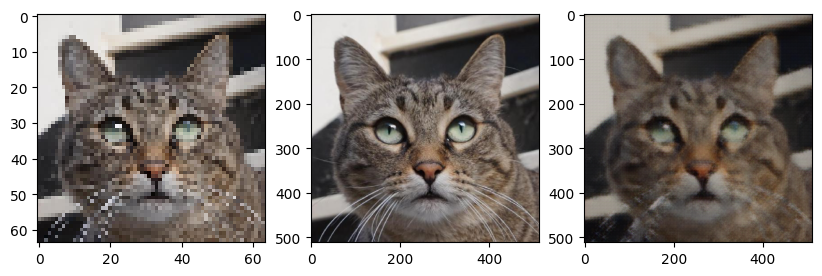

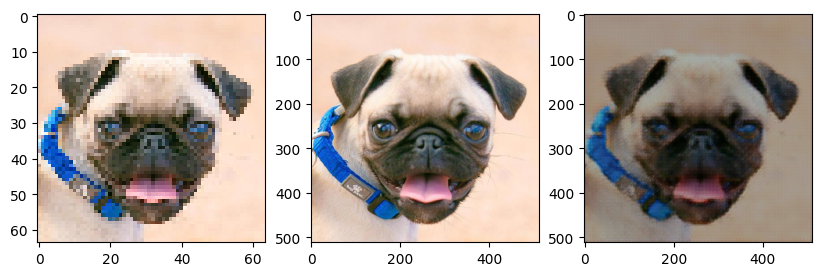

In [ ]:
netG1_imgs = []
for i in range(10):
  gen_imgs = netG1(val_set[i][0].unsqueeze(0).cuda())
  netG1_imgs.append(gen_imgs)
  fig, (ax1,ax2,ax3) = plt.subplots(1,3, figsize = (10, 5))
  ax1.imshow(val_set[i][0].cpu().detach().numpy().transpose((1, 2, 0)).squeeze())
  ax2.imshow(val_set[i][1].cpu().detach().numpy().transpose((1, 2, 0)).squeeze())
  ax3.imshow(gen_imgs.cpu().detach().numpy().squeeze().transpose((1, 2, 0)))
  fig.show()

# Архитектура 2

In [ ]:
class Generator2(nn.Module):
    def __init__(self):
        super(Generator2, self).__init__()
        self.net = nn.Sequential(
            nn.Conv2d(3, 64, 9, 1, 4),
            nn.BatchNorm2d(64),
            nn.PReLU(),

            nn.Conv2d(64, 128, 3, 1, 1),
            nn.BatchNorm2d(128),
            nn.PReLU(),

            nn.Conv2d(128, 128, 3, 1, 1),
            nn.BatchNorm2d(128),

            nn.Conv2d(128, 64, 3, 1, 1),
            nn.BatchNorm2d(64),
            nn.PReLU(),

            nn.Conv2d(64, 64, 3, 1, 1),
            nn.BatchNorm2d(64),

            nn.Conv2d(64, 128, 3, 1, 1),
            nn.BatchNorm2d(128),
            nn.PReLU(),

            nn.Conv2d(128, 128, 3, 1, 1),
            nn.BatchNorm2d(128),

            nn.Conv2d(128, 256, 3, 1, 1),
            nn.PixelShuffle(2),
            nn.PReLU(),

            nn.Conv2d(64, 256, 3, 1, 1),
            nn.PixelShuffle(2),
            nn.PReLU(),

            nn.Conv2d(64, 256, 3, 1, 1),
            nn.PixelShuffle(2),
            nn.PReLU(),

            nn.Conv2d(64, 3, 3, 1, 1, bias=False),
            nn.Tanh()
        )

    def forward(self, x):
        return self.net(x)

In [ ]:
from torchsummary import summary
G2 = Generator2().cuda()
summary(G2,(3,64,64),batch_size=8)

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1            [8, 64, 64, 64]          15,616
       BatchNorm2d-2            [8, 64, 64, 64]             128
             PReLU-3            [8, 64, 64, 64]               1
            Conv2d-4           [8, 128, 64, 64]          73,856
       BatchNorm2d-5           [8, 128, 64, 64]             256
             PReLU-6           [8, 128, 64, 64]               1
            Conv2d-7           [8, 128, 64, 64]         147,584
       BatchNorm2d-8           [8, 128, 64, 64]             256
            Conv2d-9            [8, 64, 64, 64]          73,792
      BatchNorm2d-10            [8, 64, 64, 64]             128
            PReLU-11            [8, 64, 64, 64]               1
           Conv2d-12            [8, 64, 64, 64]          36,928
      BatchNorm2d-13            [8, 64, 64, 64]             128
           Conv2d-14           [8, 128,

## Обучение архитектуры 2

Starting Training Loop...


  0%|          | 1/462 [00:01<08:17,  1.08s/it]

[1/5][0/462]	Loss_D: 1.4516	Loss_G: 0.7438	D(x): 0.4510	D(G(z)): 0.4685 / 0.0000



  2%|▏         | 11/462 [00:09<06:35,  1.14it/s]

[1/5][10/462]	Loss_D: 0.2135	Loss_G: 0.6945	D(x): 0.9400	D(G(z)): 0.1247 / 0.0293



  5%|▍         | 21/462 [00:18<06:31,  1.13it/s]

[1/5][20/462]	Loss_D: 0.1033	Loss_G: 0.6588	D(x): 0.9919	D(G(z)): 0.0864 / 0.0280



  7%|▋         | 31/462 [00:27<06:27,  1.11it/s]

[1/5][30/462]	Loss_D: 0.0650	Loss_G: 0.8206	D(x): 0.9720	D(G(z)): 0.0330 / 0.0015



  9%|▉         | 41/462 [00:36<06:15,  1.12it/s]

[1/5][40/462]	Loss_D: 0.2065	Loss_G: 0.7881	D(x): 0.8602	D(G(z)): 0.0031 / 0.0005



 11%|█         | 51/462 [00:45<06:01,  1.14it/s]

[1/5][50/462]	Loss_D: 0.0095	Loss_G: 0.6649	D(x): 0.9912	D(G(z)): 0.0006 / 0.0002



 13%|█▎        | 61/462 [00:54<05:50,  1.14it/s]

[1/5][60/462]	Loss_D: 0.2652	Loss_G: 0.6712	D(x): 1.0000	D(G(z)): 0.2068 / 0.0550



 15%|█▌        | 71/462 [01:02<05:40,  1.15it/s]

[1/5][70/462]	Loss_D: 0.2692	Loss_G: 0.6179	D(x): 0.9997	D(G(z)): 0.2103 / 0.0039



 18%|█▊        | 81/462 [01:11<05:32,  1.14it/s]

[1/5][80/462]	Loss_D: 0.0021	Loss_G: 0.6988	D(x): 0.9982	D(G(z)): 0.0003 / 0.0004



 20%|█▉        | 91/462 [01:20<05:24,  1.14it/s]

[1/5][90/462]	Loss_D: 0.3052	Loss_G: 0.5824	D(x): 0.8041	D(G(z)): 0.0001 / 0.0000



 22%|██▏       | 101/462 [01:29<05:18,  1.13it/s]

[1/5][100/462]	Loss_D: 0.0049	Loss_G: 0.5412	D(x): 0.9973	D(G(z)): 0.0021 / 0.0016



 24%|██▍       | 111/462 [01:38<05:09,  1.13it/s]

[1/5][110/462]	Loss_D: 0.2736	Loss_G: 0.5907	D(x): 0.9999	D(G(z)): 0.1401 / 0.0202



 26%|██▌       | 121/462 [01:46<05:02,  1.13it/s]

[1/5][120/462]	Loss_D: 1.2547	Loss_G: 0.7319	D(x): 1.0000	D(G(z)): 0.5277 / 0.0045



 28%|██▊       | 131/462 [01:55<04:52,  1.13it/s]

[1/5][130/462]	Loss_D: 0.0004	Loss_G: 0.5692	D(x): 1.0000	D(G(z)): 0.0004 / 0.0005



 31%|███       | 141/462 [02:04<04:44,  1.13it/s]

[1/5][140/462]	Loss_D: 0.0261	Loss_G: 0.5727	D(x): 0.9775	D(G(z)): 0.0026 / 0.0011



 33%|███▎      | 151/462 [02:13<04:33,  1.14it/s]

[1/5][150/462]	Loss_D: 0.0913	Loss_G: 0.6407	D(x): 0.9999	D(G(z)): 0.0763 / 0.0958



 35%|███▍      | 161/462 [02:22<04:26,  1.13it/s]

[1/5][160/462]	Loss_D: 0.3608	Loss_G: 0.5037	D(x): 0.8845	D(G(z)): 0.1224 / 0.0141



 37%|███▋      | 171/462 [02:30<04:16,  1.14it/s]

[1/5][170/462]	Loss_D: 0.0334	Loss_G: 0.4210	D(x): 0.9701	D(G(z)): 0.0014 / 0.0004



 39%|███▉      | 181/462 [02:39<04:07,  1.13it/s]

[1/5][180/462]	Loss_D: 0.1468	Loss_G: 0.4051	D(x): 0.9833	D(G(z)): 0.1041 / 0.0052



 41%|████▏     | 191/462 [02:48<04:00,  1.13it/s]

[1/5][190/462]	Loss_D: 0.4845	Loss_G: 0.5035	D(x): 0.8774	D(G(z)): 0.0006 / 0.0005



 44%|████▎     | 201/462 [02:57<03:49,  1.14it/s]

[1/5][200/462]	Loss_D: 0.0479	Loss_G: 0.6802	D(x): 0.9720	D(G(z)): 0.0166 / 0.0095



 46%|████▌     | 211/462 [03:06<03:40,  1.14it/s]

[1/5][210/462]	Loss_D: 1.5442	Loss_G: 0.5349	D(x): 0.4797	D(G(z)): 0.0079 / 0.0297



 48%|████▊     | 221/462 [03:15<03:33,  1.13it/s]

[1/5][220/462]	Loss_D: 0.7155	Loss_G: 0.6201	D(x): 0.9987	D(G(z)): 0.3442 / 0.0858



 50%|█████     | 231/462 [03:23<03:22,  1.14it/s]

[1/5][230/462]	Loss_D: 0.0776	Loss_G: 0.6335	D(x): 0.9403	D(G(z)): 0.0106 / 0.0225



 52%|█████▏    | 241/462 [03:32<03:14,  1.14it/s]

[1/5][240/462]	Loss_D: 0.0185	Loss_G: 0.4239	D(x): 0.9866	D(G(z)): 0.0047 / 0.0035



 54%|█████▍    | 251/462 [03:41<03:06,  1.13it/s]

[1/5][250/462]	Loss_D: 0.0317	Loss_G: 0.6498	D(x): 0.9892	D(G(z)): 0.0197 / 0.0239



 56%|█████▋    | 261/462 [03:50<02:56,  1.14it/s]

[1/5][260/462]	Loss_D: 0.2825	Loss_G: 0.4474	D(x): 0.8319	D(G(z)): 0.0484 / 0.0247



 59%|█████▊    | 271/462 [03:59<02:47,  1.14it/s]

[1/5][270/462]	Loss_D: 0.2414	Loss_G: 0.5121	D(x): 0.9995	D(G(z)): 0.1739 / 0.0349



 61%|██████    | 281/462 [04:07<02:40,  1.13it/s]

[1/5][280/462]	Loss_D: 0.6107	Loss_G: 0.4526	D(x): 0.6386	D(G(z)): 0.0172 / 0.0980



 63%|██████▎   | 291/462 [04:16<02:30,  1.14it/s]

[1/5][290/462]	Loss_D: 0.4068	Loss_G: 0.5621	D(x): 0.9977	D(G(z)): 0.1427 / 0.0401



 65%|██████▌   | 301/462 [04:25<02:21,  1.14it/s]

[1/5][300/462]	Loss_D: 0.1311	Loss_G: 0.5161	D(x): 0.9049	D(G(z)): 0.0134 / 0.0016



 67%|██████▋   | 311/462 [04:34<02:13,  1.13it/s]

[1/5][310/462]	Loss_D: 0.0441	Loss_G: 0.4325	D(x): 0.9990	D(G(z)): 0.0415 / 0.0045



 69%|██████▉   | 321/462 [04:43<02:03,  1.14it/s]

[1/5][320/462]	Loss_D: 0.0603	Loss_G: 0.6135	D(x): 0.9990	D(G(z)): 0.0561 / 0.0074



 72%|███████▏  | 331/462 [04:51<01:55,  1.14it/s]

[1/5][330/462]	Loss_D: 0.2508	Loss_G: 0.4745	D(x): 0.7896	D(G(z)): 0.0007 / 0.0003



 74%|███████▍  | 341/462 [05:00<01:47,  1.13it/s]

[1/5][340/462]	Loss_D: 0.0495	Loss_G: 0.3952	D(x): 0.9995	D(G(z)): 0.0441 / 0.0093



 76%|███████▌  | 351/462 [05:09<01:37,  1.14it/s]

[1/5][350/462]	Loss_D: 0.2286	Loss_G: 0.3785	D(x): 0.9715	D(G(z)): 0.1020 / 0.0157



 78%|███████▊  | 361/462 [05:18<01:28,  1.14it/s]

[1/5][360/462]	Loss_D: 0.8214	Loss_G: 0.6160	D(x): 0.9565	D(G(z)): 0.2139 / 0.0641



 80%|████████  | 371/462 [05:27<01:20,  1.14it/s]

[1/5][370/462]	Loss_D: 0.2369	Loss_G: 0.4326	D(x): 1.0000	D(G(z)): 0.1391 / 0.0639



 82%|████████▏ | 381/462 [05:35<01:11,  1.14it/s]

[1/5][380/462]	Loss_D: 0.0017	Loss_G: 0.5389	D(x): 1.0000	D(G(z)): 0.0017 / 0.0018



 85%|████████▍ | 391/462 [05:44<01:02,  1.13it/s]

[1/5][390/462]	Loss_D: 0.0140	Loss_G: 0.5347	D(x): 1.0000	D(G(z)): 0.0138 / 0.0106



 87%|████████▋ | 401/462 [05:53<00:53,  1.14it/s]

[1/5][400/462]	Loss_D: 0.0047	Loss_G: 0.6077	D(x): 0.9998	D(G(z)): 0.0045 / 0.0032



 89%|████████▉ | 411/462 [06:02<00:44,  1.14it/s]

[1/5][410/462]	Loss_D: 0.0023	Loss_G: 0.5297	D(x): 0.9986	D(G(z)): 0.0009 / 0.0009



 91%|█████████ | 421/462 [06:11<00:36,  1.13it/s]

[1/5][420/462]	Loss_D: 2.1142	Loss_G: 0.3525	D(x): 0.3000	D(G(z)): 0.0993 / 0.5207



 93%|█████████▎| 431/462 [06:20<00:27,  1.14it/s]

[1/5][430/462]	Loss_D: 0.0529	Loss_G: 0.4823	D(x): 0.9801	D(G(z)): 0.0301 / 0.0022



 95%|█████████▌| 441/462 [06:28<00:18,  1.14it/s]

[1/5][440/462]	Loss_D: 0.1904	Loss_G: 0.4100	D(x): 0.8664	D(G(z)): 0.0013 / 0.0003



 98%|█████████▊| 451/462 [06:37<00:09,  1.13it/s]

[1/5][450/462]	Loss_D: 0.6565	Loss_G: 0.6479	D(x): 0.9372	D(G(z)): 0.3266 / 0.0003



100%|█████████▉| 461/462 [06:46<00:00,  1.14it/s]

[1/5][460/462]	Loss_D: 0.6521	Loss_G: 0.5513	D(x): 0.6906	D(G(z)): 0.0366 / 0.0070



  0%|          | 1/462 [00:01<08:16,  1.08s/it]

[2/5][0/462]	Loss_D: 0.5287	Loss_G: 0.6103	D(x): 0.9044	D(G(z)): 0.2681 / 0.2541



  2%|▏         | 11/462 [00:09<06:37,  1.14it/s]

[2/5][10/462]	Loss_D: 3.4015	Loss_G: 0.4739	D(x): 0.2346	D(G(z)): 0.0012 / 0.0241



  5%|▍         | 21/462 [00:18<06:28,  1.14it/s]

[2/5][20/462]	Loss_D: 0.4072	Loss_G: 0.4110	D(x): 0.9005	D(G(z)): 0.1935 / 0.0242



  7%|▋         | 31/462 [00:27<06:18,  1.14it/s]

[2/5][30/462]	Loss_D: 0.3029	Loss_G: 0.4200	D(x): 0.8217	D(G(z)): 0.0568 / 0.0144



  9%|▉         | 41/462 [00:36<06:09,  1.14it/s]

[2/5][40/462]	Loss_D: 5.7302	Loss_G: 0.5055	D(x): 0.0101	D(G(z)): 0.0043 / 0.0596



 11%|█         | 51/462 [00:45<06:03,  1.13it/s]

[2/5][50/462]	Loss_D: 0.3237	Loss_G: 0.3775	D(x): 0.7935	D(G(z)): 0.0372 / 0.0429



 13%|█▎        | 61/462 [00:53<05:54,  1.13it/s]

[2/5][60/462]	Loss_D: 0.0232	Loss_G: 0.6258	D(x): 0.9808	D(G(z)): 0.0026 / 0.0027



 15%|█▌        | 71/462 [01:02<05:45,  1.13it/s]

[2/5][70/462]	Loss_D: 0.2268	Loss_G: 0.4398	D(x): 0.8285	D(G(z)): 0.0025 / 0.0034



 18%|█▊        | 81/462 [01:11<05:36,  1.13it/s]

[2/5][80/462]	Loss_D: 0.7011	Loss_G: 0.5280	D(x): 0.7046	D(G(z)): 0.0021 / 0.0016



 20%|█▉        | 91/462 [01:20<05:27,  1.13it/s]

[2/5][90/462]	Loss_D: 0.3294	Loss_G: 0.6448	D(x): 0.9923	D(G(z)): 0.1556 / 0.0264



 22%|██▏       | 101/462 [01:29<05:19,  1.13it/s]

[2/5][100/462]	Loss_D: 0.3925	Loss_G: 0.4094	D(x): 0.9525	D(G(z)): 0.2459 / 0.0025



 24%|██▍       | 111/462 [01:38<05:12,  1.12it/s]

[2/5][110/462]	Loss_D: 0.6990	Loss_G: 0.5095	D(x): 0.9144	D(G(z)): 0.2997 / 0.0055



 26%|██▌       | 121/462 [01:46<05:00,  1.13it/s]

[2/5][120/462]	Loss_D: 0.6253	Loss_G: 0.4948	D(x): 0.7695	D(G(z)): 0.1538 / 0.1292



 28%|██▊       | 131/462 [01:55<04:52,  1.13it/s]

[2/5][130/462]	Loss_D: 0.8697	Loss_G: 0.5718	D(x): 0.8901	D(G(z)): 0.3937 / 0.0278



 31%|███       | 141/462 [02:04<04:43,  1.13it/s]

[2/5][140/462]	Loss_D: 0.6205	Loss_G: 0.4693	D(x): 0.6367	D(G(z)): 0.0035 / 0.0395



 33%|███▎      | 151/462 [02:13<04:33,  1.14it/s]

[2/5][150/462]	Loss_D: 0.2011	Loss_G: 0.3893	D(x): 0.8431	D(G(z)): 0.0165 / 0.0776



 35%|███▍      | 161/462 [02:22<04:24,  1.14it/s]

[2/5][160/462]	Loss_D: 0.5517	Loss_G: 0.4831	D(x): 0.6395	D(G(z)): 0.0157 / 0.0032



 37%|███▋      | 171/462 [02:31<04:17,  1.13it/s]

[2/5][170/462]	Loss_D: 0.1997	Loss_G: 0.4597	D(x): 0.8523	D(G(z)): 0.0049 / 0.0346



 39%|███▉      | 181/462 [02:39<04:07,  1.14it/s]

[2/5][180/462]	Loss_D: 0.0992	Loss_G: 0.4007	D(x): 0.9200	D(G(z)): 0.0018 / 0.0006



 41%|████▏     | 191/462 [02:48<03:58,  1.13it/s]

[2/5][190/462]	Loss_D: 0.2973	Loss_G: 0.4437	D(x): 0.9770	D(G(z)): 0.2043 / 0.0265



 44%|████▎     | 201/462 [02:57<03:50,  1.13it/s]

[2/5][200/462]	Loss_D: 0.3978	Loss_G: 0.3951	D(x): 0.8313	D(G(z)): 0.1134 / 0.1331



 46%|████▌     | 211/462 [03:06<03:40,  1.14it/s]

[2/5][210/462]	Loss_D: 0.1539	Loss_G: 0.4823	D(x): 0.9323	D(G(z)): 0.0664 / 0.0234



 48%|████▊     | 221/462 [03:15<03:32,  1.14it/s]

[2/5][220/462]	Loss_D: 1.6128	Loss_G: 0.5838	D(x): 0.6673	D(G(z)): 0.4215 / 0.0918



 50%|█████     | 231/462 [03:23<03:24,  1.13it/s]

[2/5][230/462]	Loss_D: 1.6628	Loss_G: 0.5146	D(x): 0.3741	D(G(z)): 0.0455 / 0.0351



 52%|█████▏    | 241/462 [03:32<03:14,  1.14it/s]

[2/5][240/462]	Loss_D: 0.0201	Loss_G: 0.3695	D(x): 0.9901	D(G(z)): 0.0098 / 0.0002



 54%|█████▍    | 251/462 [03:41<03:05,  1.14it/s]

[2/5][250/462]	Loss_D: 1.6165	Loss_G: 0.4100	D(x): 0.7221	D(G(z)): 0.2396 / 0.0762



 56%|█████▋    | 261/462 [03:50<02:58,  1.13it/s]

[2/5][260/462]	Loss_D: 1.5294	Loss_G: 0.4455	D(x): 0.8120	D(G(z)): 0.4411 / 0.2848



 59%|█████▊    | 271/462 [03:59<02:48,  1.14it/s]

[2/5][270/462]	Loss_D: 0.1676	Loss_G: 0.5445	D(x): 0.9665	D(G(z)): 0.0904 / 0.0051



 61%|██████    | 281/462 [04:08<02:39,  1.13it/s]

[2/5][280/462]	Loss_D: 0.6096	Loss_G: 0.5071	D(x): 0.7143	D(G(z)): 0.1155 / 0.1150



 63%|██████▎   | 291/462 [04:16<02:30,  1.14it/s]

[2/5][290/462]	Loss_D: 1.6010	Loss_G: 0.4607	D(x): 0.3186	D(G(z)): 0.0021 / 0.1321



 65%|██████▌   | 301/462 [04:25<02:22,  1.13it/s]

[2/5][300/462]	Loss_D: 0.0444	Loss_G: 0.5172	D(x): 0.9705	D(G(z)): 0.0123 / 0.0018



 67%|██████▋   | 311/462 [04:34<02:13,  1.13it/s]

[2/5][310/462]	Loss_D: 0.6342	Loss_G: 0.4227	D(x): 0.6269	D(G(z)): 0.0197 / 0.0383



 69%|██████▉   | 321/462 [04:43<02:04,  1.13it/s]

[2/5][320/462]	Loss_D: 0.0629	Loss_G: 0.5666	D(x): 0.9869	D(G(z)): 0.0439 / 0.0115



 72%|███████▏  | 331/462 [04:52<01:55,  1.13it/s]

[2/5][330/462]	Loss_D: 0.3400	Loss_G: 0.4222	D(x): 0.9170	D(G(z)): 0.1757 / 0.1336



 74%|███████▍  | 341/462 [05:00<01:46,  1.13it/s]

[2/5][340/462]	Loss_D: 0.5557	Loss_G: 0.4703	D(x): 0.7341	D(G(z)): 0.0368 / 0.4033



 76%|███████▌  | 351/462 [05:09<01:38,  1.13it/s]

[2/5][350/462]	Loss_D: 1.2479	Loss_G: 0.5330	D(x): 0.7146	D(G(z)): 0.3692 / 0.5744



 78%|███████▊  | 361/462 [05:18<01:28,  1.14it/s]

[2/5][360/462]	Loss_D: 0.1635	Loss_G: 0.3639	D(x): 0.8900	D(G(z)): 0.0183 / 0.0062



 80%|████████  | 371/462 [05:27<01:20,  1.13it/s]

[2/5][370/462]	Loss_D: 1.1660	Loss_G: 0.3836	D(x): 0.9251	D(G(z)): 0.5596 / 0.0316



 82%|████████▏ | 381/462 [05:36<01:11,  1.13it/s]

[2/5][380/462]	Loss_D: 1.0154	Loss_G: 0.4752	D(x): 0.8666	D(G(z)): 0.4202 / 0.0601



 85%|████████▍ | 391/462 [05:45<01:02,  1.13it/s]

[2/5][390/462]	Loss_D: 0.5037	Loss_G: 0.4031	D(x): 0.9618	D(G(z)): 0.2919 / 0.0315



 87%|████████▋ | 401/462 [05:53<00:53,  1.13it/s]

[2/5][400/462]	Loss_D: 1.6809	Loss_G: 0.5493	D(x): 0.9983	D(G(z)): 0.5761 / 0.1709



 89%|████████▉ | 411/462 [06:02<00:45,  1.12it/s]

[2/5][410/462]	Loss_D: 1.1142	Loss_G: 0.4744	D(x): 0.7117	D(G(z)): 0.1710 / 0.0246



 91%|█████████ | 421/462 [06:11<00:36,  1.13it/s]

[2/5][420/462]	Loss_D: 0.7669	Loss_G: 0.3797	D(x): 0.9106	D(G(z)): 0.2804 / 0.0340



 93%|█████████▎| 431/462 [06:20<00:27,  1.13it/s]

[2/5][430/462]	Loss_D: 0.3813	Loss_G: 0.5323	D(x): 0.7349	D(G(z)): 0.0185 / 0.0317



 95%|█████████▌| 441/462 [06:29<00:18,  1.14it/s]

[2/5][440/462]	Loss_D: 0.4717	Loss_G: 0.2854	D(x): 0.7170	D(G(z)): 0.0274 / 0.0190



 98%|█████████▊| 451/462 [06:38<00:09,  1.14it/s]

[2/5][450/462]	Loss_D: 0.0471	Loss_G: 0.4071	D(x): 0.9832	D(G(z)): 0.0287 / 0.0139



100%|█████████▉| 461/462 [06:46<00:00,  1.14it/s]

[2/5][460/462]	Loss_D: 0.0182	Loss_G: 0.4375	D(x): 0.9947	D(G(z)): 0.0125 / 0.0363



  0%|          | 1/462 [00:01<07:46,  1.01s/it]

[3/5][0/462]	Loss_D: 0.5816	Loss_G: 0.4941	D(x): 0.9968	D(G(z)): 0.3055 / 0.0018



  2%|▏         | 11/462 [00:09<06:38,  1.13it/s]

[3/5][10/462]	Loss_D: 0.6371	Loss_G: 0.3935	D(x): 0.9932	D(G(z)): 0.3560 / 0.0009



  5%|▍         | 21/462 [00:18<06:28,  1.14it/s]

[3/5][20/462]	Loss_D: 0.0473	Loss_G: 0.4089	D(x): 0.9583	D(G(z)): 0.0024 / 0.0001



  7%|▋         | 31/462 [00:27<06:20,  1.13it/s]

[3/5][30/462]	Loss_D: 0.1960	Loss_G: 0.4796	D(x): 0.8490	D(G(z)): 0.0014 / 0.0002



  9%|▉         | 41/462 [00:36<06:11,  1.13it/s]

[3/5][40/462]	Loss_D: 0.0709	Loss_G: 0.4425	D(x): 0.9388	D(G(z)): 0.0032 / 0.0037



 11%|█         | 51/462 [00:45<06:02,  1.13it/s]

[3/5][50/462]	Loss_D: 0.0171	Loss_G: 0.5573	D(x): 0.9958	D(G(z)): 0.0127 / 0.0026



 13%|█▎        | 61/462 [00:53<05:56,  1.13it/s]

[3/5][60/462]	Loss_D: 0.2668	Loss_G: 0.3874	D(x): 0.8135	D(G(z)): 0.0114 / 0.0369



 15%|█▌        | 71/462 [01:02<05:44,  1.14it/s]

[3/5][70/462]	Loss_D: 0.2359	Loss_G: 0.5133	D(x): 0.8485	D(G(z)): 0.0051 / 0.0016



 18%|█▊        | 81/462 [01:11<05:35,  1.14it/s]

[3/5][80/462]	Loss_D: 0.0067	Loss_G: 0.5794	D(x): 0.9945	D(G(z)): 0.0010 / 0.0065



 20%|█▉        | 91/462 [01:20<05:28,  1.13it/s]

[3/5][90/462]	Loss_D: 0.0814	Loss_G: 0.3784	D(x): 0.9505	D(G(z)): 0.0272 / 0.0005



 22%|██▏       | 101/462 [01:29<05:17,  1.14it/s]

[3/5][100/462]	Loss_D: 0.8336	Loss_G: 0.3959	D(x): 0.9269	D(G(z)): 0.4128 / 0.0001



 24%|██▍       | 111/462 [01:37<05:08,  1.14it/s]

[3/5][110/462]	Loss_D: 0.0237	Loss_G: 0.5285	D(x): 0.9994	D(G(z)): 0.0222 / 0.0237



 26%|██▌       | 121/462 [01:46<05:00,  1.13it/s]

[3/5][120/462]	Loss_D: 1.3746	Loss_G: 0.5342	D(x): 0.4380	D(G(z)): 0.0080 / 0.0417



 28%|██▊       | 131/462 [01:55<04:51,  1.14it/s]

[3/5][130/462]	Loss_D: 1.1005	Loss_G: 0.4334	D(x): 0.9881	D(G(z)): 0.4279 / 0.0036



 31%|███       | 141/462 [02:04<04:43,  1.13it/s]

[3/5][140/462]	Loss_D: 0.0677	Loss_G: 0.4303	D(x): 0.9389	D(G(z)): 0.0000 / 0.0002



 33%|███▎      | 151/462 [02:13<04:36,  1.13it/s]

[3/5][150/462]	Loss_D: 0.0100	Loss_G: 0.5165	D(x): 0.9982	D(G(z)): 0.0081 / 0.0105



 35%|███▍      | 161/462 [02:22<04:25,  1.13it/s]

[3/5][160/462]	Loss_D: 0.2798	Loss_G: 0.4843	D(x): 0.8284	D(G(z)): 0.0577 / 0.0844



 37%|███▋      | 171/462 [02:30<04:16,  1.13it/s]

[3/5][170/462]	Loss_D: 0.2731	Loss_G: 0.4557	D(x): 0.7805	D(G(z)): 0.0006 / 0.0017



 39%|███▉      | 181/462 [02:39<04:09,  1.13it/s]

[3/5][180/462]	Loss_D: 0.1885	Loss_G: 0.4694	D(x): 0.8564	D(G(z)): 0.0040 / 0.0018



 41%|████▏     | 191/462 [02:48<03:59,  1.13it/s]

[3/5][190/462]	Loss_D: 0.1171	Loss_G: 0.3846	D(x): 0.9033	D(G(z)): 0.0014 / 0.0005



 44%|████▎     | 201/462 [02:57<03:50,  1.13it/s]

[3/5][200/462]	Loss_D: 0.1304	Loss_G: 0.6056	D(x): 0.9985	D(G(z)): 0.1112 / 0.0503



 46%|████▌     | 211/462 [03:06<03:41,  1.13it/s]

[3/5][210/462]	Loss_D: 0.0679	Loss_G: 0.4464	D(x): 0.9866	D(G(z)): 0.0454 / 0.0037



 48%|████▊     | 221/462 [03:15<03:34,  1.13it/s]

[3/5][220/462]	Loss_D: 0.0239	Loss_G: 0.5184	D(x): 0.9907	D(G(z)): 0.0140 / 0.0296



 50%|█████     | 231/462 [03:24<03:24,  1.13it/s]

[3/5][230/462]	Loss_D: 0.1095	Loss_G: 0.5929	D(x): 0.9164	D(G(z)): 0.0011 / 0.0003



 52%|█████▏    | 241/462 [03:32<03:14,  1.13it/s]

[3/5][240/462]	Loss_D: 0.9850	Loss_G: 0.4184	D(x): 0.6285	D(G(z)): 0.0238 / 0.1204



 54%|█████▍    | 251/462 [03:41<03:05,  1.13it/s]

[3/5][250/462]	Loss_D: 0.4472	Loss_G: 0.5838	D(x): 0.7523	D(G(z)): 0.0056 / 0.0187



 56%|█████▋    | 261/462 [03:50<02:57,  1.13it/s]

[3/5][260/462]	Loss_D: 0.4211	Loss_G: 0.4393	D(x): 0.9565	D(G(z)): 0.2575 / 0.0232



 59%|█████▊    | 271/462 [03:59<02:49,  1.13it/s]

[3/5][270/462]	Loss_D: 0.7716	Loss_G: 0.4383	D(x): 0.9996	D(G(z)): 0.4558 / 0.0001



 61%|██████    | 281/462 [04:08<02:39,  1.14it/s]

[3/5][280/462]	Loss_D: 0.3732	Loss_G: 0.4493	D(x): 0.7374	D(G(z)): 0.0206 / 0.0195



 63%|██████▎   | 291/462 [04:16<02:30,  1.13it/s]

[3/5][290/462]	Loss_D: 0.0865	Loss_G: 0.4018	D(x): 0.9240	D(G(z)): 0.0040 / 0.0252



 65%|██████▌   | 301/462 [04:25<02:21,  1.13it/s]

[3/5][300/462]	Loss_D: 0.2400	Loss_G: 0.5881	D(x): 0.9994	D(G(z)): 0.1800 / 0.0155



 67%|██████▋   | 311/462 [04:34<02:12,  1.14it/s]

[3/5][310/462]	Loss_D: 0.1963	Loss_G: 0.5115	D(x): 0.8387	D(G(z)): 0.0102 / 0.0024



 69%|██████▉   | 321/462 [04:43<02:05,  1.13it/s]

[3/5][320/462]	Loss_D: 1.0253	Loss_G: 0.4701	D(x): 0.7011	D(G(z)): 0.0143 / 0.1745



 72%|███████▏  | 331/462 [04:52<01:55,  1.13it/s]

[3/5][330/462]	Loss_D: 0.1143	Loss_G: 0.5245	D(x): 1.0000	D(G(z)): 0.0837 / 0.1517



 74%|███████▍  | 341/462 [05:01<01:46,  1.14it/s]

[3/5][340/462]	Loss_D: 0.2642	Loss_G: 0.4332	D(x): 0.9804	D(G(z)): 0.1660 / 0.0423



 76%|███████▌  | 351/462 [05:09<01:38,  1.13it/s]

[3/5][350/462]	Loss_D: 0.0334	Loss_G: 0.4053	D(x): 0.9971	D(G(z)): 0.0291 / 0.0034



 78%|███████▊  | 361/462 [05:18<01:29,  1.13it/s]

[3/5][360/462]	Loss_D: 0.4004	Loss_G: 0.5191	D(x): 0.9726	D(G(z)): 0.2499 / 0.1648



 80%|████████  | 371/462 [05:27<01:20,  1.13it/s]

[3/5][370/462]	Loss_D: 0.4320	Loss_G: 0.6027	D(x): 0.9905	D(G(z)): 0.2734 / 0.0056



 82%|████████▏ | 381/462 [05:36<01:11,  1.13it/s]

[3/5][380/462]	Loss_D: 0.8982	Loss_G: 0.3662	D(x): 0.9610	D(G(z)): 0.2977 / 0.0147



 85%|████████▍ | 391/462 [05:45<01:02,  1.13it/s]

[3/5][390/462]	Loss_D: 0.1952	Loss_G: 0.7226	D(x): 0.9553	D(G(z)): 0.1207 / 0.0019



 87%|████████▋ | 401/462 [05:54<00:54,  1.13it/s]

[3/5][400/462]	Loss_D: 0.0763	Loss_G: 0.3996	D(x): 0.9997	D(G(z)): 0.0700 / 0.0009



 89%|████████▉ | 411/462 [06:03<00:45,  1.12it/s]

[3/5][410/462]	Loss_D: 0.1130	Loss_G: 0.4798	D(x): 0.9126	D(G(z)): 0.0148 / 0.1378



 91%|█████████ | 421/462 [06:11<00:36,  1.14it/s]

[3/5][420/462]	Loss_D: 1.3676	Loss_G: 0.4792	D(x): 0.9995	D(G(z)): 0.6351 / 0.5467



 93%|█████████▎| 431/462 [06:20<00:27,  1.13it/s]

[3/5][430/462]	Loss_D: 0.7642	Loss_G: 0.4895	D(x): 0.9998	D(G(z)): 0.5056 / 0.0020



 95%|█████████▌| 441/462 [06:29<00:18,  1.13it/s]

[3/5][440/462]	Loss_D: 0.0764	Loss_G: 0.4777	D(x): 0.9999	D(G(z)): 0.0719 / 0.0004



 98%|█████████▊| 451/462 [06:38<00:09,  1.14it/s]

[3/5][450/462]	Loss_D: 0.1239	Loss_G: 0.3591	D(x): 0.8875	D(G(z)): 0.0011 / 0.0454



100%|█████████▉| 461/462 [06:47<00:00,  1.14it/s]

[3/5][460/462]	Loss_D: 0.5267	Loss_G: 0.4278	D(x): 0.9237	D(G(z)): 0.2844 / 0.1756



  0%|          | 1/462 [00:00<07:39,  1.00it/s]

[4/5][0/462]	Loss_D: 0.6521	Loss_G: 0.4522	D(x): 0.9732	D(G(z)): 0.2848 / 0.0055



  2%|▏         | 11/462 [00:09<06:37,  1.13it/s]

[4/5][10/462]	Loss_D: 0.2766	Loss_G: 0.4266	D(x): 0.9987	D(G(z)): 0.1485 / 0.0766



  5%|▍         | 21/462 [00:18<06:30,  1.13it/s]

[4/5][20/462]	Loss_D: 0.3653	Loss_G: 0.4417	D(x): 0.8514	D(G(z)): 0.0929 / 0.0679



  7%|▋         | 31/462 [00:27<06:19,  1.13it/s]

[4/5][30/462]	Loss_D: 0.0606	Loss_G: 0.5236	D(x): 0.9988	D(G(z)): 0.0517 / 0.0580



  9%|▉         | 41/462 [00:36<06:13,  1.13it/s]

[4/5][40/462]	Loss_D: 0.8325	Loss_G: 0.4213	D(x): 0.4839	D(G(z)): 0.0004 / 0.0005



 11%|█         | 51/462 [00:45<06:03,  1.13it/s]

[4/5][50/462]	Loss_D: 0.0665	Loss_G: 0.4758	D(x): 0.9613	D(G(z)): 0.0193 / 0.0137



 13%|█▎        | 61/462 [00:54<05:54,  1.13it/s]

[4/5][60/462]	Loss_D: 0.3501	Loss_G: 0.4151	D(x): 0.8778	D(G(z)): 0.0118 / 0.0028



 15%|█▌        | 71/462 [01:02<05:45,  1.13it/s]

[4/5][70/462]	Loss_D: 1.0939	Loss_G: 0.4274	D(x): 0.9927	D(G(z)): 0.3923 / 0.0161



 18%|█▊        | 81/462 [01:11<05:37,  1.13it/s]

[4/5][80/462]	Loss_D: 0.1750	Loss_G: 0.4874	D(x): 0.9957	D(G(z)): 0.1379 / 0.3798



 20%|█▉        | 91/462 [01:20<05:28,  1.13it/s]

[4/5][90/462]	Loss_D: 0.0639	Loss_G: 0.6087	D(x): 0.9642	D(G(z)): 0.0235 / 0.0581



 22%|██▏       | 101/462 [01:29<05:19,  1.13it/s]

[4/5][100/462]	Loss_D: 0.4619	Loss_G: 0.5049	D(x): 0.7117	D(G(z)): 0.0063 / 0.0159



 24%|██▍       | 111/462 [01:38<05:10,  1.13it/s]

[4/5][110/462]	Loss_D: 1.0287	Loss_G: 0.4960	D(x): 0.5255	D(G(z)): 0.0194 / 0.0149



 26%|██▌       | 121/462 [01:47<05:01,  1.13it/s]

[4/5][120/462]	Loss_D: 1.6580	Loss_G: 0.4884	D(x): 0.9993	D(G(z)): 0.6875 / 0.0013



 28%|██▊       | 131/462 [01:56<04:52,  1.13it/s]

[4/5][130/462]	Loss_D: 0.1816	Loss_G: 0.4116	D(x): 0.9988	D(G(z)): 0.1090 / 0.0662



 31%|███       | 141/462 [02:04<04:43,  1.13it/s]

[4/5][140/462]	Loss_D: 0.0119	Loss_G: 0.5201	D(x): 0.9906	D(G(z)): 0.0023 / 0.0017



 33%|███▎      | 151/462 [02:13<04:35,  1.13it/s]

[4/5][150/462]	Loss_D: 0.7122	Loss_G: 0.4415	D(x): 0.7906	D(G(z)): 0.0011 / 0.0010



 35%|███▍      | 161/462 [02:22<04:26,  1.13it/s]

[4/5][160/462]	Loss_D: 0.1294	Loss_G: 0.3602	D(x): 0.9874	D(G(z)): 0.1063 / 0.0055



 37%|███▋      | 171/462 [02:31<04:16,  1.14it/s]

[4/5][170/462]	Loss_D: 0.0046	Loss_G: 0.4456	D(x): 0.9987	D(G(z)): 0.0033 / 0.0032



 39%|███▉      | 181/462 [02:40<04:08,  1.13it/s]

[4/5][180/462]	Loss_D: 0.2198	Loss_G: 0.4149	D(x): 0.9192	D(G(z)): 0.1030 / 0.0307



 41%|████▏     | 191/462 [02:49<04:00,  1.13it/s]

[4/5][190/462]	Loss_D: 0.4397	Loss_G: 0.5361	D(x): 0.9947	D(G(z)): 0.2455 / 0.0538



 44%|████▎     | 201/462 [02:57<03:50,  1.13it/s]

[4/5][200/462]	Loss_D: 0.0852	Loss_G: 0.4473	D(x): 0.9436	D(G(z)): 0.0218 / 0.0263



 46%|████▌     | 211/462 [03:06<03:41,  1.13it/s]

[4/5][210/462]	Loss_D: 0.4087	Loss_G: 0.3971	D(x): 0.9089	D(G(z)): 0.1835 / 0.0703



 48%|████▊     | 221/462 [03:15<03:34,  1.12it/s]

[4/5][220/462]	Loss_D: 1.3921	Loss_G: 0.4452	D(x): 0.9992	D(G(z)): 0.4881 / 0.0011



 50%|█████     | 231/462 [03:24<03:23,  1.13it/s]

[4/5][230/462]	Loss_D: 0.8578	Loss_G: 0.4052	D(x): 0.5676	D(G(z)): 0.0008 / 0.0000



 52%|█████▏    | 241/462 [03:33<03:15,  1.13it/s]

[4/5][240/462]	Loss_D: 0.8788	Loss_G: 0.4631	D(x): 0.9876	D(G(z)): 0.2212 / 0.1594



 54%|█████▍    | 251/462 [03:42<03:07,  1.12it/s]

[4/5][250/462]	Loss_D: 0.1294	Loss_G: 0.5664	D(x): 0.8963	D(G(z)): 0.0052 / 0.0030



 56%|█████▋    | 261/462 [03:50<02:57,  1.13it/s]

[4/5][260/462]	Loss_D: 0.5823	Loss_G: 0.4130	D(x): 0.9944	D(G(z)): 0.3172 / 0.1306



 59%|█████▊    | 271/462 [03:59<02:48,  1.13it/s]

[4/5][270/462]	Loss_D: 0.0140	Loss_G: 0.4770	D(x): 0.9899	D(G(z)): 0.0038 / 0.0018



 61%|██████    | 281/462 [04:08<02:40,  1.12it/s]

[4/5][280/462]	Loss_D: 0.3864	Loss_G: 0.4869	D(x): 0.9999	D(G(z)): 0.2026 / 0.3360



 63%|██████▎   | 291/462 [04:17<02:31,  1.13it/s]

[4/5][290/462]	Loss_D: 0.0798	Loss_G: 0.4522	D(x): 0.9752	D(G(z)): 0.0498 / 0.0082



 65%|██████▌   | 301/462 [04:26<02:22,  1.13it/s]

[4/5][300/462]	Loss_D: 0.1948	Loss_G: 0.3818	D(x): 0.9007	D(G(z)): 0.0604 / 0.0556



 67%|██████▋   | 311/462 [04:35<02:13,  1.13it/s]

[4/5][310/462]	Loss_D: 0.1350	Loss_G: 0.4147	D(x): 0.8893	D(G(z)): 0.0051 / 0.0009



 69%|██████▉   | 321/462 [04:44<02:03,  1.14it/s]

[4/5][320/462]	Loss_D: 0.4073	Loss_G: 0.3219	D(x): 0.9491	D(G(z)): 0.2628 / 0.0003



 72%|███████▏  | 331/462 [04:52<01:56,  1.13it/s]

[4/5][330/462]	Loss_D: 0.4196	Loss_G: 0.6229	D(x): 0.8370	D(G(z)): 0.0051 / 0.0160



 74%|███████▍  | 341/462 [05:01<01:46,  1.13it/s]

[4/5][340/462]	Loss_D: 0.9645	Loss_G: 0.3879	D(x): 0.5200	D(G(z)): 0.0170 / 0.0146



 76%|███████▌  | 351/462 [05:10<01:37,  1.13it/s]

[4/5][350/462]	Loss_D: 0.2005	Loss_G: 0.3878	D(x): 0.9373	D(G(z)): 0.1133 / 0.0033



 78%|███████▊  | 361/462 [05:19<01:29,  1.13it/s]

[4/5][360/462]	Loss_D: 0.0136	Loss_G: 0.4407	D(x): 0.9875	D(G(z)): 0.0009 / 0.0008



 80%|████████  | 371/462 [05:28<01:20,  1.13it/s]

[4/5][370/462]	Loss_D: 6.5371	Loss_G: 0.2922	D(x): 0.0036	D(G(z)): 0.0023 / 0.0209



 82%|████████▏ | 381/462 [05:37<01:11,  1.13it/s]

[4/5][380/462]	Loss_D: 0.1067	Loss_G: 0.4135	D(x): 0.9117	D(G(z)): 0.0068 / 0.0154



 85%|████████▍ | 391/462 [05:45<01:02,  1.13it/s]

[4/5][390/462]	Loss_D: 0.0132	Loss_G: 0.5092	D(x): 0.9884	D(G(z)): 0.0015 / 0.0001



 87%|████████▋ | 401/462 [05:54<00:53,  1.13it/s]

[4/5][400/462]	Loss_D: 1.8857	Loss_G: 0.3277	D(x): 0.3070	D(G(z)): 0.0035 / 0.0644



 89%|████████▉ | 411/462 [06:03<00:44,  1.14it/s]

[4/5][410/462]	Loss_D: 0.3809	Loss_G: 0.3724	D(x): 0.9990	D(G(z)): 0.1927 / 0.2058



 91%|█████████ | 421/462 [06:12<00:36,  1.13it/s]

[4/5][420/462]	Loss_D: 0.1160	Loss_G: 0.5205	D(x): 0.9038	D(G(z)): 0.0080 / 0.0043



 93%|█████████▎| 431/462 [06:21<00:27,  1.14it/s]

[4/5][430/462]	Loss_D: 0.2018	Loss_G: 0.3480	D(x): 0.8832	D(G(z)): 0.0436 / 0.0283



 95%|█████████▌| 441/462 [06:30<00:18,  1.13it/s]

[4/5][440/462]	Loss_D: 0.0523	Loss_G: 0.4983	D(x): 0.9895	D(G(z)): 0.0404 / 0.0008



 98%|█████████▊| 451/462 [06:38<00:09,  1.13it/s]

[4/5][450/462]	Loss_D: 0.0465	Loss_G: 0.3621	D(x): 0.9992	D(G(z)): 0.0427 / 0.0006



100%|█████████▉| 461/462 [06:47<00:00,  1.14it/s]

[4/5][460/462]	Loss_D: 0.0952	Loss_G: 0.4369	D(x): 0.9380	D(G(z)): 0.0245 / 0.0002



  0%|          | 1/462 [00:01<07:48,  1.02s/it]

[5/5][0/462]	Loss_D: 1.8580	Loss_G: 0.4328	D(x): 0.9999	D(G(z)): 0.6583 / 0.5275



  2%|▏         | 11/462 [00:09<06:38,  1.13it/s]

[5/5][10/462]	Loss_D: 0.2958	Loss_G: 0.3543	D(x): 0.7852	D(G(z)): 0.0076 / 0.0059



  5%|▍         | 21/462 [00:18<06:29,  1.13it/s]

[5/5][20/462]	Loss_D: 0.2025	Loss_G: 0.3331	D(x): 0.9190	D(G(z)): 0.0961 / 0.1291



  7%|▋         | 31/462 [00:27<06:19,  1.14it/s]

[5/5][30/462]	Loss_D: 0.1222	Loss_G: 0.3625	D(x): 0.9011	D(G(z)): 0.0041 / 0.0034



  9%|▉         | 41/462 [00:36<06:12,  1.13it/s]

[5/5][40/462]	Loss_D: 0.1845	Loss_G: 0.4560	D(x): 0.8659	D(G(z)): 0.0007 / 0.0050



 11%|█         | 51/462 [00:45<06:03,  1.13it/s]

[5/5][50/462]	Loss_D: 0.8147	Loss_G: 0.5489	D(x): 0.9939	D(G(z)): 0.4472 / 0.1669



 13%|█▎        | 61/462 [00:54<05:54,  1.13it/s]

[5/5][60/462]	Loss_D: 0.0492	Loss_G: 0.4976	D(x): 0.9987	D(G(z)): 0.0450 / 0.0997



 15%|█▌        | 71/462 [01:02<05:46,  1.13it/s]

[5/5][70/462]	Loss_D: 0.8881	Loss_G: 0.5377	D(x): 0.9980	D(G(z)): 0.3309 / 0.1354



 18%|█▊        | 81/462 [01:11<05:38,  1.12it/s]

[5/5][80/462]	Loss_D: 0.4492	Loss_G: 0.3995	D(x): 0.7273	D(G(z)): 0.0006 / 0.0004



 20%|█▉        | 91/462 [01:20<05:27,  1.13it/s]

[5/5][90/462]	Loss_D: 0.9911	Loss_G: 0.3575	D(x): 0.9811	D(G(z)): 0.4432 / 0.2132



 22%|██▏       | 101/462 [01:29<05:19,  1.13it/s]

[5/5][100/462]	Loss_D: 0.6132	Loss_G: 0.4994	D(x): 0.9995	D(G(z)): 0.3682 / 0.2496



 24%|██▍       | 111/462 [01:38<05:11,  1.13it/s]

[5/5][110/462]	Loss_D: 0.1334	Loss_G: 0.4256	D(x): 0.8924	D(G(z)): 0.0022 / 0.0014



 26%|██▌       | 121/462 [01:47<05:01,  1.13it/s]

[5/5][120/462]	Loss_D: 0.9654	Loss_G: 0.4375	D(x): 0.9885	D(G(z)): 0.4791 / 0.0125



 28%|██▊       | 131/462 [01:55<04:53,  1.13it/s]

[5/5][130/462]	Loss_D: 0.0807	Loss_G: 0.4883	D(x): 0.9954	D(G(z)): 0.0697 / 0.0743



 31%|███       | 141/462 [02:04<04:44,  1.13it/s]

[5/5][140/462]	Loss_D: 0.0881	Loss_G: 0.4941	D(x): 0.9534	D(G(z)): 0.0339 / 0.0116



 33%|███▎      | 151/462 [02:13<04:35,  1.13it/s]

[5/5][150/462]	Loss_D: 0.2201	Loss_G: 0.5507	D(x): 0.8833	D(G(z)): 0.0063 / 0.0022



 35%|███▍      | 161/462 [02:22<04:26,  1.13it/s]

[5/5][160/462]	Loss_D: 0.2770	Loss_G: 0.5055	D(x): 1.0000	D(G(z)): 0.1976 / 0.3105



 37%|███▋      | 171/462 [02:31<04:20,  1.12it/s]

[5/5][170/462]	Loss_D: 0.0204	Loss_G: 0.4670	D(x): 0.9985	D(G(z)): 0.0184 / 0.0510



 39%|███▉      | 181/462 [02:40<04:08,  1.13it/s]

[5/5][180/462]	Loss_D: 0.4214	Loss_G: 0.4114	D(x): 0.6921	D(G(z)): 0.0042 / 0.0909



 41%|████▏     | 191/462 [02:49<03:58,  1.14it/s]

[5/5][190/462]	Loss_D: 0.8251	Loss_G: 0.4664	D(x): 0.8408	D(G(z)): 0.0433 / 0.0107



 44%|████▎     | 201/462 [02:57<03:50,  1.13it/s]

[5/5][200/462]	Loss_D: 0.6209	Loss_G: 0.3407	D(x): 0.6234	D(G(z)): 0.0403 / 0.2058



 46%|████▌     | 211/462 [03:06<03:41,  1.13it/s]

[5/5][210/462]	Loss_D: 0.3607	Loss_G: 0.5130	D(x): 0.9899	D(G(z)): 0.1260 / 0.0155



 48%|████▊     | 221/462 [03:15<03:33,  1.13it/s]

[5/5][220/462]	Loss_D: 0.2484	Loss_G: 0.4618	D(x): 0.9996	D(G(z)): 0.1756 / 0.0650



 50%|█████     | 231/462 [03:24<03:23,  1.13it/s]

[5/5][230/462]	Loss_D: 0.3744	Loss_G: 0.3265	D(x): 0.7464	D(G(z)): 0.0089 / 0.0014



 52%|█████▏    | 241/462 [03:33<03:15,  1.13it/s]

[5/5][240/462]	Loss_D: 0.7850	Loss_G: 0.4982	D(x): 0.9984	D(G(z)): 0.3301 / 0.0176



 54%|█████▍    | 251/462 [03:42<03:06,  1.13it/s]

[5/5][250/462]	Loss_D: 1.4372	Loss_G: 0.4327	D(x): 0.3345	D(G(z)): 0.0005 / 0.0031



 56%|█████▋    | 261/462 [03:50<02:57,  1.13it/s]

[5/5][260/462]	Loss_D: 0.2299	Loss_G: 0.4142	D(x): 0.8217	D(G(z)): 0.0002 / 0.0006



 59%|█████▊    | 271/462 [03:59<02:48,  1.13it/s]

[5/5][270/462]	Loss_D: 0.1259	Loss_G: 0.5493	D(x): 0.8923	D(G(z)): 0.0021 / 0.0071



 61%|██████    | 281/462 [04:08<02:39,  1.13it/s]

[5/5][280/462]	Loss_D: 0.3512	Loss_G: 0.5626	D(x): 0.9976	D(G(z)): 0.2520 / 0.0075



 63%|██████▎   | 291/462 [04:17<02:31,  1.13it/s]

[5/5][290/462]	Loss_D: 0.0423	Loss_G: 0.4857	D(x): 0.9963	D(G(z)): 0.0372 / 0.0127



 65%|██████▌   | 301/462 [04:26<02:22,  1.13it/s]

[5/5][300/462]	Loss_D: 0.1170	Loss_G: 0.4858	D(x): 0.9058	D(G(z)): 0.0023 / 0.0004



 67%|██████▋   | 311/462 [04:35<02:13,  1.13it/s]

[5/5][310/462]	Loss_D: 0.8651	Loss_G: 0.4128	D(x): 0.9769	D(G(z)): 0.3862 / 0.0064



 69%|██████▉   | 321/462 [04:43<02:04,  1.14it/s]

[5/5][320/462]	Loss_D: 0.4100	Loss_G: 0.5344	D(x): 0.7197	D(G(z)): 0.0005 / 0.0035



 72%|███████▏  | 331/462 [04:52<01:55,  1.13it/s]

[5/5][330/462]	Loss_D: 0.0551	Loss_G: 0.5711	D(x): 0.9983	D(G(z)): 0.0504 / 0.1220



 74%|███████▍  | 341/462 [05:01<01:47,  1.13it/s]

[5/5][340/462]	Loss_D: 0.1079	Loss_G: 0.3027	D(x): 0.9809	D(G(z)): 0.0727 / 0.1030



 76%|███████▌  | 351/462 [05:10<01:38,  1.13it/s]

[5/5][350/462]	Loss_D: 1.2341	Loss_G: 0.3210	D(x): 0.5931	D(G(z)): 0.0841 / 0.2045



 78%|███████▊  | 361/462 [05:19<01:28,  1.14it/s]

[5/5][360/462]	Loss_D: 0.3056	Loss_G: 0.3767	D(x): 0.9761	D(G(z)): 0.2162 / 0.0524



 80%|████████  | 371/462 [05:28<01:20,  1.13it/s]

[5/5][370/462]	Loss_D: 0.2780	Loss_G: 0.5962	D(x): 0.9640	D(G(z)): 0.1650 / 0.0422



 82%|████████▏ | 381/462 [05:36<01:11,  1.14it/s]

[5/5][380/462]	Loss_D: 1.6949	Loss_G: 0.4103	D(x): 0.3383	D(G(z)): 0.0047 / 0.0780



 85%|████████▍ | 391/462 [05:45<01:02,  1.14it/s]

[5/5][390/462]	Loss_D: 0.5190	Loss_G: 0.4607	D(x): 0.7315	D(G(z)): 0.0013 / 0.0004



 87%|████████▋ | 401/462 [05:54<00:53,  1.13it/s]

[5/5][400/462]	Loss_D: 0.2776	Loss_G: 0.4311	D(x): 0.9415	D(G(z)): 0.1161 / 0.0354



 89%|████████▉ | 411/462 [06:03<00:44,  1.13it/s]

[5/5][410/462]	Loss_D: 0.2628	Loss_G: 0.5927	D(x): 0.8163	D(G(z)): 0.0118 / 0.0435



 91%|█████████ | 421/462 [06:12<00:36,  1.13it/s]

[5/5][420/462]	Loss_D: 0.0110	Loss_G: 0.4356	D(x): 0.9919	D(G(z)): 0.0027 / 0.0008



 93%|█████████▎| 431/462 [06:21<00:27,  1.12it/s]

[5/5][430/462]	Loss_D: 1.7918	Loss_G: 0.5043	D(x): 0.9992	D(G(z)): 0.6483 / 0.4143



 95%|█████████▌| 441/462 [06:29<00:18,  1.13it/s]

[5/5][440/462]	Loss_D: 0.7612	Loss_G: 0.4834	D(x): 0.9749	D(G(z)): 0.1627 / 0.1485



 98%|█████████▊| 451/462 [06:38<00:09,  1.13it/s]

[5/5][450/462]	Loss_D: 0.0806	Loss_G: 0.6098	D(x): 0.9934	D(G(z)): 0.0656 / 0.0048



100%|█████████▉| 461/462 [06:47<00:00,  1.13it/s]

[5/5][460/462]	Loss_D: 0.5208	Loss_G: 0.3727	D(x): 0.9483	D(G(z)): 0.2110 / 0.0791



100%|██████████| 5/5 [33:59<00:00, 407.83s/it]


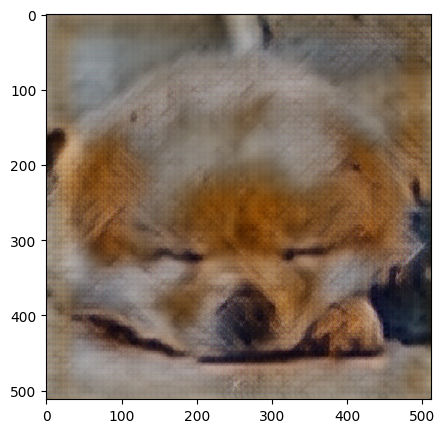

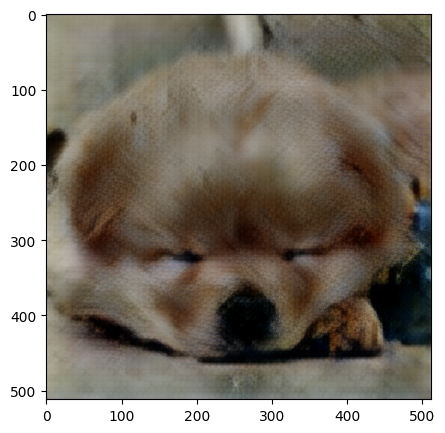

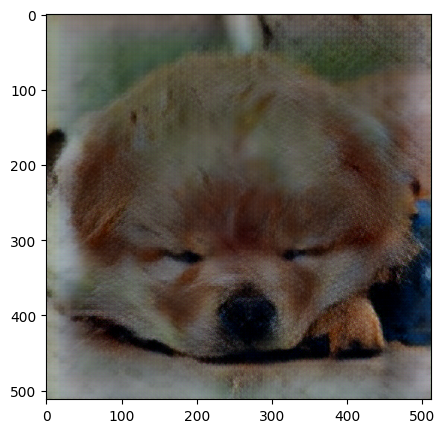

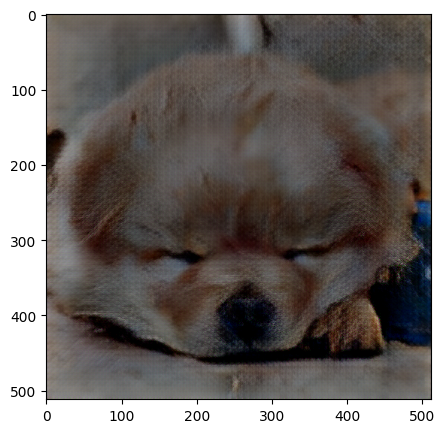

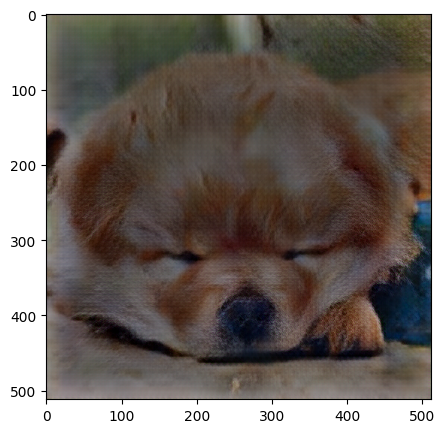

In [ ]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'

netD = Discriminator().to(device)
netG2 = Generator2().to(device)

vgg = FeatureExtractor().to(device).eval()

criterionD = nn.BCELoss()
criterionG = nn.MSELoss()

lr = 0.001

optimizerD = optim.Adam(netD.parameters(), lr=lr)
optimizerG = optim.Adam(netG2.parameters(), lr=lr)

n_epochs = 5

G2_losses = []
D2_losses = []

real_label = 1.
fake_label = 0.

fixed_items = next(iter(val_loader))
fixed_imgs = fixed_items[0].to(device)

print("Starting Training Loop...")
# Для каждой эпохи
for epoch in tqdm(range(n_epochs)):
  # Для каждого батча в даталоадере
  for i, data in enumerate(tqdm(train_loader)):

    #Обучаем дискриминатор, чтоб он отличал реальные
    #изображения от сгенерированных

    ## Тренируем дискриминатор на всех реальных картинках
    netD.zero_grad()
    high_real = data[1].to(device)
    b_size = high_real.size(0)
    #Создаем подписи из единиц
    label = torch.full((b_size,), real_label, dtype=torch.float, device=device)

    # Прямой проход через дискриминатор
    #Получаем результат реальная ли картинка или сгенерированная
    outputD = netD(high_real).view(-1)
    #Подсчитываем ошибку
    errD_real = criterionD(outputD, label)

    # Вычисляем градиент для реальных изображений
    errD_real.backward()
    D_x = outputD.mean().item()

    ## Тренируем дискриминатор на сгенерированных изображениях

    # Генерируем изображения
    low_real = data[0].to(device)
    high_fake = netG2(low_real)
    label.fill_(fake_label)

    # Прямой проход через дискриминатор
    outputD = netD(high_fake.detach()).view(-1)
    errD_fake = criterionD(outputD, label)

    # Вычисляем градиент для сгенерированных изображений
    # в результате получаем градиент и для сгенерированных, и для реальных
    errD_fake.backward()
    D_G_z1 = outputD.mean().item()

    # Суммируем ошибки для реальных и сгенерированных данных
    errD = errD_real + errD_fake

    # Обновляем веса дискриминатора
    optimizerD.step()

    ##################################################################################################
    # (2) Обновляем генератор: максимизируем  0.001 * log(D(G(z))) + MSE(G(z), y),
    #                          то есть хотим чтобы дискриминатор думал что сгенерированное изображение
    #                          это реальное изображение и при этом эти изображения похожи между собой
    ##################################################################################################

    # Через обновленный дискриминатор прогоняем сгенерированные картинки
    netG2.zero_grad()
    label.fill_(real_label)
    outputD = netD(high_fake).view(-1)

    # Считаем ошибку дискриминатора так, как будто бы прогоняли реальные картинки
    generator_err = 1e-3 * criterionD(outputD, label)

    # Считаем ошибку картинки, то есть то насколько сгенерированная из шакальной картинки похожа на изначальную
    content_err = criterionG(vgg(high_fake), vgg(high_real))

    # Складываем ошибки
    errG = generator_err + content_err

    # Считаем градиент и обновляем веса генератора
    errG.backward()
    optimizerG.step()

    D_G_z2 = outputD.mean().item()

    # Выводим текущуюю статистику
    if i % 10 == 0:
        print('[%d/%d][%d/%d]\tLoss_D: %.4f\tLoss_G: %.4f\tD(x): %.4f\tD(G(z)): %.4f / %.4f'
              % (epoch+1, n_epochs, i, len(train_loader),
                errD.item(), errG.item(), D_x, D_G_z1, D_G_z2))

    # Сохраняем значения функции потерь чтобы построить графики
    G2_losses.append(errG.item())
    D2_losses.append(errD.item())

    # # Проверяем как текущая версия генератора работает на тестовых изображениях
    # if (iters % 10 == 0) or ((epoch == n_epochs-1) and (i == len(train_loader)-1)):
    #     with torch.no_grad():
    #         fake = netG2(fixed_imgs).detach().cpu()
    #     img_progress.append(torchvision.utils.make_grid(fake, nrow=4, padding=2, normalize=True))

    # iters += 1
  fake = netG2(fixed_imgs)
  fig, ax1 = plt.subplots(1,1, figsize = (5, 5))
  ax1.imshow(fake.cpu().detach().numpy().squeeze().transpose((1, 2, 0)))
  fig.show()

# return G_losses, D_losses, img_progress

## Результаты

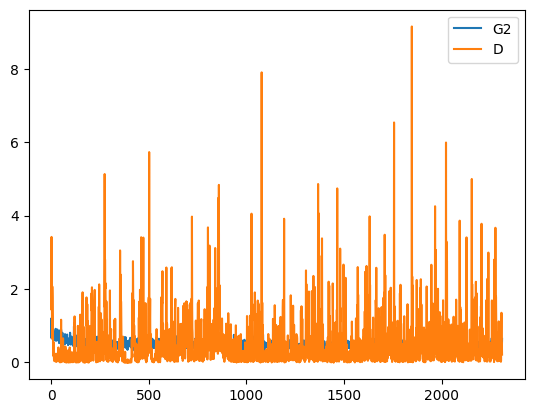

In [ ]:
plt.plot(G2_losses,label="G2")
plt.plot(D2_losses,label="D")
plt.legend()
plt.show()

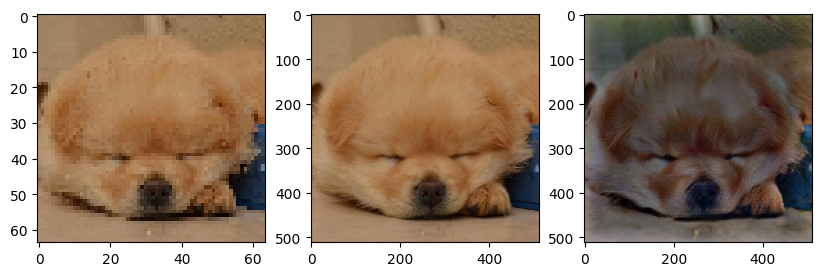

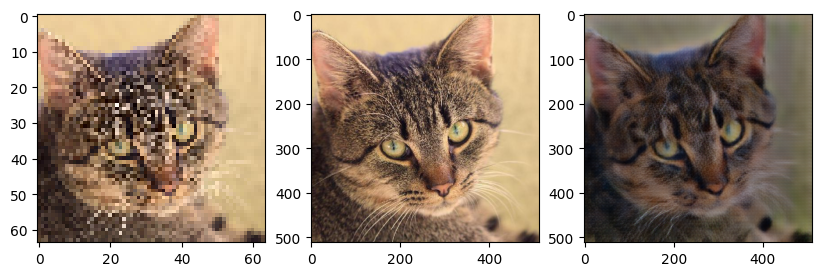

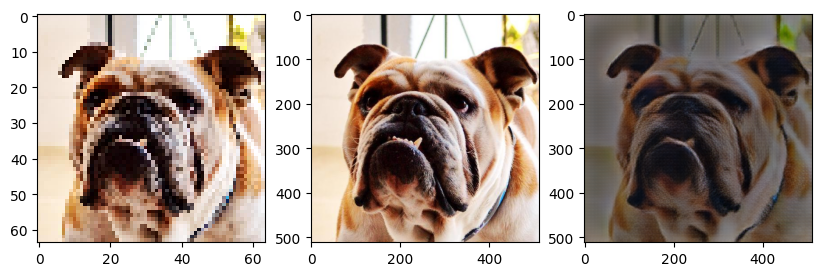

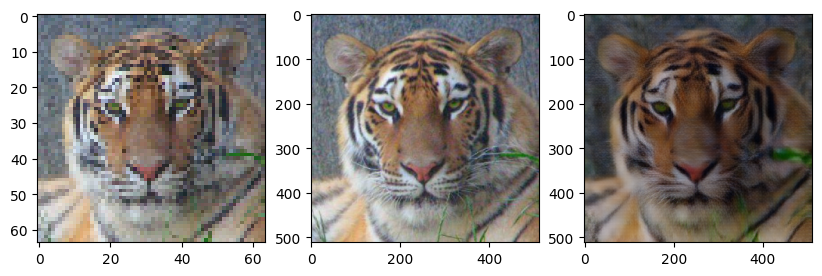

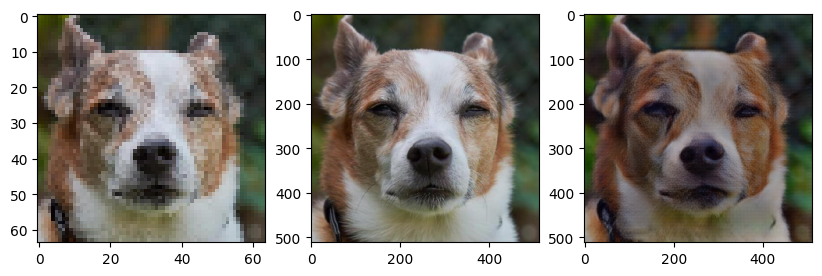

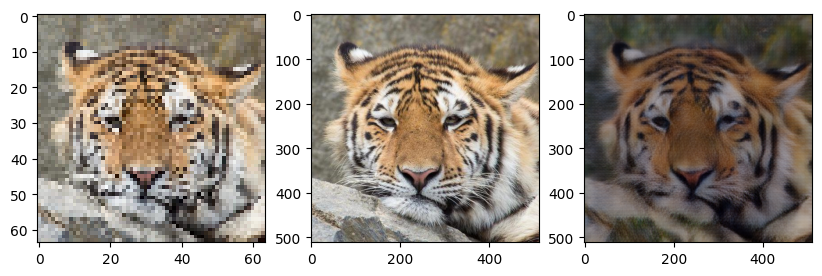

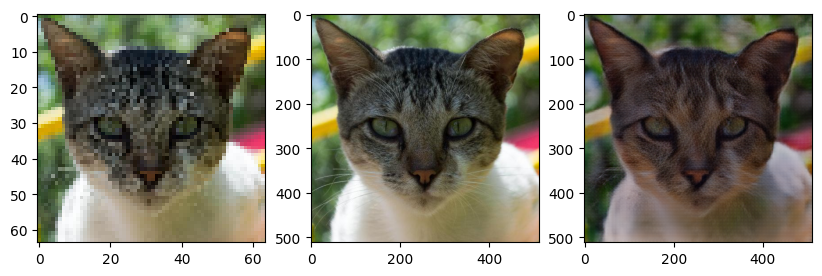

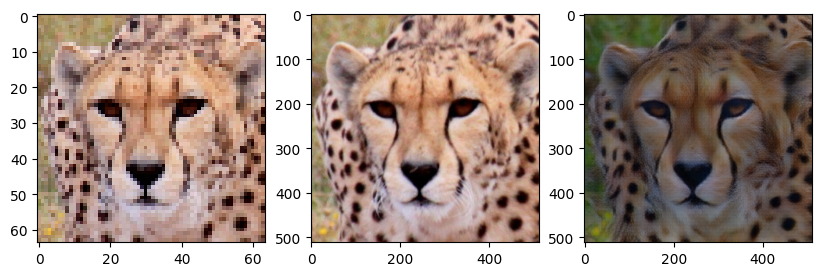

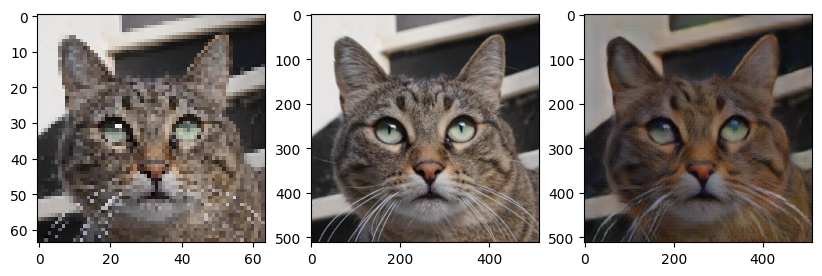

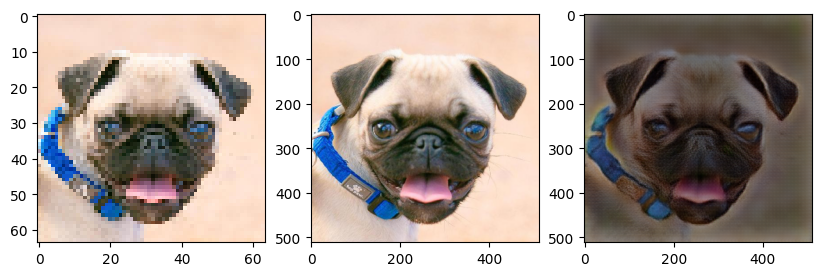

In [ ]:
netG2_imgs = []
for i in range(10):
  gen_imgs = netG2(val_set[i][0].unsqueeze(0).cuda())
  netG2_imgs.append(gen_imgs)
  fig, (ax1,ax2,ax3) = plt.subplots(1,3, figsize = (10, 5))
  ax1.imshow(val_set[i][0].cpu().detach().numpy().transpose((1, 2, 0)).squeeze())
  ax2.imshow(val_set[i][1].cpu().detach().numpy().transpose((1, 2, 0)).squeeze())
  ax3.imshow(gen_imgs.cpu().detach().numpy().squeeze().transpose((1, 2, 0)))
  fig.show()

# Архитектура 3

In [ ]:
class Generator3(nn.Module):
    def __init__(self):
        super(Generator3, self).__init__()

        self.conv1 = nn.Conv2d(3, 64, kernel_size = 9, stride = 1, padding = 4)
        self.conv2 = nn.Conv2d(64, 64, kernel_size = 3, stride = 1, padding = 1)
        self.conv3 = nn.Conv2d(64, 256, kernel_size = 3, stride = 1, padding = 1)
        self.conv4 = nn.Conv2d(64, 3, kernel_size = 3, stride = 1, padding = 1)

        self.act = nn.PReLU()
        self.batchnorm64 = nn.BatchNorm2d(64)
        self.shuffle = nn.PixelShuffle(2)
        self.tanh = nn.Tanh()

    def forward(self, x):
      x = self.conv1(x)
      out1 = self.act(x)

      x = self.conv2(out1)
      x = self.batchnorm64(x)
      x = self.act(x)
      x = self.conv2(x)
      out2 = self.batchnorm64(x)

      out2 = torch.add(out2, out1)

      x = self.conv2(out2)
      x = self.batchnorm64(x)
      x = self.act(x)
      x = self.conv2(x)
      out3 = self.batchnorm64(x)

      out3 = torch.add(out3, out2)

      x = self.conv2(out3)
      x = self.batchnorm64(x)
      x = self.act(x)
      x = self.conv2(x)
      out4 = self.batchnorm64(x)

      out4 = torch.add(out4, out3)

      x = self.conv2(out4)
      x = self.batchnorm64(x)
      x = self.act(x)
      x = self.conv2(x)
      out5 = self.batchnorm64(x)

      out5 = torch.add(out5, out4)

      x = self.conv2(out5)
      out6 = self.batchnorm64(x)

      out6 = torch.add(out6, out1)

      x = self.conv3(out6)
      x = self.shuffle(x)
      x = self.act(x)

      x = self.conv3(x)
      x = self.shuffle(x)
      x = self.act(x)

      x = self.conv3(x)
      x = self.shuffle(x)
      x = self.act(x)

      x = self.conv4(x)
      out = self.tanh(x)

      return out

In [ ]:
from torchsummary import summary
G3 = Generator3().cuda()
summary(G3,(3,64,64),batch_size=8)

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1            [8, 64, 64, 64]          15,616
             PReLU-2            [8, 64, 64, 64]               1
            Conv2d-3            [8, 64, 64, 64]          36,928
       BatchNorm2d-4            [8, 64, 64, 64]             128
             PReLU-5            [8, 64, 64, 64]               1
            Conv2d-6            [8, 64, 64, 64]          36,928
       BatchNorm2d-7            [8, 64, 64, 64]             128
            Conv2d-8            [8, 64, 64, 64]          36,928
       BatchNorm2d-9            [8, 64, 64, 64]             128
            PReLU-10            [8, 64, 64, 64]               1
           Conv2d-11            [8, 64, 64, 64]          36,928
      BatchNorm2d-12            [8, 64, 64, 64]             128
           Conv2d-13            [8, 64, 64, 64]          36,928
      BatchNorm2d-14            [8, 64,

## Обучение архитектуры 3

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG11_Weights.IMAGENET1K_V1`. You can also use `weights=VGG11_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Starting Training Loop...


  0%|          | 1/462 [00:01<07:59,  1.04s/it]

[1/5][0/462]	Loss_D: 1.3487	Loss_G: 0.7158	D(x): 0.5700	D(G(z)): 0.5326 / 0.0000



  2%|▏         | 11/462 [00:09<06:34,  1.14it/s]

[1/5][10/462]	Loss_D: 0.0617	Loss_G: 0.7855	D(x): 0.9942	D(G(z)): 0.0522 / 0.0152



  5%|▍         | 21/462 [00:18<06:23,  1.15it/s]

[1/5][20/462]	Loss_D: 0.0614	Loss_G: 0.8011	D(x): 0.9661	D(G(z)): 0.0220 / 0.0073



  7%|▋         | 31/462 [00:27<06:15,  1.15it/s]

[1/5][30/462]	Loss_D: 0.0592	Loss_G: 0.6433	D(x): 0.9993	D(G(z)): 0.0544 / 0.0068



  9%|▉         | 41/462 [00:35<06:08,  1.14it/s]

[1/5][40/462]	Loss_D: 0.0503	Loss_G: 0.6743	D(x): 0.9603	D(G(z)): 0.0045 / 0.0005



 11%|█         | 51/462 [00:44<05:55,  1.16it/s]

[1/5][50/462]	Loss_D: 0.1936	Loss_G: 0.6615	D(x): 0.9709	D(G(z)): 0.1381 / 0.0251



 13%|█▎        | 61/462 [00:53<05:47,  1.15it/s]

[1/5][60/462]	Loss_D: 0.0205	Loss_G: 0.7045	D(x): 0.9969	D(G(z)): 0.0168 / 0.0113



 15%|█▌        | 71/462 [01:01<05:40,  1.15it/s]

[1/5][70/462]	Loss_D: 0.0731	Loss_G: 0.6179	D(x): 0.9859	D(G(z)): 0.0542 / 0.0058



 18%|█▊        | 81/462 [01:10<05:31,  1.15it/s]

[1/5][80/462]	Loss_D: 0.7355	Loss_G: 0.5823	D(x): 0.8362	D(G(z)): 0.3300 / 0.0049



 20%|█▉        | 91/462 [01:19<05:24,  1.14it/s]

[1/5][90/462]	Loss_D: 0.9098	Loss_G: 0.5415	D(x): 0.9663	D(G(z)): 0.4117 / 0.0001



 22%|██▏       | 101/462 [01:28<05:16,  1.14it/s]

[1/5][100/462]	Loss_D: 0.1350	Loss_G: 0.6691	D(x): 0.9477	D(G(z)): 0.0557 / 0.0128



 24%|██▍       | 111/462 [01:36<05:05,  1.15it/s]

[1/5][110/462]	Loss_D: 0.3819	Loss_G: 0.6620	D(x): 0.9805	D(G(z)): 0.1555 / 0.0233



 26%|██▌       | 121/462 [01:45<04:57,  1.15it/s]

[1/5][120/462]	Loss_D: 0.0179	Loss_G: 0.6328	D(x): 0.9877	D(G(z)): 0.0052 / 0.0010



 28%|██▊       | 131/462 [01:54<04:48,  1.15it/s]

[1/5][130/462]	Loss_D: 0.6366	Loss_G: 0.6077	D(x): 0.7449	D(G(z)): 0.0768 / 0.1515



 31%|███       | 141/462 [02:02<04:39,  1.15it/s]

[1/5][140/462]	Loss_D: 0.1907	Loss_G: 0.6291	D(x): 0.9614	D(G(z)): 0.1076 / 0.0069



 33%|███▎      | 151/462 [02:11<04:32,  1.14it/s]

[1/5][150/462]	Loss_D: 0.0820	Loss_G: 0.5822	D(x): 0.9985	D(G(z)): 0.0608 / 0.0340



 35%|███▍      | 161/462 [02:20<04:22,  1.15it/s]

[1/5][160/462]	Loss_D: 0.0558	Loss_G: 0.4473	D(x): 0.9512	D(G(z)): 0.0009 / 0.0011



 37%|███▋      | 171/462 [02:29<04:13,  1.15it/s]

[1/5][170/462]	Loss_D: 0.2319	Loss_G: 0.5323	D(x): 0.8817	D(G(z)): 0.0384 / 0.0312



 39%|███▉      | 181/462 [02:37<04:05,  1.15it/s]

[1/5][180/462]	Loss_D: 0.9765	Loss_G: 0.5355	D(x): 0.5351	D(G(z)): 0.0008 / 0.0038



 41%|████▏     | 191/462 [02:46<03:56,  1.14it/s]

[1/5][190/462]	Loss_D: 0.0142	Loss_G: 0.6113	D(x): 0.9988	D(G(z)): 0.0127 / 0.0015



 44%|████▎     | 201/462 [02:55<03:46,  1.15it/s]

[1/5][200/462]	Loss_D: 2.5866	Loss_G: 0.4105	D(x): 0.9549	D(G(z)): 0.7031 / 0.0004



 46%|████▌     | 211/462 [03:04<03:39,  1.14it/s]

[1/5][210/462]	Loss_D: 1.0943	Loss_G: 0.5199	D(x): 0.8346	D(G(z)): 0.4399 / 0.1095



 48%|████▊     | 221/462 [03:12<03:29,  1.15it/s]

[1/5][220/462]	Loss_D: 0.0542	Loss_G: 0.4631	D(x): 0.9844	D(G(z)): 0.0365 / 0.0178



 50%|█████     | 231/462 [03:21<03:21,  1.15it/s]

[1/5][230/462]	Loss_D: 0.0027	Loss_G: 0.5659	D(x): 0.9978	D(G(z)): 0.0006 / 0.0004



 52%|█████▏    | 241/462 [03:30<03:12,  1.15it/s]

[1/5][240/462]	Loss_D: 0.0593	Loss_G: 0.5318	D(x): 0.9540	D(G(z)): 0.0047 / 0.0052



 54%|█████▍    | 251/462 [03:38<03:03,  1.15it/s]

[1/5][250/462]	Loss_D: 0.3543	Loss_G: 0.4411	D(x): 0.9871	D(G(z)): 0.1188 / 0.0431



 56%|█████▋    | 261/462 [03:47<02:55,  1.15it/s]

[1/5][260/462]	Loss_D: 0.1944	Loss_G: 0.5066	D(x): 0.9862	D(G(z)): 0.1312 / 0.0151



 59%|█████▊    | 271/462 [03:56<02:46,  1.15it/s]

[1/5][270/462]	Loss_D: 0.1868	Loss_G: 0.5852	D(x): 0.9982	D(G(z)): 0.1454 / 0.0470



 61%|██████    | 281/462 [04:04<02:37,  1.15it/s]

[1/5][280/462]	Loss_D: 0.1384	Loss_G: 0.5531	D(x): 0.8967	D(G(z)): 0.0035 / 0.0040



 63%|██████▎   | 291/462 [04:13<02:29,  1.15it/s]

[1/5][290/462]	Loss_D: 0.0270	Loss_G: 0.6314	D(x): 0.9985	D(G(z)): 0.0241 / 0.0318



 65%|██████▌   | 301/462 [04:22<02:21,  1.14it/s]

[1/5][300/462]	Loss_D: 2.2688	Loss_G: 0.3615	D(x): 0.3403	D(G(z)): 0.1443 / 0.5398



 67%|██████▋   | 311/462 [04:31<02:11,  1.15it/s]

[1/5][310/462]	Loss_D: 0.1014	Loss_G: 0.3916	D(x): 0.9991	D(G(z)): 0.0875 / 0.0598



 69%|██████▉   | 321/462 [04:39<02:03,  1.14it/s]

[1/5][320/462]	Loss_D: 0.0245	Loss_G: 0.4716	D(x): 0.9816	D(G(z)): 0.0051 / 0.0046



 72%|███████▏  | 331/462 [04:48<01:54,  1.14it/s]

[1/5][330/462]	Loss_D: 0.0175	Loss_G: 0.5711	D(x): 0.9946	D(G(z)): 0.0119 / 0.0104



 74%|███████▍  | 341/462 [04:57<01:45,  1.15it/s]

[1/5][340/462]	Loss_D: 2.2352	Loss_G: 0.4813	D(x): 0.9976	D(G(z)): 0.7530 / 0.0071



 76%|███████▌  | 351/462 [05:06<01:36,  1.15it/s]

[1/5][350/462]	Loss_D: 0.1430	Loss_G: 0.4164	D(x): 0.9998	D(G(z)): 0.1186 / 0.0311



 78%|███████▊  | 361/462 [05:14<01:28,  1.15it/s]

[1/5][360/462]	Loss_D: 0.0040	Loss_G: 0.4895	D(x): 0.9974	D(G(z)): 0.0014 / 0.0020



 80%|████████  | 371/462 [05:23<01:19,  1.15it/s]

[1/5][370/462]	Loss_D: 0.7254	Loss_G: 0.5531	D(x): 0.7436	D(G(z)): 0.2061 / 0.0071



 82%|████████▏ | 381/462 [05:32<01:10,  1.14it/s]

[1/5][380/462]	Loss_D: 0.4530	Loss_G: 0.5138	D(x): 0.8681	D(G(z)): 0.0457 / 0.0182



 85%|████████▍ | 391/462 [05:40<01:01,  1.15it/s]

[1/5][390/462]	Loss_D: 1.0142	Loss_G: 0.3699	D(x): 0.9997	D(G(z)): 0.3802 / 0.0069



 87%|████████▋ | 401/462 [05:49<00:53,  1.15it/s]

[1/5][400/462]	Loss_D: 0.3367	Loss_G: 0.4447	D(x): 0.8464	D(G(z)): 0.0131 / 0.0336



 89%|████████▉ | 411/462 [05:58<00:44,  1.14it/s]

[1/5][410/462]	Loss_D: 0.6969	Loss_G: 0.5242	D(x): 0.7607	D(G(z)): 0.0025 / 0.0002



 91%|█████████ | 421/462 [06:07<00:35,  1.15it/s]

[1/5][420/462]	Loss_D: 0.1251	Loss_G: 0.5543	D(x): 0.9811	D(G(z)): 0.0817 / 0.0149



 93%|█████████▎| 431/462 [06:15<00:27,  1.15it/s]

[1/5][430/462]	Loss_D: 0.4480	Loss_G: 0.4762	D(x): 0.8323	D(G(z)): 0.0735 / 0.0805



 95%|█████████▌| 441/462 [06:24<00:18,  1.14it/s]

[1/5][440/462]	Loss_D: 0.5095	Loss_G: 0.5759	D(x): 0.9991	D(G(z)): 0.2434 / 0.0263



 98%|█████████▊| 451/462 [06:33<00:09,  1.15it/s]

[1/5][450/462]	Loss_D: 0.2196	Loss_G: 0.4850	D(x): 0.8816	D(G(z)): 0.0704 / 0.0354



100%|█████████▉| 461/462 [06:42<00:00,  1.14it/s]

[1/5][460/462]	Loss_D: 1.2043	Loss_G: 0.4978	D(x): 0.9942	D(G(z)): 0.6012 / 0.0005



  0%|          | 1/462 [00:00<07:40,  1.00it/s]

[2/5][0/462]	Loss_D: 1.2737	Loss_G: 0.4359	D(x): 0.4952	D(G(z)): 0.0607 / 0.3726



  2%|▏         | 11/462 [00:09<06:35,  1.14it/s]

[2/5][10/462]	Loss_D: 0.4862	Loss_G: 0.5277	D(x): 0.9955	D(G(z)): 0.2339 / 0.0600



  5%|▍         | 21/462 [00:18<06:23,  1.15it/s]

[2/5][20/462]	Loss_D: 0.5162	Loss_G: 0.3779	D(x): 0.9374	D(G(z)): 0.2229 / 0.0701



  7%|▋         | 31/462 [00:27<06:15,  1.15it/s]

[2/5][30/462]	Loss_D: 0.0407	Loss_G: 0.5798	D(x): 0.9910	D(G(z)): 0.0290 / 0.0044



  9%|▉         | 41/462 [00:35<06:10,  1.14it/s]

[2/5][40/462]	Loss_D: 0.5069	Loss_G: 0.5201	D(x): 0.9800	D(G(z)): 0.2827 / 0.0063



 11%|█         | 51/462 [00:44<05:57,  1.15it/s]

[2/5][50/462]	Loss_D: 0.6135	Loss_G: 0.3916	D(x): 0.8435	D(G(z)): 0.1997 / 0.0027



 13%|█▎        | 61/462 [00:53<05:50,  1.15it/s]

[2/5][60/462]	Loss_D: 1.4689	Loss_G: 0.4235	D(x): 0.4332	D(G(z)): 0.0463 / 0.0486



 15%|█▌        | 71/462 [01:02<05:41,  1.15it/s]

[2/5][70/462]	Loss_D: 0.1145	Loss_G: 0.5878	D(x): 0.9616	D(G(z)): 0.0605 / 0.0151



 18%|█▊        | 81/462 [01:10<05:31,  1.15it/s]

[2/5][80/462]	Loss_D: 0.3081	Loss_G: 0.4215	D(x): 0.8154	D(G(z)): 0.0569 / 0.0813



 20%|█▉        | 91/462 [01:19<05:22,  1.15it/s]

[2/5][90/462]	Loss_D: 0.0105	Loss_G: 0.4409	D(x): 0.9946	D(G(z)): 0.0050 / 0.0073



 22%|██▏       | 101/462 [01:28<05:16,  1.14it/s]

[2/5][100/462]	Loss_D: 0.1108	Loss_G: 0.5812	D(x): 0.9789	D(G(z)): 0.0770 / 0.0100



 24%|██▍       | 111/462 [01:36<05:05,  1.15it/s]

[2/5][110/462]	Loss_D: 0.3973	Loss_G: 0.5022	D(x): 0.7853	D(G(z)): 0.0303 / 0.0384



 26%|██▌       | 121/462 [01:45<04:58,  1.14it/s]

[2/5][120/462]	Loss_D: 0.3400	Loss_G: 0.4063	D(x): 0.8653	D(G(z)): 0.0117 / 0.0007



 28%|██▊       | 131/462 [01:54<04:48,  1.15it/s]

[2/5][130/462]	Loss_D: 0.0072	Loss_G: 0.4727	D(x): 0.9959	D(G(z)): 0.0030 / 0.0070



 31%|███       | 141/462 [02:03<04:39,  1.15it/s]

[2/5][140/462]	Loss_D: 0.1668	Loss_G: 0.2818	D(x): 0.8839	D(G(z)): 0.0198 / 0.0185



 33%|███▎      | 151/462 [02:11<04:31,  1.15it/s]

[2/5][150/462]	Loss_D: 0.4031	Loss_G: 0.5994	D(x): 0.9910	D(G(z)): 0.2665 / 0.0291



 35%|███▍      | 161/462 [02:20<04:21,  1.15it/s]

[2/5][160/462]	Loss_D: 1.2119	Loss_G: 0.5097	D(x): 0.7431	D(G(z)): 0.3257 / 0.0771



 37%|███▋      | 171/462 [02:29<04:14,  1.14it/s]

[2/5][170/462]	Loss_D: 0.2520	Loss_G: 0.4125	D(x): 0.9117	D(G(z)): 0.1153 / 0.0761



 39%|███▉      | 181/462 [02:38<04:04,  1.15it/s]

[2/5][180/462]	Loss_D: 0.3034	Loss_G: 0.6609	D(x): 0.9916	D(G(z)): 0.1802 / 0.0092



 41%|████▏     | 191/462 [02:46<03:55,  1.15it/s]

[2/5][190/462]	Loss_D: 1.1333	Loss_G: 0.4739	D(x): 0.9999	D(G(z)): 0.4581 / 0.0031



 44%|████▎     | 201/462 [02:55<03:47,  1.15it/s]

[2/5][200/462]	Loss_D: 0.7725	Loss_G: 0.4073	D(x): 0.7610	D(G(z)): 0.1134 / 0.0242



 46%|████▌     | 211/462 [03:04<03:38,  1.15it/s]

[2/5][210/462]	Loss_D: 1.0724	Loss_G: 0.4494	D(x): 0.5113	D(G(z)): 0.0209 / 0.0500



 48%|████▊     | 221/462 [03:12<03:29,  1.15it/s]

[2/5][220/462]	Loss_D: 0.1423	Loss_G: 0.4465	D(x): 0.9989	D(G(z)): 0.1141 / 0.0035



 50%|█████     | 231/462 [03:21<03:21,  1.15it/s]

[2/5][230/462]	Loss_D: 0.1130	Loss_G: 0.5603	D(x): 0.9662	D(G(z)): 0.0645 / 0.0040



 52%|█████▏    | 241/462 [03:30<03:12,  1.15it/s]

[2/5][240/462]	Loss_D: 0.9356	Loss_G: 0.4556	D(x): 0.9985	D(G(z)): 0.4765 / 0.1140



 54%|█████▍    | 251/462 [03:38<03:04,  1.15it/s]

[2/5][250/462]	Loss_D: 0.4748	Loss_G: 0.5357	D(x): 0.9651	D(G(z)): 0.1754 / 0.0263



 56%|█████▋    | 261/462 [03:47<02:55,  1.14it/s]

[2/5][260/462]	Loss_D: 0.0780	Loss_G: 0.4599	D(x): 0.9382	D(G(z)): 0.0098 / 0.0019



 59%|█████▊    | 271/462 [03:56<02:46,  1.15it/s]

[2/5][270/462]	Loss_D: 1.2846	Loss_G: 0.3865	D(x): 0.5349	D(G(z)): 0.0027 / 0.0115



 61%|██████    | 281/462 [04:05<02:37,  1.15it/s]

[2/5][280/462]	Loss_D: 0.3062	Loss_G: 0.4224	D(x): 0.9174	D(G(z)): 0.1533 / 0.1160



 63%|██████▎   | 291/462 [04:13<02:29,  1.14it/s]

[2/5][290/462]	Loss_D: 0.2508	Loss_G: 0.5313	D(x): 0.9117	D(G(z)): 0.1247 / 0.0140



 65%|██████▌   | 301/462 [04:22<02:20,  1.15it/s]

[2/5][300/462]	Loss_D: 0.4940	Loss_G: 0.4773	D(x): 0.6670	D(G(z)): 0.0324 / 0.0217



 67%|██████▋   | 311/462 [04:31<02:11,  1.15it/s]

[2/5][310/462]	Loss_D: 0.0910	Loss_G: 0.5507	D(x): 0.9229	D(G(z)): 0.0005 / 0.0001



 69%|██████▉   | 321/462 [04:40<02:03,  1.14it/s]

[2/5][320/462]	Loss_D: 0.8630	Loss_G: 0.4747	D(x): 0.7090	D(G(z)): 0.0077 / 0.0113



 72%|███████▏  | 331/462 [04:48<01:54,  1.15it/s]

[2/5][330/462]	Loss_D: 1.2147	Loss_G: 0.5269	D(x): 0.9062	D(G(z)): 0.3713 / 0.0099



 74%|███████▍  | 341/462 [04:57<01:45,  1.15it/s]

[2/5][340/462]	Loss_D: 0.9845	Loss_G: 0.5487	D(x): 0.5503	D(G(z)): 0.0000 / 0.0000



 76%|███████▌  | 351/462 [05:06<01:36,  1.15it/s]

[2/5][350/462]	Loss_D: 0.0885	Loss_G: 0.3612	D(x): 0.9885	D(G(z)): 0.0677 / 0.0029



 78%|███████▊  | 361/462 [05:14<01:28,  1.15it/s]

[2/5][360/462]	Loss_D: 1.0372	Loss_G: 0.5586	D(x): 0.9996	D(G(z)): 0.3020 / 0.0263



 80%|████████  | 371/462 [05:23<01:19,  1.14it/s]

[2/5][370/462]	Loss_D: 0.0756	Loss_G: 0.3711	D(x): 0.9756	D(G(z)): 0.0473 / 0.0481



 82%|████████▏ | 381/462 [05:32<01:11,  1.14it/s]

[2/5][380/462]	Loss_D: 0.5010	Loss_G: 0.5202	D(x): 0.8746	D(G(z)): 0.1396 / 0.1273



 85%|████████▍ | 391/462 [05:41<01:01,  1.15it/s]

[2/5][390/462]	Loss_D: 1.4627	Loss_G: 0.5854	D(x): 0.4118	D(G(z)): 0.1379 / 0.0479



 87%|████████▋ | 401/462 [05:49<00:53,  1.15it/s]

[2/5][400/462]	Loss_D: 0.9947	Loss_G: 0.4390	D(x): 0.7549	D(G(z)): 0.3461 / 0.1458



 89%|████████▉ | 411/462 [05:58<00:44,  1.15it/s]

[2/5][410/462]	Loss_D: 0.0750	Loss_G: 0.3852	D(x): 0.9871	D(G(z)): 0.0583 / 0.0092



 91%|█████████ | 421/462 [06:07<00:35,  1.15it/s]

[2/5][420/462]	Loss_D: 0.4659	Loss_G: 0.4500	D(x): 0.8483	D(G(z)): 0.0495 / 0.0174



 93%|█████████▎| 431/462 [06:15<00:27,  1.15it/s]

[2/5][430/462]	Loss_D: 0.2386	Loss_G: 0.5949	D(x): 0.8808	D(G(z)): 0.0311 / 0.0199



 95%|█████████▌| 441/462 [06:24<00:18,  1.14it/s]

[2/5][440/462]	Loss_D: 0.7388	Loss_G: 0.5220	D(x): 0.6093	D(G(z)): 0.0981 / 0.0454



 98%|█████████▊| 451/462 [06:33<00:09,  1.15it/s]

[2/5][450/462]	Loss_D: 0.3931	Loss_G: 0.6055	D(x): 0.8806	D(G(z)): 0.2067 / 0.1440



100%|█████████▉| 461/462 [06:42<00:00,  1.15it/s]

[2/5][460/462]	Loss_D: 1.4777	Loss_G: 0.5383	D(x): 0.3272	D(G(z)): 0.0068 / 0.0254



  0%|          | 1/462 [00:01<07:40,  1.00it/s]

[3/5][0/462]	Loss_D: 0.3083	Loss_G: 0.4990	D(x): 0.8570	D(G(z)): 0.1017 / 0.0881



  2%|▏         | 11/462 [00:09<06:36,  1.14it/s]

[3/5][10/462]	Loss_D: 0.4390	Loss_G: 0.4527	D(x): 0.9878	D(G(z)): 0.2246 / 0.1035



  5%|▍         | 21/462 [00:18<06:23,  1.15it/s]

[3/5][20/462]	Loss_D: 0.1742	Loss_G: 0.5328	D(x): 0.9594	D(G(z)): 0.0865 / 0.0674



  7%|▋         | 31/462 [00:27<06:15,  1.15it/s]

[3/5][30/462]	Loss_D: 1.9396	Loss_G: 0.4388	D(x): 0.9457	D(G(z)): 0.6757 / 0.5040



  9%|▉         | 41/462 [00:35<06:11,  1.13it/s]

[3/5][40/462]	Loss_D: 0.4924	Loss_G: 0.4113	D(x): 0.7149	D(G(z)): 0.0423 / 0.0406



 11%|█         | 51/462 [00:44<05:57,  1.15it/s]

[3/5][50/462]	Loss_D: 0.2869	Loss_G: 0.5378	D(x): 0.8382	D(G(z)): 0.0319 / 0.0081



 13%|█▎        | 61/462 [00:53<05:53,  1.13it/s]

[3/5][60/462]	Loss_D: 0.3108	Loss_G: 0.3727	D(x): 0.8305	D(G(z)): 0.0857 / 0.0191



 15%|█▌        | 71/462 [01:02<05:43,  1.14it/s]

[3/5][70/462]	Loss_D: 1.3245	Loss_G: 0.4455	D(x): 0.3722	D(G(z)): 0.0566 / 0.2261



 18%|█▊        | 81/462 [01:10<05:31,  1.15it/s]

[3/5][80/462]	Loss_D: 1.0489	Loss_G: 0.3348	D(x): 0.5252	D(G(z)): 0.0394 / 0.0291



 20%|█▉        | 91/462 [01:19<05:23,  1.15it/s]

[3/5][90/462]	Loss_D: 0.3251	Loss_G: 0.4991	D(x): 0.8769	D(G(z)): 0.1156 / 0.1075



 22%|██▏       | 101/462 [01:28<05:15,  1.14it/s]

[3/5][100/462]	Loss_D: 0.3719	Loss_G: 0.4000	D(x): 0.8441	D(G(z)): 0.0227 / 0.0091



 24%|██▍       | 111/462 [01:37<05:06,  1.15it/s]

[3/5][110/462]	Loss_D: 0.4653	Loss_G: 0.4777	D(x): 0.7555	D(G(z)): 0.0216 / 0.0041



 26%|██▌       | 121/462 [01:45<04:57,  1.15it/s]

[3/5][120/462]	Loss_D: 0.4927	Loss_G: 0.5583	D(x): 0.8832	D(G(z)): 0.1995 / 0.2556



 28%|██▊       | 131/462 [01:54<04:48,  1.15it/s]

[3/5][130/462]	Loss_D: 0.1747	Loss_G: 0.5741	D(x): 0.9269	D(G(z)): 0.0579 / 0.0121



 31%|███       | 141/462 [02:03<04:39,  1.15it/s]

[3/5][140/462]	Loss_D: 0.3617	Loss_G: 0.3762	D(x): 0.8649	D(G(z)): 0.1403 / 0.0072



 33%|███▎      | 151/462 [02:11<04:31,  1.15it/s]

[3/5][150/462]	Loss_D: 0.3212	Loss_G: 0.4614	D(x): 0.9833	D(G(z)): 0.1614 / 0.0058



 35%|███▍      | 161/462 [02:20<04:21,  1.15it/s]

[3/5][160/462]	Loss_D: 0.7834	Loss_G: 0.4536	D(x): 0.9974	D(G(z)): 0.4429 / 0.0001



 37%|███▋      | 171/462 [02:29<04:13,  1.15it/s]

[3/5][170/462]	Loss_D: 0.0034	Loss_G: 0.4889	D(x): 0.9983	D(G(z)): 0.0017 / 0.0025



 39%|███▉      | 181/462 [02:38<04:05,  1.14it/s]

[3/5][180/462]	Loss_D: 1.0395	Loss_G: 0.4716	D(x): 0.9974	D(G(z)): 0.5229 / 0.0236



 41%|████▏     | 191/462 [02:46<03:55,  1.15it/s]

[3/5][190/462]	Loss_D: 0.2058	Loss_G: 0.5767	D(x): 0.9636	D(G(z)): 0.1224 / 0.0333



 44%|████▎     | 201/462 [02:55<03:47,  1.15it/s]

[3/5][200/462]	Loss_D: 0.1750	Loss_G: 0.4590	D(x): 0.9976	D(G(z)): 0.1051 / 0.0462



 46%|████▌     | 211/462 [03:04<03:39,  1.14it/s]

[3/5][210/462]	Loss_D: 0.0267	Loss_G: 0.3861	D(x): 0.9879	D(G(z)): 0.0142 / 0.0080



 48%|████▊     | 221/462 [03:13<03:30,  1.15it/s]

[3/5][220/462]	Loss_D: 0.4010	Loss_G: 0.4938	D(x): 0.7806	D(G(z)): 0.0047 / 0.0087



 50%|█████     | 231/462 [03:21<03:21,  1.15it/s]

[3/5][230/462]	Loss_D: 0.1538	Loss_G: 0.5723	D(x): 0.9970	D(G(z)): 0.1283 / 0.0144



 52%|█████▏    | 241/462 [03:30<03:13,  1.14it/s]

[3/5][240/462]	Loss_D: 0.0307	Loss_G: 0.4719	D(x): 0.9910	D(G(z)): 0.0210 / 0.0050



 54%|█████▍    | 251/462 [03:39<03:03,  1.15it/s]

[3/5][250/462]	Loss_D: 0.4061	Loss_G: 0.3922	D(x): 0.9998	D(G(z)): 0.2655 / 0.0984



 56%|█████▋    | 261/462 [03:47<02:55,  1.15it/s]

[3/5][260/462]	Loss_D: 1.0631	Loss_G: 0.5280	D(x): 0.9973	D(G(z)): 0.4019 / 0.0270



 59%|█████▊    | 271/462 [03:56<02:47,  1.14it/s]

[3/5][270/462]	Loss_D: 0.6091	Loss_G: 0.5927	D(x): 0.6264	D(G(z)): 0.0001 / 0.0001



 61%|██████    | 281/462 [04:05<02:37,  1.15it/s]

[3/5][280/462]	Loss_D: 0.2676	Loss_G: 0.5221	D(x): 0.8383	D(G(z)): 0.0496 / 0.0320



 63%|██████▎   | 291/462 [04:14<02:28,  1.15it/s]

[3/5][290/462]	Loss_D: 0.1549	Loss_G: 0.4215	D(x): 0.9946	D(G(z)): 0.1154 / 0.0062



 65%|██████▌   | 301/462 [04:22<02:20,  1.15it/s]

[3/5][300/462]	Loss_D: 0.2343	Loss_G: 0.5231	D(x): 0.9898	D(G(z)): 0.1727 / 0.0111



 67%|██████▋   | 311/462 [04:31<02:11,  1.15it/s]

[3/5][310/462]	Loss_D: 0.3605	Loss_G: 0.5831	D(x): 0.9398	D(G(z)): 0.2012 / 0.0029



 69%|██████▉   | 321/462 [04:40<02:02,  1.15it/s]

[3/5][320/462]	Loss_D: 0.3142	Loss_G: 0.4807	D(x): 0.9995	D(G(z)): 0.2303 / 0.0128



 72%|███████▏  | 331/462 [04:49<01:54,  1.15it/s]

[3/5][330/462]	Loss_D: 0.8650	Loss_G: 0.5366	D(x): 0.5729	D(G(z)): 0.0082 / 0.0017



 74%|███████▍  | 341/462 [04:57<01:45,  1.15it/s]

[3/5][340/462]	Loss_D: 2.7933	Loss_G: 0.5836	D(x): 0.9862	D(G(z)): 0.7704 / 0.0900



 76%|███████▌  | 351/462 [05:06<01:36,  1.15it/s]

[3/5][350/462]	Loss_D: 0.0784	Loss_G: 0.4751	D(x): 0.9699	D(G(z)): 0.0414 / 0.0174



 78%|███████▊  | 361/462 [05:15<01:27,  1.15it/s]

[3/5][360/462]	Loss_D: 0.3337	Loss_G: 0.5297	D(x): 0.7888	D(G(z)): 0.0075 / 0.0004



 80%|████████  | 371/462 [05:23<01:19,  1.15it/s]

[3/5][370/462]	Loss_D: 0.1335	Loss_G: 0.4239	D(x): 0.9867	D(G(z)): 0.1009 / 0.0027



 82%|████████▏ | 381/462 [05:32<01:10,  1.14it/s]

[3/5][380/462]	Loss_D: 0.7829	Loss_G: 0.4378	D(x): 0.9996	D(G(z)): 0.2534 / 0.0297



 85%|████████▍ | 391/462 [05:41<01:01,  1.15it/s]

[3/5][390/462]	Loss_D: 0.6196	Loss_G: 0.4672	D(x): 0.9818	D(G(z)): 0.2779 / 0.0069



 87%|████████▋ | 401/462 [05:50<00:53,  1.15it/s]

[3/5][400/462]	Loss_D: 0.1281	Loss_G: 0.5503	D(x): 0.8908	D(G(z)): 0.0016 / 0.0000



 89%|████████▉ | 411/462 [05:58<00:44,  1.14it/s]

[3/5][410/462]	Loss_D: 0.9203	Loss_G: 0.5473	D(x): 0.5940	D(G(z)): 0.0051 / 0.0063



 91%|█████████ | 421/462 [06:07<00:35,  1.15it/s]

[3/5][420/462]	Loss_D: 1.3454	Loss_G: 0.4675	D(x): 0.3891	D(G(z)): 0.0022 / 0.0047



 93%|█████████▎| 431/462 [06:16<00:26,  1.15it/s]

[3/5][430/462]	Loss_D: 1.0377	Loss_G: 0.5200	D(x): 0.8193	D(G(z)): 0.2399 / 0.0125



 95%|█████████▌| 441/462 [06:25<00:18,  1.15it/s]

[3/5][440/462]	Loss_D: 0.3061	Loss_G: 0.5001	D(x): 0.8349	D(G(z)): 0.0305 / 0.0293



 98%|█████████▊| 451/462 [06:33<00:09,  1.15it/s]

[3/5][450/462]	Loss_D: 2.1872	Loss_G: 0.3359	D(x): 0.9985	D(G(z)): 0.8400 / 0.1091



100%|█████████▉| 461/462 [06:42<00:00,  1.15it/s]

[3/5][460/462]	Loss_D: 0.2460	Loss_G: 0.5071	D(x): 0.8340	D(G(z)): 0.0024 / 0.0005



  0%|          | 1/462 [00:01<07:43,  1.01s/it]

[4/5][0/462]	Loss_D: 0.1525	Loss_G: 0.4524	D(x): 0.9495	D(G(z)): 0.0790 / 0.1058



  2%|▏         | 11/462 [00:09<06:34,  1.14it/s]

[4/5][10/462]	Loss_D: 0.3499	Loss_G: 0.6820	D(x): 0.9374	D(G(z)): 0.1892 / 0.0805



  5%|▍         | 21/462 [00:18<06:24,  1.15it/s]

[4/5][20/462]	Loss_D: 0.2781	Loss_G: 0.5138	D(x): 0.8203	D(G(z)): 0.0054 / 0.0984



  7%|▋         | 31/462 [00:27<06:15,  1.15it/s]

[4/5][30/462]	Loss_D: 0.3406	Loss_G: 0.5326	D(x): 0.9502	D(G(z)): 0.2250 / 0.0177



  9%|▉         | 41/462 [00:35<06:07,  1.15it/s]

[4/5][40/462]	Loss_D: 0.1235	Loss_G: 0.4808	D(x): 0.9490	D(G(z)): 0.0515 / 0.0285



 11%|█         | 51/462 [00:44<05:57,  1.15it/s]

[4/5][50/462]	Loss_D: 0.4891	Loss_G: 0.5234	D(x): 0.7522	D(G(z)): 0.0509 / 0.0210



 13%|█▎        | 61/462 [00:53<05:50,  1.14it/s]

[4/5][60/462]	Loss_D: 0.0193	Loss_G: 0.4965	D(x): 0.9975	D(G(z)): 0.0164 / 0.0036



 15%|█▌        | 71/462 [01:02<05:42,  1.14it/s]

[4/5][70/462]	Loss_D: 0.6438	Loss_G: 0.4501	D(x): 0.6603	D(G(z)): 0.0145 / 0.0465



 18%|█▊        | 81/462 [01:10<05:31,  1.15it/s]

[4/5][80/462]	Loss_D: 1.3476	Loss_G: 0.4093	D(x): 0.9929	D(G(z)): 0.6321 / 0.1558



 20%|█▉        | 91/462 [01:19<05:23,  1.15it/s]

[4/5][90/462]	Loss_D: 1.2436	Loss_G: 0.5501	D(x): 0.3693	D(G(z)): 0.0004 / 0.0005



 22%|██▏       | 101/462 [01:28<05:15,  1.14it/s]

[4/5][100/462]	Loss_D: 0.0259	Loss_G: 0.5716	D(x): 0.9836	D(G(z)): 0.0091 / 0.0094



 24%|██▍       | 111/462 [01:36<05:05,  1.15it/s]

[4/5][110/462]	Loss_D: 0.2626	Loss_G: 0.4173	D(x): 0.8936	D(G(z)): 0.0675 / 0.0237



 26%|██▌       | 121/462 [01:45<04:58,  1.14it/s]

[4/5][120/462]	Loss_D: 0.0447	Loss_G: 0.3934	D(x): 0.9996	D(G(z)): 0.0399 / 0.0263



 28%|██▊       | 131/462 [01:54<04:51,  1.13it/s]

[4/5][130/462]	Loss_D: 0.1227	Loss_G: 0.5572	D(x): 0.9043	D(G(z)): 0.0013 / 0.0138



 31%|███       | 141/462 [02:03<04:40,  1.14it/s]

[4/5][140/462]	Loss_D: 0.5861	Loss_G: 0.5119	D(x): 0.9956	D(G(z)): 0.3470 / 0.0127



 33%|███▎      | 151/462 [02:12<04:33,  1.14it/s]

[4/5][150/462]	Loss_D: 0.2291	Loss_G: 0.4715	D(x): 0.9138	D(G(z)): 0.0914 / 0.0241



 35%|███▍      | 161/462 [02:20<04:22,  1.14it/s]

[4/5][160/462]	Loss_D: 0.6233	Loss_G: 0.4270	D(x): 0.9726	D(G(z)): 0.1567 / 0.1098



 37%|███▋      | 171/462 [02:29<04:13,  1.15it/s]

[4/5][170/462]	Loss_D: 0.1001	Loss_G: 0.3613	D(x): 0.9874	D(G(z)): 0.0679 / 0.0604



 39%|███▉      | 181/462 [02:38<04:05,  1.14it/s]

[4/5][180/462]	Loss_D: 0.3534	Loss_G: 0.3915	D(x): 0.8477	D(G(z)): 0.0547 / 0.0449



 41%|████▏     | 191/462 [02:46<03:55,  1.15it/s]

[4/5][190/462]	Loss_D: 0.3191	Loss_G: 0.6615	D(x): 0.7702	D(G(z)): 0.0008 / 0.0014



 44%|████▎     | 201/462 [02:55<03:47,  1.15it/s]

[4/5][200/462]	Loss_D: 1.0485	Loss_G: 0.3569	D(x): 0.7041	D(G(z)): 0.0060 / 0.0070



 46%|████▌     | 211/462 [03:04<03:40,  1.14it/s]

[4/5][210/462]	Loss_D: 0.4131	Loss_G: 0.4496	D(x): 0.9959	D(G(z)): 0.3001 / 0.0621



 48%|████▊     | 221/462 [03:13<03:29,  1.15it/s]

[4/5][220/462]	Loss_D: 0.0692	Loss_G: 0.5056	D(x): 0.9579	D(G(z)): 0.0213 / 0.0022



 50%|█████     | 231/462 [03:21<03:21,  1.15it/s]

[4/5][230/462]	Loss_D: 0.1990	Loss_G: 0.4299	D(x): 0.9998	D(G(z)): 0.1592 / 0.2963



 52%|█████▏    | 241/462 [03:30<03:13,  1.14it/s]

[4/5][240/462]	Loss_D: 0.5806	Loss_G: 0.5724	D(x): 0.7051	D(G(z)): 0.0010 / 0.0004



 54%|█████▍    | 251/462 [03:39<03:03,  1.15it/s]

[4/5][250/462]	Loss_D: 0.3752	Loss_G: 0.3819	D(x): 0.8227	D(G(z)): 0.0831 / 0.0919



 56%|█████▋    | 261/462 [03:48<02:55,  1.15it/s]

[4/5][260/462]	Loss_D: 0.3322	Loss_G: 0.6376	D(x): 0.9737	D(G(z)): 0.1239 / 0.0811



 59%|█████▊    | 271/462 [03:56<02:47,  1.14it/s]

[4/5][270/462]	Loss_D: 0.7131	Loss_G: 0.5244	D(x): 0.9837	D(G(z)): 0.2356 / 0.0040



 61%|██████    | 281/462 [04:05<02:37,  1.15it/s]

[4/5][280/462]	Loss_D: 0.2343	Loss_G: 0.4278	D(x): 0.8165	D(G(z)): 0.0149 / 0.0001



 63%|██████▎   | 291/462 [04:14<02:29,  1.15it/s]

[4/5][290/462]	Loss_D: 0.1331	Loss_G: 0.5592	D(x): 0.9411	D(G(z)): 0.0659 / 0.0396



 65%|██████▌   | 301/462 [04:22<02:21,  1.14it/s]

[4/5][300/462]	Loss_D: 4.5335	Loss_G: 0.3675	D(x): 0.0534	D(G(z)): 0.0004 / 0.0288



 67%|██████▋   | 311/462 [04:31<02:11,  1.15it/s]

[4/5][310/462]	Loss_D: 0.1059	Loss_G: 0.4182	D(x): 0.9103	D(G(z)): 0.0053 / 0.0199



 69%|██████▉   | 321/462 [04:40<02:03,  1.15it/s]

[4/5][320/462]	Loss_D: 0.1743	Loss_G: 0.4351	D(x): 0.9953	D(G(z)): 0.1358 / 0.0884



 72%|███████▏  | 331/462 [04:49<01:54,  1.15it/s]

[4/5][330/462]	Loss_D: 0.0447	Loss_G: 0.4591	D(x): 0.9962	D(G(z)): 0.0382 / 0.0307



 74%|███████▍  | 341/462 [04:57<01:45,  1.15it/s]

[4/5][340/462]	Loss_D: 0.0075	Loss_G: 0.5965	D(x): 0.9982	D(G(z)): 0.0057 / 0.0034



 76%|███████▌  | 351/462 [05:06<01:36,  1.15it/s]

[4/5][350/462]	Loss_D: 0.0008	Loss_G: 0.5705	D(x): 0.9999	D(G(z)): 0.0007 / 0.0006



 78%|███████▊  | 361/462 [05:15<01:28,  1.14it/s]

[4/5][360/462]	Loss_D: 0.1429	Loss_G: 0.4039	D(x): 0.8773	D(G(z)): 0.0002 / 0.0003



 80%|████████  | 371/462 [05:24<01:19,  1.15it/s]

[4/5][370/462]	Loss_D: 0.1578	Loss_G: 0.4592	D(x): 0.8695	D(G(z)): 0.0057 / 0.0067



 82%|████████▏ | 381/462 [05:32<01:11,  1.14it/s]

[4/5][380/462]	Loss_D: 0.0656	Loss_G: 0.4453	D(x): 0.9647	D(G(z)): 0.0258 / 0.0218



 85%|████████▍ | 391/462 [05:41<01:01,  1.15it/s]

[4/5][390/462]	Loss_D: 0.5410	Loss_G: 0.4217	D(x): 0.9923	D(G(z)): 0.2160 / 0.0674



 87%|████████▋ | 401/462 [05:50<00:53,  1.14it/s]

[4/5][400/462]	Loss_D: 0.9000	Loss_G: 0.5017	D(x): 0.6387	D(G(z)): 0.0004 / 0.0003



 89%|████████▉ | 411/462 [05:59<00:44,  1.14it/s]

[4/5][410/462]	Loss_D: 0.1477	Loss_G: 0.5207	D(x): 1.0000	D(G(z)): 0.0906 / 0.0168



 91%|█████████ | 421/462 [06:07<00:35,  1.15it/s]

[4/5][420/462]	Loss_D: 0.1990	Loss_G: 0.5793	D(x): 0.8935	D(G(z)): 0.0194 / 0.0005



 93%|█████████▎| 431/462 [06:16<00:27,  1.15it/s]

[4/5][430/462]	Loss_D: 0.0325	Loss_G: 0.5799	D(x): 0.9702	D(G(z)): 0.0000 / 0.0000



 95%|█████████▌| 441/462 [06:25<00:18,  1.14it/s]

[4/5][440/462]	Loss_D: 0.0294	Loss_G: 0.4124	D(x): 0.9724	D(G(z)): 0.0004 / 0.0315



 98%|█████████▊| 451/462 [06:33<00:09,  1.15it/s]

[4/5][450/462]	Loss_D: 0.3361	Loss_G: 0.4295	D(x): 0.9987	D(G(z)): 0.2193 / 0.4141



100%|█████████▉| 461/462 [06:42<00:00,  1.14it/s]

[4/5][460/462]	Loss_D: 0.0701	Loss_G: 0.4213	D(x): 0.9980	D(G(z)): 0.0607 / 0.0256



  0%|          | 1/462 [00:01<07:46,  1.01s/it]

[5/5][0/462]	Loss_D: 0.0350	Loss_G: 0.4453	D(x): 0.9890	D(G(z)): 0.0226 / 0.0115



  2%|▏         | 11/462 [00:09<06:33,  1.15it/s]

[5/5][10/462]	Loss_D: 0.0752	Loss_G: 0.3890	D(x): 0.9763	D(G(z)): 0.0455 / 0.0046



  5%|▍         | 21/462 [00:18<06:23,  1.15it/s]

[5/5][20/462]	Loss_D: 0.2906	Loss_G: 0.3915	D(x): 0.9895	D(G(z)): 0.1984 / 0.0803



  7%|▋         | 31/462 [00:27<06:17,  1.14it/s]

[5/5][30/462]	Loss_D: 0.0686	Loss_G: 0.4167	D(x): 0.9962	D(G(z)): 0.0588 / 0.0202



  9%|▉         | 41/462 [00:36<06:12,  1.13it/s]

[5/5][40/462]	Loss_D: 0.1257	Loss_G: 0.5369	D(x): 0.9600	D(G(z)): 0.0699 / 0.0176



 11%|█         | 51/462 [00:44<05:58,  1.15it/s]

[5/5][50/462]	Loss_D: 1.9205	Loss_G: 0.5262	D(x): 0.9993	D(G(z)): 0.7417 / 0.1822



 13%|█▎        | 61/462 [00:53<05:51,  1.14it/s]

[5/5][60/462]	Loss_D: 0.0260	Loss_G: 0.4848	D(x): 0.9932	D(G(z)): 0.0183 / 0.0010



 15%|█▌        | 71/462 [01:02<05:41,  1.14it/s]

[5/5][70/462]	Loss_D: 1.0052	Loss_G: 0.5003	D(x): 0.4449	D(G(z)): 0.0012 / 0.0055



 18%|█▊        | 81/462 [01:10<05:31,  1.15it/s]

[5/5][80/462]	Loss_D: 0.0036	Loss_G: 0.5358	D(x): 0.9988	D(G(z)): 0.0024 / 0.0012



 20%|█▉        | 91/462 [01:19<05:25,  1.14it/s]

[5/5][90/462]	Loss_D: 0.0306	Loss_G: 0.4188	D(x): 0.9838	D(G(z)): 0.0139 / 0.0039



 22%|██▏       | 101/462 [01:28<05:14,  1.15it/s]

[5/5][100/462]	Loss_D: 0.1466	Loss_G: 0.5421	D(x): 0.9965	D(G(z)): 0.1184 / 0.0217



 24%|██▍       | 111/462 [01:37<05:05,  1.15it/s]

[5/5][110/462]	Loss_D: 1.1922	Loss_G: 0.3119	D(x): 0.6080	D(G(z)): 0.0377 / 0.1484



 26%|██▌       | 121/462 [01:45<04:59,  1.14it/s]

[5/5][120/462]	Loss_D: 0.0435	Loss_G: 0.6284	D(x): 0.9974	D(G(z)): 0.0372 / 0.0230



 28%|██▊       | 131/462 [01:54<04:49,  1.14it/s]

[5/5][130/462]	Loss_D: 0.3855	Loss_G: 0.3226	D(x): 0.7846	D(G(z)): 0.0140 / 0.0087



 31%|███       | 141/462 [02:03<04:39,  1.15it/s]

[5/5][140/462]	Loss_D: 2.3636	Loss_G: 0.4226	D(x): 0.9378	D(G(z)): 0.7722 / 0.0189



 33%|███▎      | 151/462 [02:12<04:32,  1.14it/s]

[5/5][150/462]	Loss_D: 0.0337	Loss_G: 0.5580	D(x): 0.9982	D(G(z)): 0.0294 / 0.0086



 35%|███▍      | 161/462 [02:20<04:23,  1.14it/s]

[5/5][160/462]	Loss_D: 0.1327	Loss_G: 0.3735	D(x): 0.9929	D(G(z)): 0.1039 / 0.0110



 37%|███▋      | 171/462 [02:29<04:14,  1.14it/s]

[5/5][170/462]	Loss_D: 0.0141	Loss_G: 0.4642	D(x): 0.9900	D(G(z)): 0.0040 / 0.0106



 39%|███▉      | 181/462 [02:38<04:06,  1.14it/s]

[5/5][180/462]	Loss_D: 0.4714	Loss_G: 0.4876	D(x): 0.9947	D(G(z)): 0.2753 / 0.0403



 41%|████▏     | 191/462 [02:47<03:57,  1.14it/s]

[5/5][190/462]	Loss_D: 0.0199	Loss_G: 0.5574	D(x): 0.9972	D(G(z)): 0.0168 / 0.0031



 44%|████▎     | 201/462 [02:55<03:49,  1.14it/s]

[5/5][200/462]	Loss_D: 0.6919	Loss_G: 0.3743	D(x): 0.6230	D(G(z)): 0.0929 / 0.0941



 46%|████▌     | 211/462 [03:04<03:38,  1.15it/s]

[5/5][210/462]	Loss_D: 1.5303	Loss_G: 0.3793	D(x): 0.9893	D(G(z)): 0.6239 / 0.0001



 48%|████▊     | 221/462 [03:13<03:31,  1.14it/s]

[5/5][220/462]	Loss_D: 1.4253	Loss_G: 0.4404	D(x): 0.9999	D(G(z)): 0.5924 / 0.0192



 50%|█████     | 231/462 [03:22<03:22,  1.14it/s]

[5/5][230/462]	Loss_D: 0.2452	Loss_G: 0.3699	D(x): 0.8501	D(G(z)): 0.0005 / 0.0000



 52%|█████▏    | 241/462 [03:30<03:13,  1.14it/s]

[5/5][240/462]	Loss_D: 0.0024	Loss_G: 0.5393	D(x): 0.9983	D(G(z)): 0.0007 / 0.0013



 54%|█████▍    | 251/462 [03:39<03:04,  1.15it/s]

[5/5][250/462]	Loss_D: 0.0374	Loss_G: 0.6230	D(x): 0.9778	D(G(z)): 0.0134 / 0.0170



 56%|█████▋    | 261/462 [03:48<02:56,  1.14it/s]

[5/5][260/462]	Loss_D: 6.6570	Loss_G: 0.3117	D(x): 0.0096	D(G(z)): 0.0069 / 0.5060



 59%|█████▊    | 271/462 [03:56<02:46,  1.15it/s]

[5/5][270/462]	Loss_D: 0.7259	Loss_G: 0.4561	D(x): 0.9974	D(G(z)): 0.3012 / 0.0047



 61%|██████    | 281/462 [04:05<02:37,  1.15it/s]

[5/5][280/462]	Loss_D: 0.6638	Loss_G: 0.3820	D(x): 0.7013	D(G(z)): 0.0420 / 0.0199



 63%|██████▎   | 291/462 [04:14<02:30,  1.14it/s]

[5/5][290/462]	Loss_D: 2.2123	Loss_G: 0.5689	D(x): 0.9994	D(G(z)): 0.7685 / 0.3073



 65%|██████▌   | 301/462 [04:23<02:20,  1.15it/s]

[5/5][300/462]	Loss_D: 0.0646	Loss_G: 0.6311	D(x): 0.9993	D(G(z)): 0.0576 / 0.0058



 67%|██████▋   | 311/462 [04:31<02:12,  1.14it/s]

[5/5][310/462]	Loss_D: 0.0848	Loss_G: 0.5120	D(x): 0.9997	D(G(z)): 0.0779 / 0.0463



 69%|██████▉   | 321/462 [04:40<02:03,  1.14it/s]

[5/5][320/462]	Loss_D: 0.1052	Loss_G: 0.3784	D(x): 0.9093	D(G(z)): 0.0045 / 0.0018



 72%|███████▏  | 331/462 [04:49<01:54,  1.15it/s]

[5/5][330/462]	Loss_D: 0.0835	Loss_G: 0.5555	D(x): 0.9996	D(G(z)): 0.0690 / 0.2791



 74%|███████▍  | 341/462 [04:58<01:45,  1.14it/s]

[5/5][340/462]	Loss_D: 0.4631	Loss_G: 0.4589	D(x): 0.7121	D(G(z)): 0.0003 / 0.0003



 76%|███████▌  | 351/462 [05:06<01:36,  1.15it/s]

[5/5][350/462]	Loss_D: 0.3967	Loss_G: 0.4750	D(x): 0.7847	D(G(z)): 0.0076 / 0.0118



 78%|███████▊  | 361/462 [05:15<01:28,  1.15it/s]

[5/5][360/462]	Loss_D: 0.2792	Loss_G: 0.4864	D(x): 0.9984	D(G(z)): 0.1927 / 0.0648



 80%|████████  | 371/462 [05:24<01:19,  1.14it/s]

[5/5][370/462]	Loss_D: 0.2266	Loss_G: 0.4293	D(x): 0.8458	D(G(z)): 0.0265 / 0.0014



 82%|████████▏ | 381/462 [05:32<01:10,  1.15it/s]

[5/5][380/462]	Loss_D: 0.2990	Loss_G: 0.4399	D(x): 0.7859	D(G(z)): 0.0034 / 0.0023



 85%|████████▍ | 391/462 [05:41<01:02,  1.14it/s]

[5/5][390/462]	Loss_D: 0.0145	Loss_G: 0.4771	D(x): 0.9896	D(G(z)): 0.0038 / 0.0010



 87%|████████▋ | 401/462 [05:50<00:53,  1.14it/s]

[5/5][400/462]	Loss_D: 0.2588	Loss_G: 0.5177	D(x): 0.9999	D(G(z)): 0.1832 / 0.1049



 89%|████████▉ | 411/462 [05:59<00:44,  1.15it/s]

[5/5][410/462]	Loss_D: 0.4404	Loss_G: 0.4680	D(x): 0.9562	D(G(z)): 0.2468 / 0.0112



 91%|█████████ | 421/462 [06:08<00:35,  1.15it/s]

[5/5][420/462]	Loss_D: 0.0110	Loss_G: 0.4766	D(x): 0.9999	D(G(z)): 0.0108 / 0.0044



 93%|█████████▎| 431/462 [06:16<00:27,  1.14it/s]

[5/5][430/462]	Loss_D: 0.0620	Loss_G: 0.4394	D(x): 0.9871	D(G(z)): 0.0452 / 0.0625



 95%|█████████▌| 441/462 [06:25<00:18,  1.15it/s]

[5/5][440/462]	Loss_D: 1.6528	Loss_G: 0.3986	D(x): 0.4924	D(G(z)): 0.0455 / 0.0886



 98%|█████████▊| 451/462 [06:34<00:09,  1.15it/s]

[5/5][450/462]	Loss_D: 0.1924	Loss_G: 0.3949	D(x): 0.8806	D(G(z)): 0.0424 / 0.0141



100%|█████████▉| 461/462 [06:42<00:00,  1.15it/s]

[5/5][460/462]	Loss_D: 0.2116	Loss_G: 0.3996	D(x): 0.8789	D(G(z)): 0.0132 / 0.0170



100%|██████████| 5/5 [33:35<00:00, 403.14s/it]


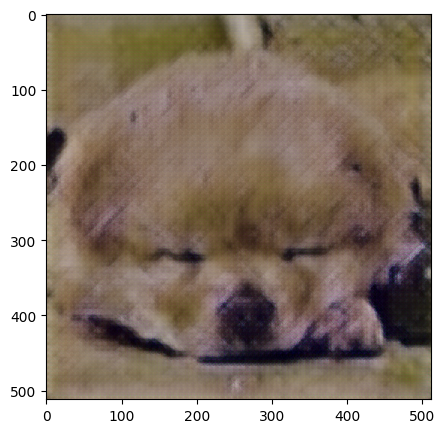

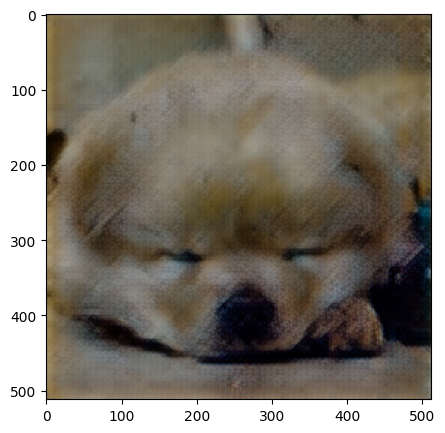

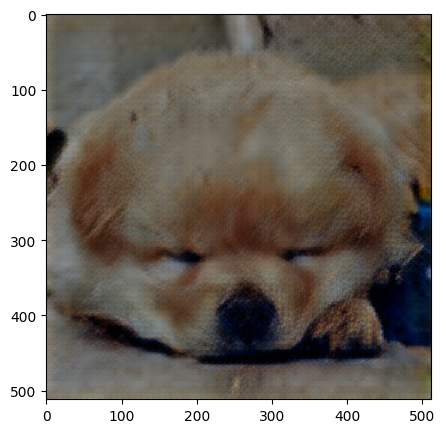

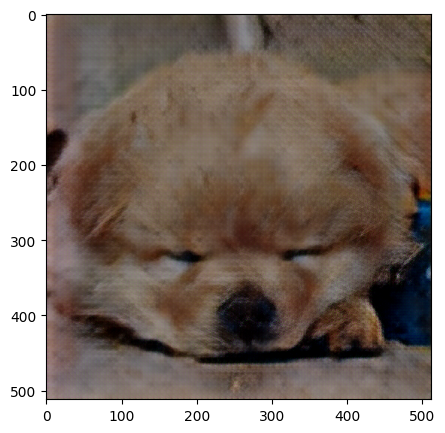

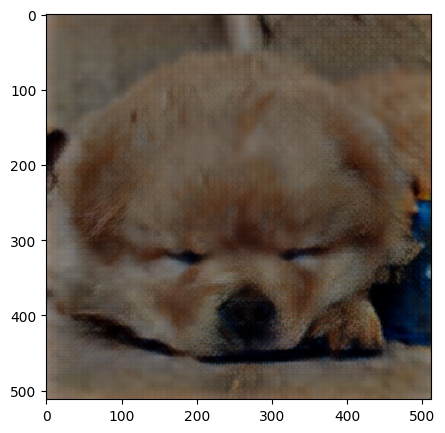

In [ ]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'

netD = Discriminator().to(device)
netG3 = Generator3().to(device)

vgg = FeatureExtractor().to(device).eval()

criterionD = nn.BCELoss()
criterionG = nn.MSELoss()

lr = 0.001

optimizerD = optim.Adam(netD.parameters(), lr=lr)
optimizerG = optim.Adam(netG3.parameters(), lr=lr)

n_epochs = 5

G3_losses = []
D3_losses = []

real_label = 1.
fake_label = 0.

fixed_items = next(iter(val_loader))
fixed_imgs = fixed_items[0].to(device)

for epoch in tqdm(range(n_epochs)):
  for i, data in enumerate(tqdm(train_loader)):
    netD.zero_grad()
    high_real = data[1].to(device)
    b_size = high_real.size(0)

    label = torch.full((b_size,), real_label, dtype=torch.float, device=device)

    outputD = netD(high_real).view(-1)
    errD_real = criterionD(outputD, label)

    errD_real.backward()
    D_x = outputD.mean().item()

    low_real = data[0].to(device)
    high_fake = netG3(low_real)
    label.fill_(fake_label)

    outputD = netD(high_fake.detach()).view(-1)
    errD_fake = criterionD(outputD, label)

    errD_fake.backward()
    D_G_z1 = outputD.mean().item()

    errD = errD_real + errD_fake
    optimizerD.step()

    # обновленный дискриминатор
    netG3.zero_grad()
    label.fill_(real_label)
    outputD = netD(high_fake).view(-1)

    generator_err = 1e-3 * criterionD(outputD, label)
    content_err = criterionG(vgg(high_fake), vgg(high_real))

    errG = generator_err + content_err

    errG.backward()
    optimizerG.step()

    D_G_z2 = outputD.mean().item()

    if i % 10 == 0:
        print('[%d/%d][%d/%d]\tLoss_D: %.4f\tLoss_G: %.4f\tD(x): %.4f\tD(G(z)): %.4f / %.4f'
              % (epoch+1, n_epochs, i, len(train_loader),
                errD.item(), errG.item(), D_x, D_G_z1, D_G_z2))

    G3_losses.append(errG.item())
    D3_losses.append(errD.item())

  fake = netG3(fixed_imgs)
  fig, ax1 = plt.subplots(1,1, figsize = (5, 5))
  ax1.imshow(fake.cpu().detach().numpy().squeeze().transpose((1, 2, 0)))
  fig.show()

## Результаты

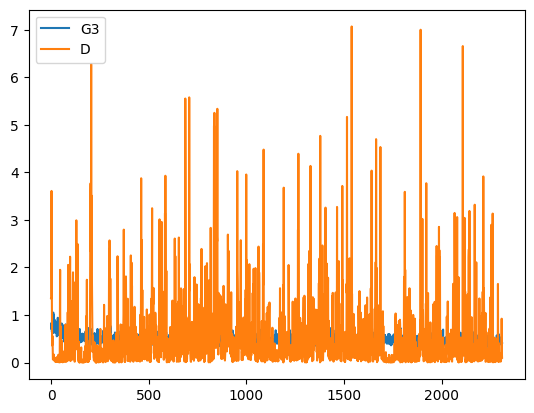

In [ ]:
plt.plot(G3_losses,label="G3")
plt.plot(D3_losses,label="D")
plt.legend()
plt.show()

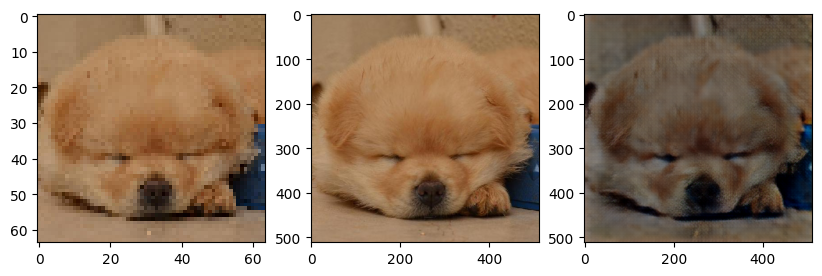

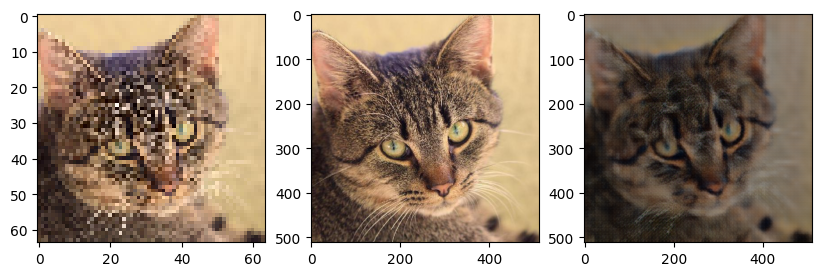

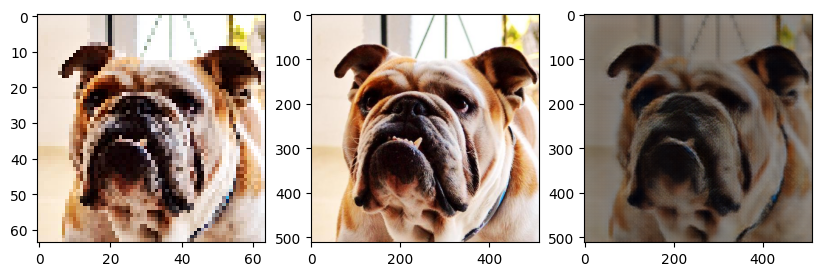

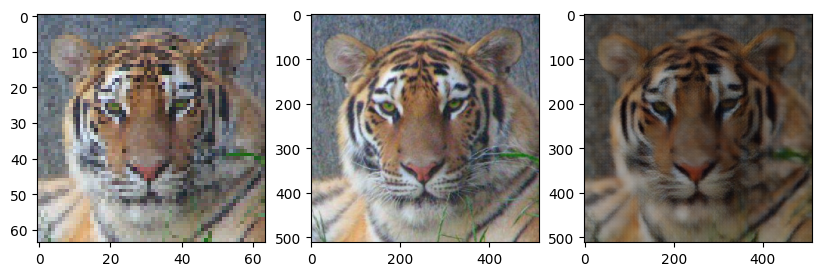

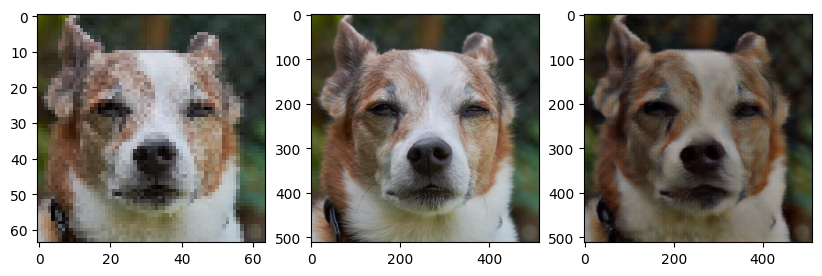

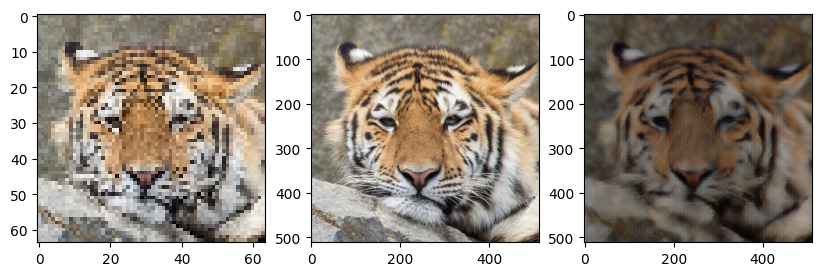

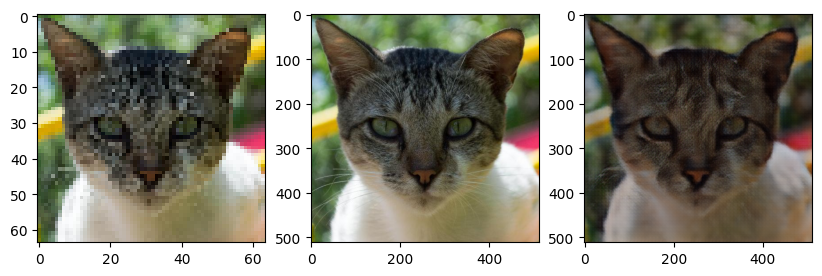

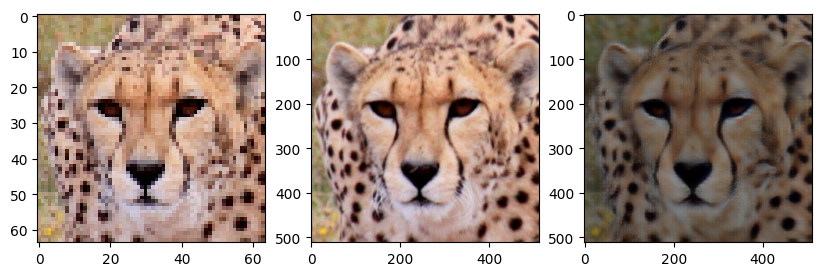

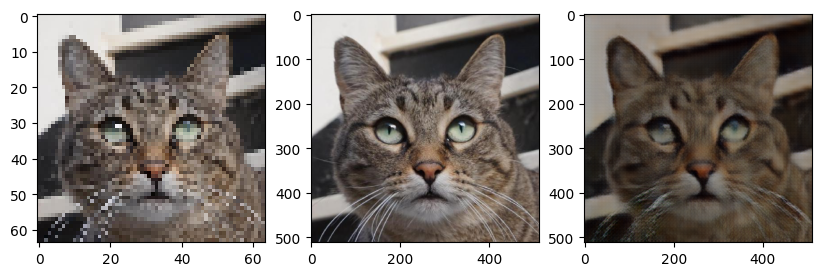

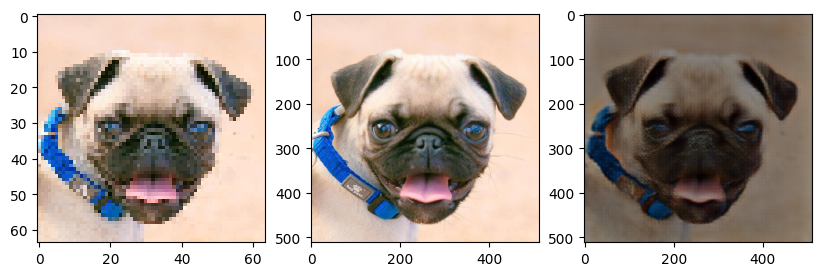

In [ ]:
netG3_imgs = []
for i in range(10):
  gen_imgs = netG3(val_set[i][0].unsqueeze(0).cuda())
  netG3_imgs.append(gen_imgs)
  fig, (ax1,ax2,ax3) = plt.subplots(1,3, figsize = (10, 5))
  ax1.imshow(val_set[i][0].cpu().detach().numpy().transpose((1, 2, 0)).squeeze())
  ax2.imshow(val_set[i][1].cpu().detach().numpy().transpose((1, 2, 0)).squeeze())
  ax3.imshow(gen_imgs.cpu().detach().numpy().squeeze().transpose((1, 2, 0)))
  fig.show()

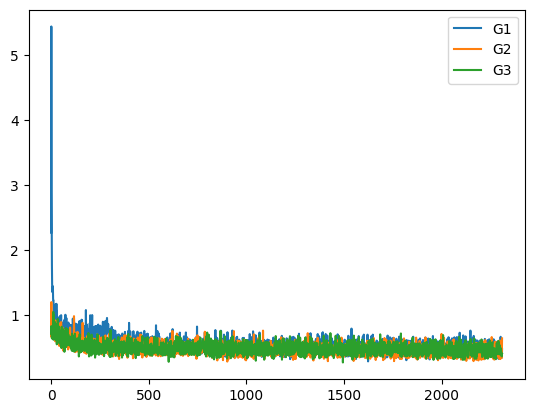

In [ ]:
plt.plot(G1_losses,label="G1")
plt.plot(G2_losses,label="G2")
plt.plot(G3_losses,label="G3")
plt.legend()
plt.show()

In [ ]:
for i in range(10):
  fig, (ax1,ax2,ax3,ax4,ax5) = plt.subplots(1,5, figsize = (20, 10))
  ax1.imshow(val_set[i][0].cpu().detach().numpy().transpose((1, 2, 0)).squeeze())
  ax2.imshow(val_set[i][1].cpu().detach().numpy().transpose((1, 2, 0)).squeeze())
  ax3.imshow(netG1(val_set[i][0].unsqueeze(0).cuda()).cpu().detach().numpy().squeeze().transpose((1, 2, 0)))
  ax4.imshow(netG2(val_set[i][0].unsqueeze(0).cuda()).cpu().detach().numpy().squeeze().transpose((1, 2, 0)))
  ax5.imshow(netG3(val_set[i][0].unsqueeze(0).cuda()).cpu().detach().numpy().squeeze().transpose((1, 2, 0)))
  fig.show()